In [ ]:
import warnings

import numpy as np
from numpy import array
import pandas as pd
from pandas import concat
import math
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from statsmodels.tsa.arima_model import ARIMA
from sklearn.model_selection import ParameterGrid
from statsmodels.tsa.stattools import kpss

pd.plotting.register_matplotlib_converters()

warnings.filterwarnings("ignore")

import logging
logger = logging.getLogger()
logger.setLevel(logging.CRITICAL)

def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [ ]:
df=pd.read_csv("/content/Market_Mix_Modelling.csv")

In [ ]:
df

,DEPOT,STOCKIEST NAME,STOCKIEST CODE,HQ,PRODUCTS,PRODUCT DIVISION,PTS,OPENING,RECEIPT,SALES,...,DIVISI0N,ASM,0PENING VALUE,RECEIPT VALUE,SALES VALUE,CLOSING VALUE,TRANSIT VALUE,TOTAL CLOSING VALUE,BRANCH OUT VALUE,MONTH
0,VIJAYAWADA,UMA SHANKAR MEDICAL AGENCIES,330000032,VIJAYAWADA SPARTA,Nixiyax 15 'S,SPARTA,182.44,0,0,0,...,SPARTA,MURALI,0.00,0.00,0.00,0.00,0.0,0.00,0,2020-01-01
1,VIJAYAWADA,SAI BHASKAR MEDICAL DISTRIBUTORS,330000005,NELLORE SPARTA,Androanagen Tablets 10S,SPARTA,317.29,0,18,0,...,SPARTA,MURALI,0.00,2405.34,0.00,2405.34,0.0,2405.34,0,2020-01-01
2,VIJAYAWADA,S.P.D MEDICAL AGENCIES,330000103,NELLORE SPARTA,Zinikam Cream 200 G,SPARTA,182.44,0,0,0,...,SPARTA,MURALI,0.00,0.00,0.00,0.00,0.0,0.00,0,2020-01-01
3,VIJAYAWADA,ASWINI ENTERPRISES,330000080,VIJAYAWADA SPARTA,Aknay Bar 100GM,SPARTA,128.14,0,0,0,...,SPARTA,MURALI,0.00,0.00,0.00,0.00,0.0,0.00,0,2020-01-01
4,VIJAYAWADA,ASWINI ENTERPRISES,330000080,VIJAYAWADA SPARTA,Zinikam Cream 200 G,SPARTA,597.86,0,0,0,...,SPARTA,MURALI,0.00,0.00,0.00,0.00,0.0,0.00,0,2020-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49994,HUBLI,CHIRAG AGENCIES,334206836,MANGALORE SPARTA,Androanagen Solution 100Ml,SPARTA,317.29,5,0,5,...,SPARTA,ARPAN GANGULY,2989.30,0.00,2989.30,0.00,0.0,0.00,0,2023-12-31
49995,HUBLI,WEST COAST AGENCIES,317923801,VIZAG SPARTA,Androanagen Tablets 10S,SPARTA,427.12,53,29,0,...,SPARTA,ARPAN GANGULY,7082.39,3875.27,0.00,10957.66,0.0,10957.66,0,2023-12-31
49996,BANGALORE,SHIVA SAI PHARMA DISTRIBUTORS,326210349,BANGALORE SPARTA,Nixiyax 15 'S,SPARTA,268.47,90,0,7,...,SPARTA,SATHYA K S & ARPAN GANGULY,24712.20,0.00,1922.06,22790.14,0.0,22790.14,0,2023-12-31
49997,AMBALA,MILLENNIUM MEDICARE PVT. LTD.,126300825,KOLHAPUR SPARTA,Androanagen Tablets 10S,SPARTA,268.47,0,0,0,...,SPARTA,MURALI,0.00,0.00,0.00,0.00,0.0,0.00,0,2023-12-31


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49999 entries, 0 to 49998
Data columns (total 25 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   DEPOT                49999 non-null  object 
 1   STOCKIEST NAME       49999 non-null  object 
 2   STOCKIEST CODE       49999 non-null  int64  
 3   HQ                   49999 non-null  object 
 4   PRODUCTS             49999 non-null  object 
 5   PRODUCT DIVISION     49999 non-null  object 
 6   PTS                  49999 non-null  float64
 7   OPENING              49999 non-null  int64  
 8   RECEIPT              49999 non-null  int64  
 9   SALES                49999 non-null  int64  
 10  CL0SING              49999 non-null  int64  
 11  TRANSIT              49999 non-null  int64  
 12  T0TAL CL0SING        49999 non-null  int64  
 13  BRANCH 0UT           49999 non-null  int64  
 14  RSM                  49999 non-null  object 
 15  DIVISI0N             49999 non-null 

In [ ]:
df.duplicated().sum()


0

In [ ]:
df.describe()

,STOCKIEST CODE,PTS,OPENING,RECEIPT,SALES,CL0SING,TRANSIT,T0TAL CL0SING,BRANCH 0UT,0PENING VALUE,RECEIPT VALUE,SALES VALUE,CLOSING VALUE,TRANSIT VALUE,TOTAL CLOSING VALUE,BRANCH OUT VALUE
count,4.999900e+04,49999.000000,49999.000000,49999.000000,49999.000000,49999.000000,49999.000000,49999.000000,49999.0,49999.000000,49999.000000,49999.000000,49999.000000,49999.000000,49999.000000,49999.0
mean,2.970419e+08,258.868265,10.889118,3.894938,4.347527,10.436529,0.030041,10.466569,0.0,2501.271704,851.526311,959.556357,2393.241658,5.586927,2398.828585,0.0
std,1.092357e+08,142.545145,17.481891,12.098172,11.783734,18.372566,1.144513,18.434950,0.0,4640.443601,3089.540053,2907.252303,5006.246277,188.004697,5011.526535,0.0
min,1.100000e+08,126.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
25%,2.151484e+08,133.630000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
50%,3.212467e+08,198.310000,6.000000,0.000000,0.000000,4.000000,0.000000,4.000000,0.0,1134.000000,0.000000,0.000000,756.000000,0.000000,756.000000,0.0
75%,3.500000e+08,317.290000,14.000000,0.000000,4.000000,13.000000,0.000000,13.000000,0.0,3172.900000,0.000000,854.240000,2974.650000,0.000000,2974.650000,0.0
max,4.500000e+08,597.860000,544.000000,300.000000,330.000000,408.000000,180.000000,408.000000,0.0,99247.360000,55600.980000,59188.140000,106419.080000,24053.400000,106419.080000,0.0


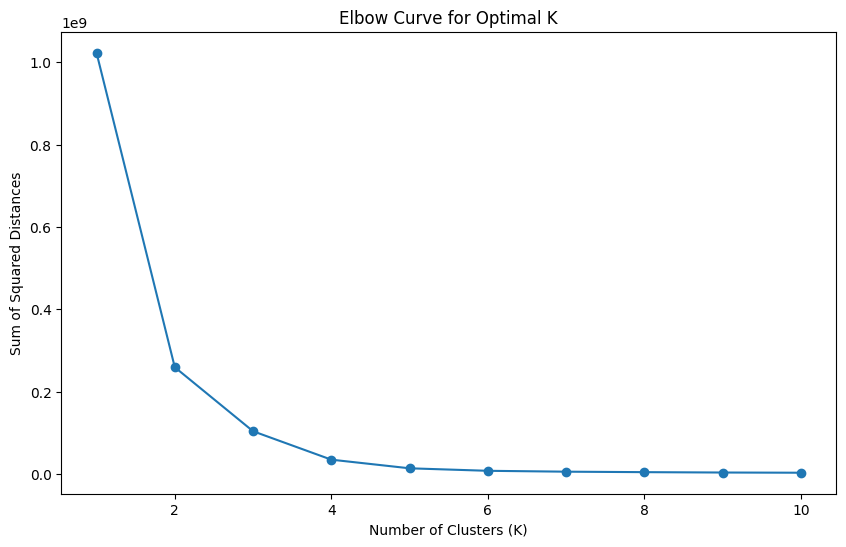

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Assuming df is your DataFrame and 'PTS' and 'SALES VALUE' are the features you want to use
X = df[['PTS', 'SALES']]

# Range of k values to try
k_values = range(1, 11)

# Sum of squared distances for each k
inertia_values = []

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    inertia_values.append(kmeans.inertia_)

# Plotting the elbow curve
plt.figure(figsize=(10, 6))
plt.plot(k_values, inertia_values, marker='o')
plt.title('Elbow Curve for Optimal K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Sum of Squared Distances')
plt.show()


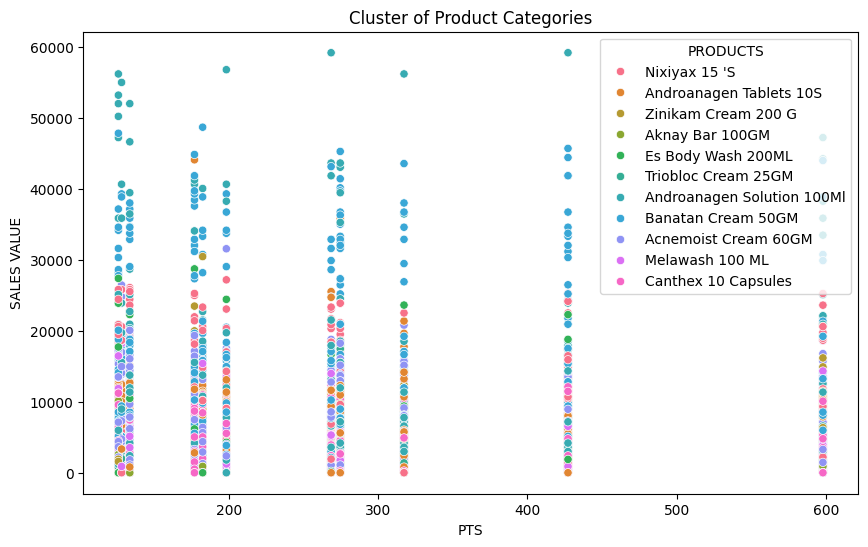

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df is your DataFrame
plt.figure(figsize=(10, 6))
sns.scatterplot(x='PTS', y='SALES VALUE', hue='PRODUCTS', data=df)
plt.title('Cluster of Product Categories')
plt.xlabel('PTS')
plt.ylabel('SALES VALUE')
plt.show()

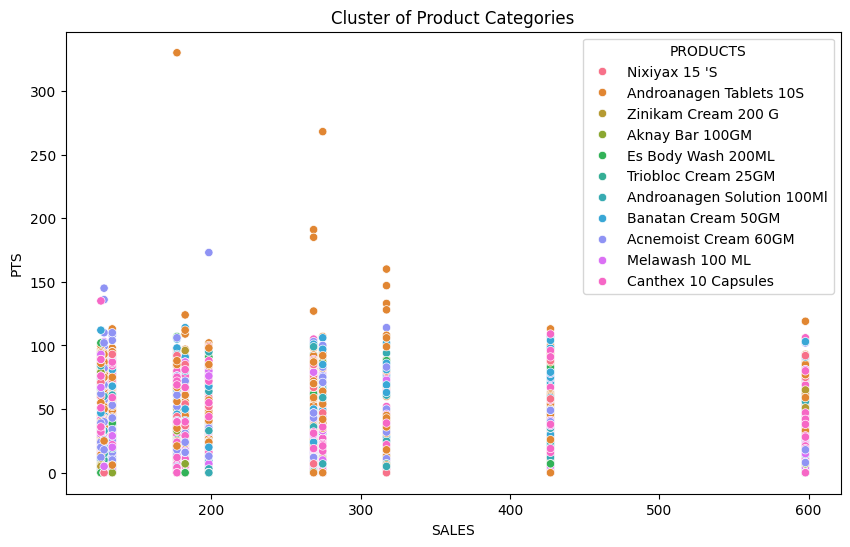

In [ ]:
# Assuming df is your DataFrame
plt.figure(figsize=(10, 6))
sns.scatterplot(x='PTS', y='SALES', hue='PRODUCTS', data=df)
plt.title('Cluster of Product Categories')
plt.xlabel('SALES')
plt.ylabel('PTS')
plt.show()

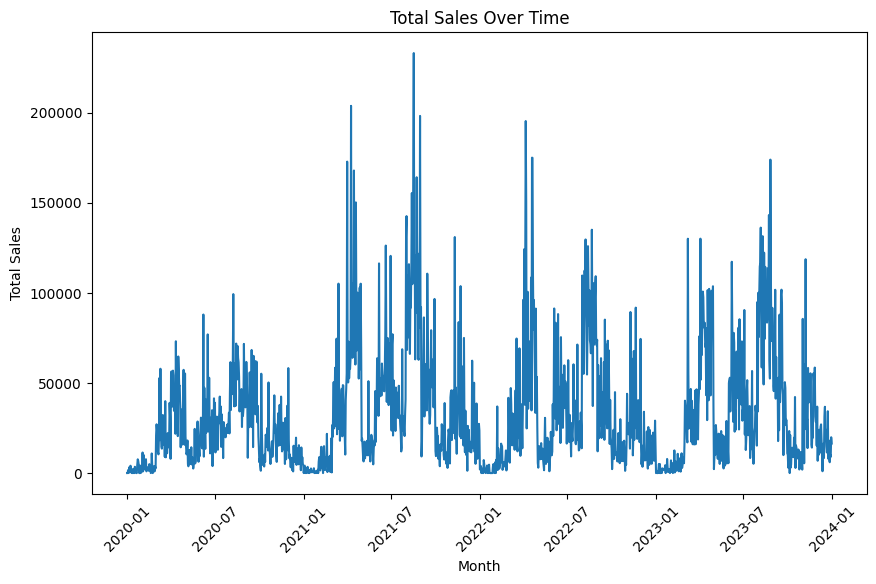

In [ ]:
# Convert 'MONTH' column to datetime format
df['MONTH'] = pd.to_datetime(df['MONTH'])

# Group by month and sum the sales
monthly_sales = df.groupby('MONTH')['SALES VALUE'].sum()

# Plotting
plt.figure(figsize=(10, 6))
sns.lineplot(x=monthly_sales.index, y=monthly_sales.values)
plt.xlabel('Month')
plt.ylabel('Total Sales')
plt.title('Total Sales Over Time')
plt.xticks(rotation=45)
plt.show()

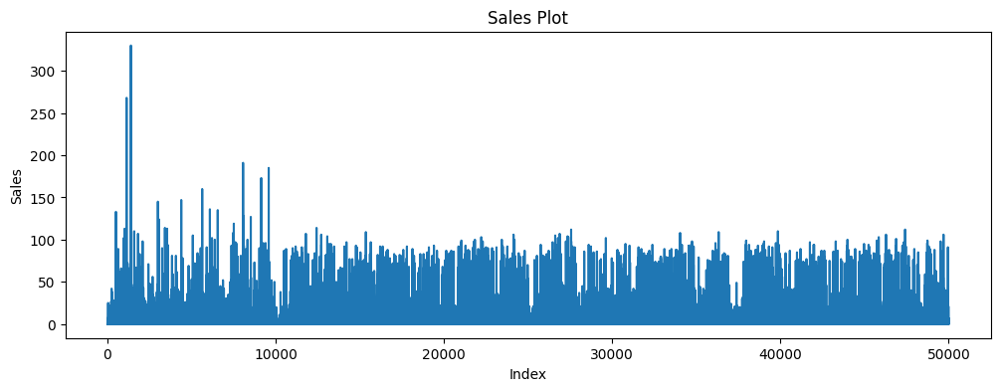

In [ ]:
import matplotlib.pyplot as plt

# Plotting the 'SALES' column
df['SALES'].plot(figsize=(12,4))

# Adding labels and title
plt.xlabel('Index')
plt.ylabel('Sales')
plt.title('Sales Plot')

# Display the plot
plt.show()


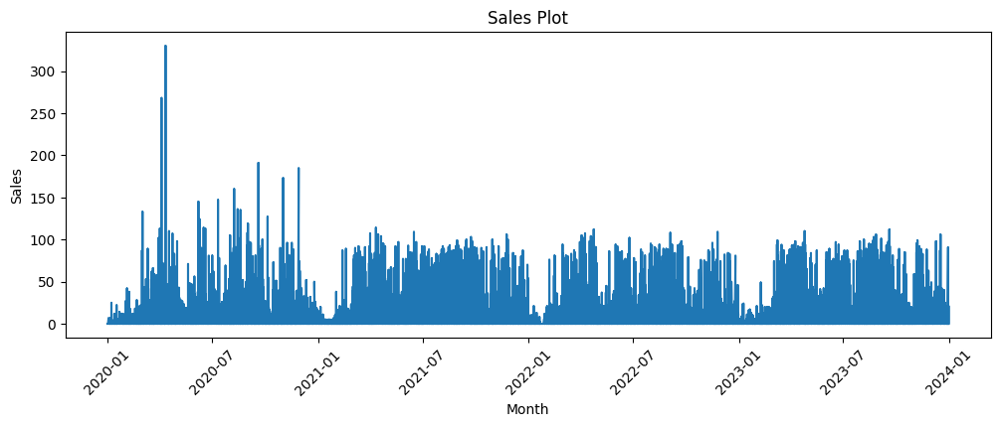

In [ ]:
import matplotlib.pyplot as plt

# Convert 'MONTH' column to datetime format
df['MONTH'] = pd.to_datetime(df['MONTH'])

# Plotting the 'SALES' column against 'MONTH'
plt.figure(figsize=(12, 4))
plt.plot(df['MONTH'], df['SALES'])
plt.xlabel('Month')
plt.ylabel('Sales')
plt.title('Sales Plot')
plt.xticks(rotation=45)
plt.show()


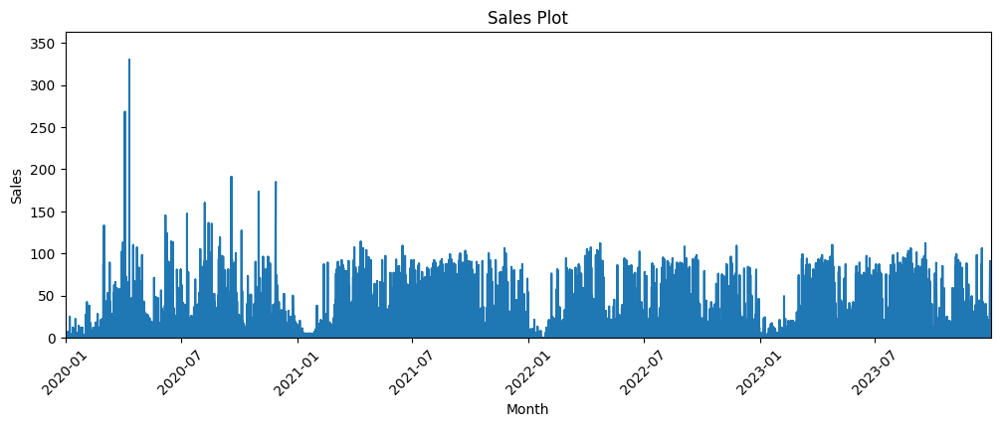

In [ ]:
import matplotlib.pyplot as plt

# Convert 'MONTH' column to datetime format
df['MONTH'] = pd.to_datetime(df['MONTH'])

# Plotting the 'SALES' column against 'MONTH'
plt.figure(figsize=(12, 4))
plt.plot(df['MONTH'], df['SALES'])
plt.xlabel('Month')
plt.ylabel('Sales')
plt.title('Sales Plot')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

# Set limits for x-axis (months) and y-axis (sales)
plt.xlim(df['MONTH'].min(), df['MONTH'].max())  # Set x-axis limits to the range of the data
plt.ylim(0, df['SALES'].max() * 1.1)  # Set y-axis limits to 10% more than the maximum sales value

plt.show()


In [ ]:
dfatc_daily = pd.read_csv('salesdaily.csv',encoding='latin1')

In [ ]:
dfatc_daily

,date,Acnemoist Cream 60GM,Aknay Bar 100GM,Androanagen Solution 100Ml,Androanagen Tablets 10S,Banatan Cream 50GM,Canthex 10 Capsules,Es Body Wash 200ML,Melawash 100 ML,Nixiyax 15 'S,Triobloc Cream 25GM,Zinikam Cream 200 G,Month,Year,Weekday Name,Hour,Hours,index
0,01-01-2020,7,0,0,12,0,0,0,0,0,0,4,1,2020,Wednesday,0,276,1
1,02-01-2020,7,0,0,0,0,9,0,0,0,0,0,1,2020,Thursday,0,276,2
2,03-01-2020,0,0,0,0,0,0,0,0,0,0,0,1,2020,Friday,0,276,3
3,04-01-2020,0,0,1,0,0,0,0,0,0,0,0,1,2020,Saturday,0,276,4
4,05-01-2020,0,0,0,0,0,0,0,0,0,0,0,1,2020,Sunday,0,276,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1456,27-12-2023,4,0,2,98,0,11,0,0,2,2,0,12,2023,Wednesday,0,276,1457
1457,28-12-2023,5,7,25,6,0,0,4,0,6,0,0,12,2023,Thursday,0,276,1458
1458,29-12-2023,22,0,19,0,0,7,0,0,0,0,0,12,2023,Friday,0,276,1459
1459,30-12-2023,20,4,9,6,0,5,0,0,14,0,0,12,2023,Saturday,0,276,1460


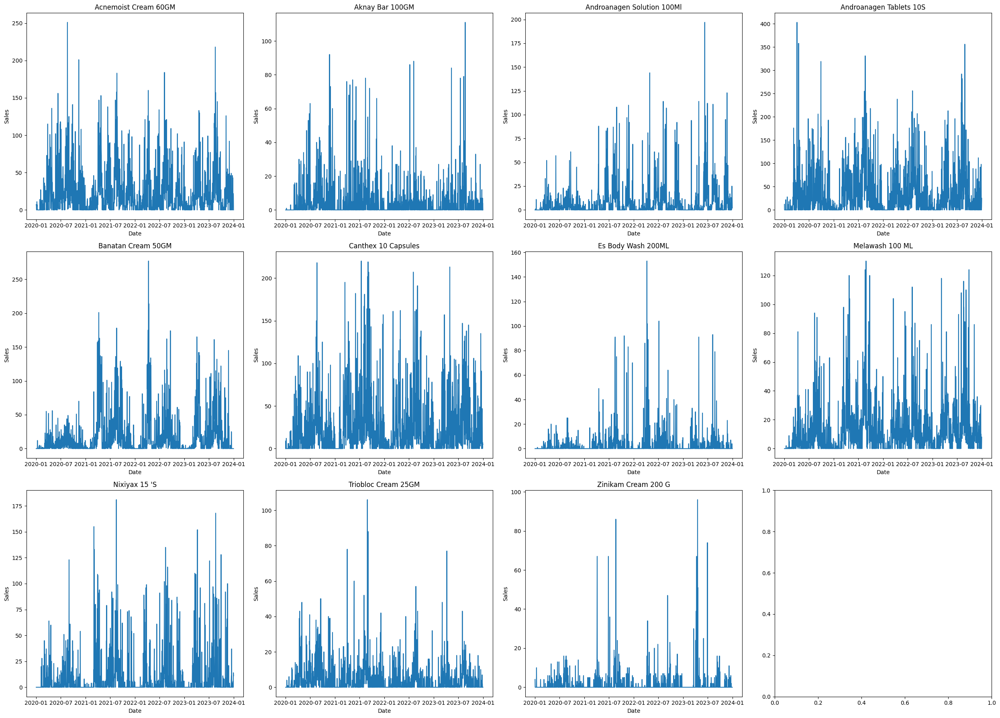

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Convert 'date' column to datetime format with the correct format
dfatc_daily['date'] = pd.to_datetime(dfatc_daily['date'], format='%d-%m-%Y')

# Create subplots for each product
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(25, 18))  # Increase figsize here
axes = axes.flatten()

# Plot sales of each product
for i, (product, ax) in enumerate(zip(dfatc_daily.columns[1:-6], axes)):
    sns.lineplot(data=dfatc_daily, x='date', y=product, ax=ax)
    ax.set_title(product)
    ax.set_xlabel('Date')
    ax.set_ylabel('Sales')

# Adjust layout
plt.tight_layout()
plt.show()



### Seasonality analysis

The seasonality patterns can be explored in detail by using boxplots.

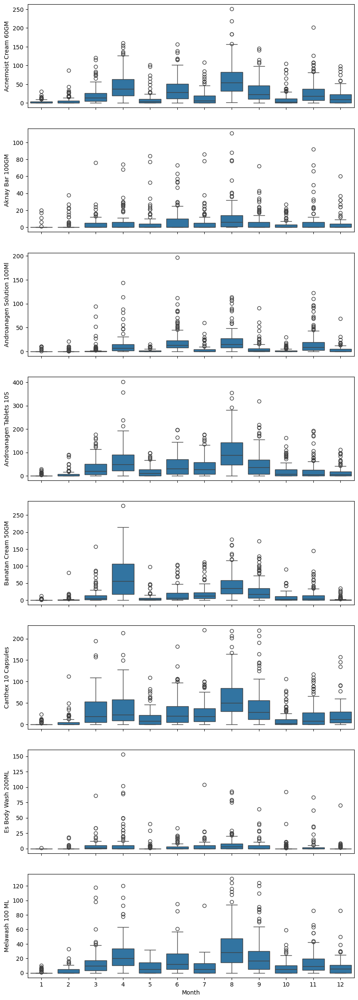

In [ ]:
import seaborn as sns
dfatc_daily = pd.read_csv('salesdaily.csv',encoding='latin1')
fig, axes = plt.subplots(8, 1, figsize=(10, 30), sharex=True)
for name, ax in zip(['Acnemoist Cream 60GM','Aknay Bar 100GM','Androanagen Solution 100Ml','Androanagen Tablets 10S', 'Banatan Cream 50GM','Canthex 10 Capsules','Es Body Wash 200ML','Melawash 100 ML',"Nixiyax 15 'S",'Triobloc Cream 25GM','Zinikam Cream 200 G'], axes):
    sns.boxplot(data=dfatc_daily, x='Month', y=name, ax=ax)

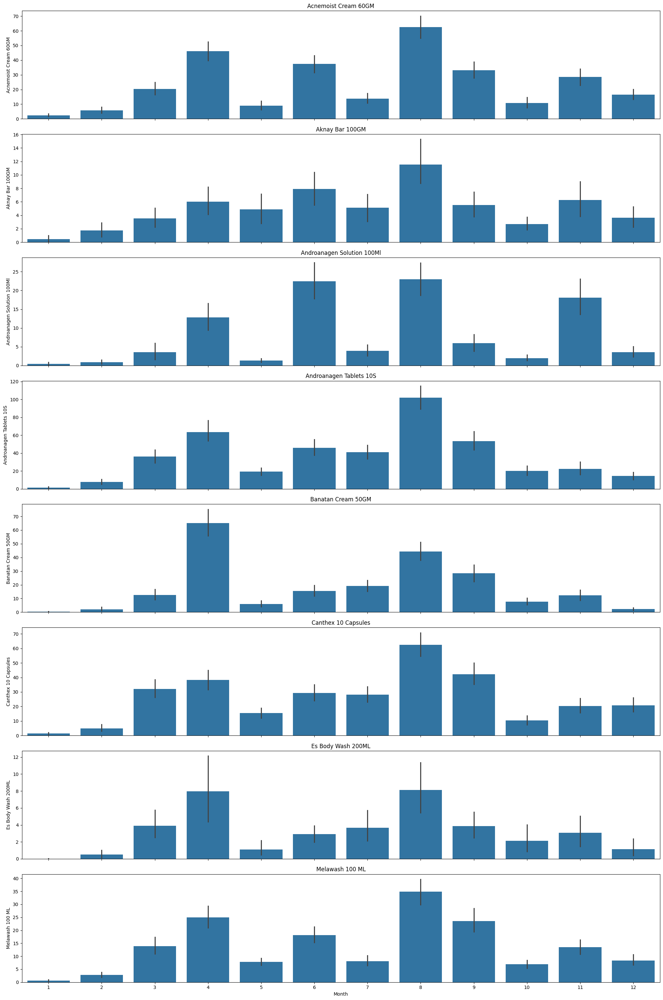

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Load the data
dfatc_daily = pd.read_csv('salesdaily.csv', encoding='latin1')

# Create subplots for each product
fig, axes = plt.subplots(8, 1, figsize=(20, 30), sharex=True)

# Plot bar plots for each product with KDE
for name, ax in zip(['Acnemoist Cream 60GM','Aknay Bar 100GM','Androanagen Solution 100Ml','Androanagen Tablets 10S', 'Banatan Cream 50GM','Canthex 10 Capsules','Es Body Wash 200ML','Melawash 100 ML',"Nixiyax 15 'S",'Triobloc Cream 25GM','Zinikam Cream 200 G'], axes):
    sns.barplot(data=dfatc_daily, x='Month', y=name, ax=ax)  # Apply KDE
    ax.set_title(name)  # Set title for each subplot

# Show the plot
plt.tight_layout()
plt.show()


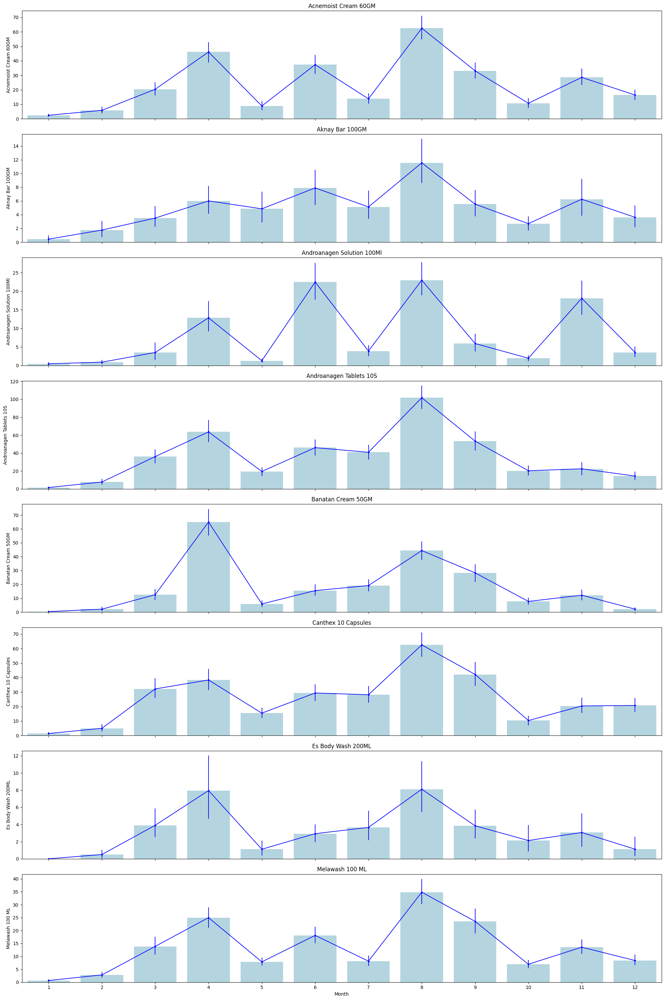

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Load the data
dfatc_daily = pd.read_csv('salesdaily.csv', encoding='latin1')

# Create subplots for each product
fig, axes = plt.subplots(8, 1, figsize=(20, 30), sharex=True)

# Plot bar plots for each product
for name, ax in zip(['Acnemoist Cream 60GM','Aknay Bar 100GM','Androanagen Solution 100Ml','Androanagen Tablets 10S', 'Banatan Cream 50GM','Canthex 10 Capsules','Es Body Wash 200ML','Melawash 100 ML',"Nixiyax 15 'S",'Triobloc Cream 25GM','Zinikam Cream 200 G'], axes):
    sns.barplot(data=dfatc_daily, x='Month', y=name, ax=ax, color='lightblue', ci=None)  # Bar plot
    sns.pointplot(data=dfatc_daily, x='Month', y=name, ax=ax, color='blue', scale=0.5)  # Point plot
    ax.set_title(name)  # Set title for each subplot

# Show the plot
plt.tight_layout()
plt.show()


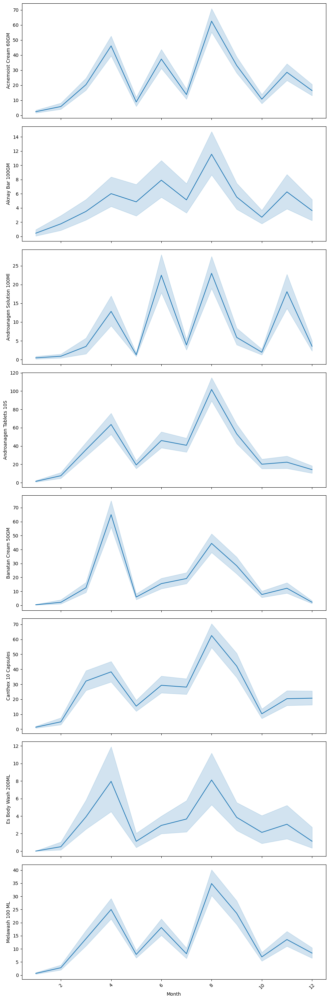

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Load the DataFrame
dfatc_daily = pd.read_csv('salesdaily.csv', encoding='latin1')

# Create subplots
fig, axes = plt.subplots(8, 1, figsize=(10, 30), sharex=True)

# Plot line plots for each product
for name, ax in zip(['Acnemoist Cream 60GM', 'Aknay Bar 100GM', 'Androanagen Solution 100Ml', 'Androanagen Tablets 10S', 'Banatan Cream 50GM', 'Canthex 10 Capsules', 'Es Body Wash 200ML', 'Melawash 100 ML', "Nixiyax 15 'S", 'Triobloc Cream 25GM', 'Zinikam Cream 200 G'], axes):
    sns.lineplot(data=dfatc_daily, x='Month', y=name, ax=ax)
    ax.set_xlabel('Month')  # Set x-axis label

    # Reverse x-axis
    ax.invert_xaxis()

# Rotate x-axis labels for better visibility
plt.xticks(rotation=45)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


Below, boxplots on a weekly scale are shown, for the purpose of exploring the weakly seasonality. Some weekly seasonality is visible.

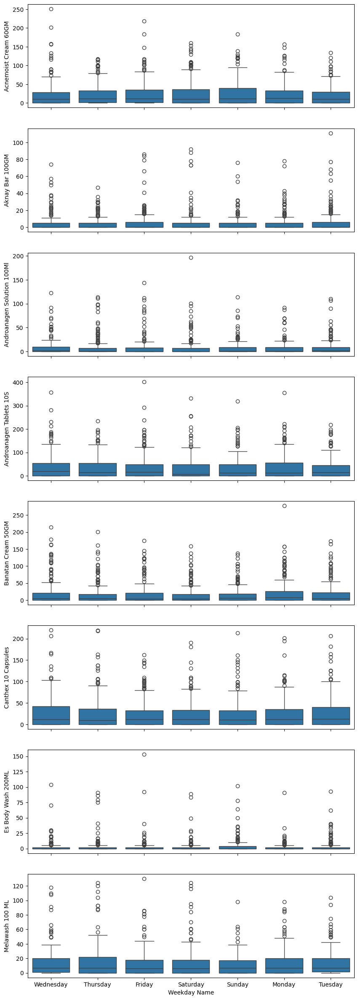

In [ ]:
fig, axes = plt.subplots(8, 1, figsize=(10, 30), sharex=True)
for name, ax in zip(['Acnemoist Cream 60GM','Aknay Bar 100GM','Androanagen Solution 100Ml','Androanagen Tablets 10S', 'Banatan Cream 50GM','Canthex 10 Capsules','Es Body Wash 200ML','Melawash 100 ML',"Nixiyax 15 'S",'Triobloc Cream 25GM','Zinikam Cream 200 G'], axes):
    sns.boxplot(data=dfatc_daily, x='Weekday Name', y=name, ax=ax)

Another visualization that can be useful for discovering seasonality patterns is related to rolling window means. Analysis below shows 30-day and 365-day rolling mean and 30-day rolling standard deviation of sales data.

In [ ]:
dfatc_daily.head()

,datum,Acnemoist Cream 60GM,Aknay Bar 100GM,Androanagen Solution 100Ml,Androanagen Tablets 10S,Banatan Cream 50GM,Canthex 10 Capsules,Es Body Wash 200ML,Melawash 100 ML,Nixiyax 15 'S,Triobloc Cream 25GM,Zinikam Cream 200 G,Index,Year
0,2020-01-06,25,0,1,12,0,21,0,0,0,0,4,1,2020
1,2020-01-13,13,1,11,22,14,0,0,0,0,6,10,2,2020
2,2020-01-20,0,0,0,0,1,6,1,2,0,1,0,3,2020
3,2020-01-27,0,0,0,28,12,12,0,1,0,6,0,4,2020
4,2020-02-03,42,0,0,45,0,20,0,0,0,0,0,5,2020


In [ ]:
dfatc_daily.tail()

,datum,Acnemoist Cream 60GM,Aknay Bar 100GM,Androanagen Solution 100Ml,Androanagen Tablets 10S,Banatan Cream 50GM,Canthex 10 Capsules,Es Body Wash 200ML,Melawash 100 ML,Nixiyax 15 'S,Triobloc Cream 25GM,Zinikam Cream 200 G,Index,Year
204,2023-12-04,218,8,96,165,33,81,7,59,6,30,4,205,2023
205,2023-12-11,114,31,26,187,5,185,5,61,0,0,11,206,2023
206,2023-12-18,100,14,29,78,53,266,0,63,61,10,5,207,2023
207,2023-12-25,107,12,18,195,0,316,7,92,6,11,10,208,2023
208,2024-01-01,94,17,60,135,0,72,4,18,38,2,0,209,2024


In [ ]:
column_names = dfatc_daily.columns.tolist()
print(column_names)


['datum', 'Acnemoist Cream 60GM', 'Aknay Bar 100GM', 'Androanagen Solution 100Ml', 'Androanagen Tablets 10S', 'Banatan Cream 50GM', 'Canthex 10 Capsules', 'Es Body Wash 200ML', 'Melawash 100 ML', "Nixiyax 15 'S", 'Triobloc Cream 25GM', 'Zinikam Cream 200 G', 'Index']


In [ ]:
# Convert 'date' column to datetime format
dfatc_daily['datum'] = pd.to_datetime(dfatc_daily['datum'], format='%d-%m-%Y')

# Extract year from the 'date' column
dfatc_daily['Year'] = dfatc_daily['datum'].dt.year

# Count the number of unique years
num_years = dfatc_daily['Year'].unique()

print("Number of unique years:", num_years)


Number of unique years: [2020 2021 2022 2023 2024]


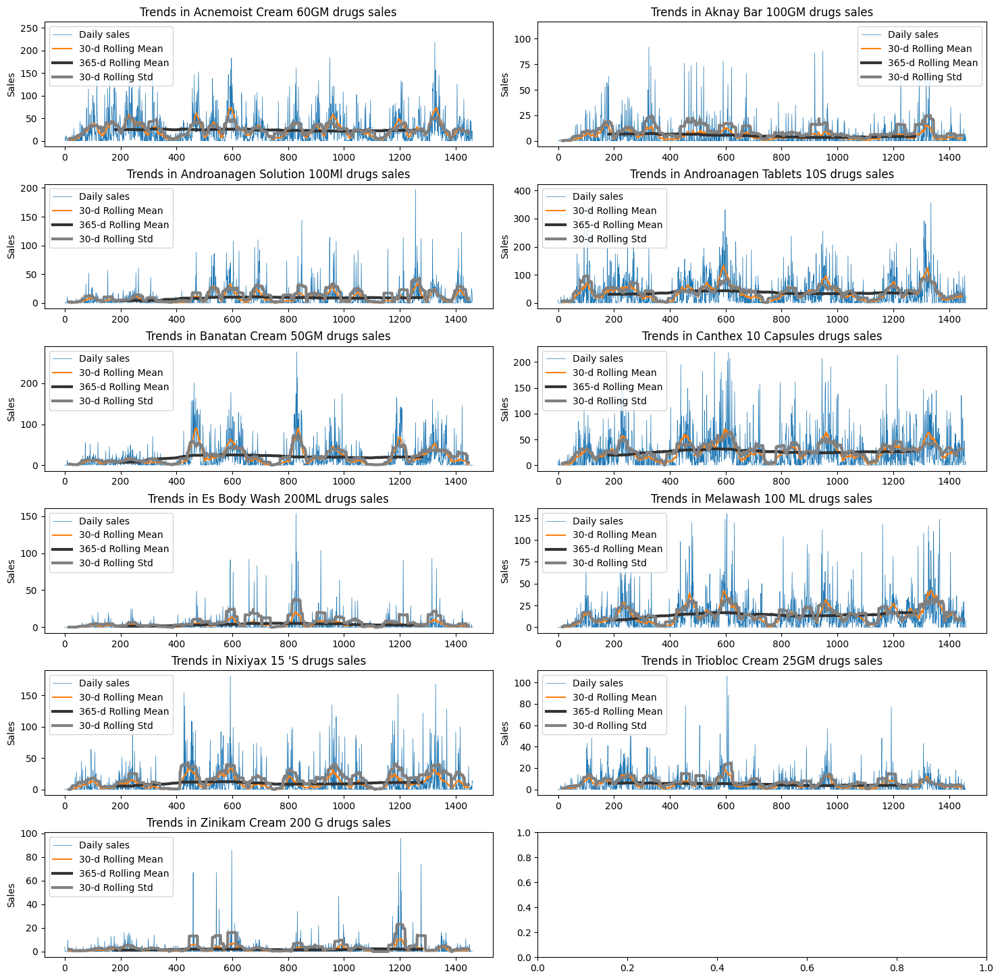

In [ ]:
dfatc_daily=pd.read_csv('salesdaily.csv')
cols_plot = ['Acnemoist Cream 60GM','Aknay Bar 100GM','Androanagen Solution 100Ml','Androanagen Tablets 10S', 'Banatan Cream 50GM','Canthex 10 Capsules','Es Body Wash 200ML','Melawash 100 ML',"Nixiyax 15 'S",'Triobloc Cream 25GM','Zinikam Cream 200 G']
dfatc_365d = dfatc_daily[cols_plot].rolling(window=365, center=True).mean()
dfatc_30d = dfatc_daily[cols_plot].rolling(30, center=True).mean()
dfatc_std = dfatc_daily[cols_plot].rolling(30, center=True).std()
subplotindex=0
numrows=6
numcols=2
fig, ax = plt.subplots(numrows, numcols, figsize=(18, 18))
plt.subplots_adjust(wspace=0.1, hspace=0.3)

for x in cols_plot:
    # rowindex = subplotindex // numcols  # Use integer division to get the row index
    # colindex = subplotindex % numcols   # Use modulo to get the column index
    rowindex=math.floor(subplotindex/numcols)
    colindex=subplotindex-(rowindex*numcols)
    ax[rowindex,colindex].plot(dfatc_daily.loc[:,x], linewidth=0.5, label='Daily sales')
    ax[rowindex,colindex].plot(dfatc_30d.loc[:,x], label='30-d Rolling Mean')
    ax[rowindex,colindex].plot(dfatc_365d.loc[:,x], color='0.2', linewidth=3, label='365-d Rolling Mean')
    ax[rowindex,colindex].plot(dfatc_std.loc[:,x], color='0.5', linewidth=3, label='30-d Rolling Std')
    ax[rowindex,colindex].set_ylabel('Sales')
    ax[rowindex,colindex].legend()
    ax[rowindex,colindex].set_title('Trends in '+x+' drugs sales');
    subplotindex=subplotindex+1
plt.show()

Image below shows trends for each of the drug categories, represented by the 365-d rolling means for each of those categories.

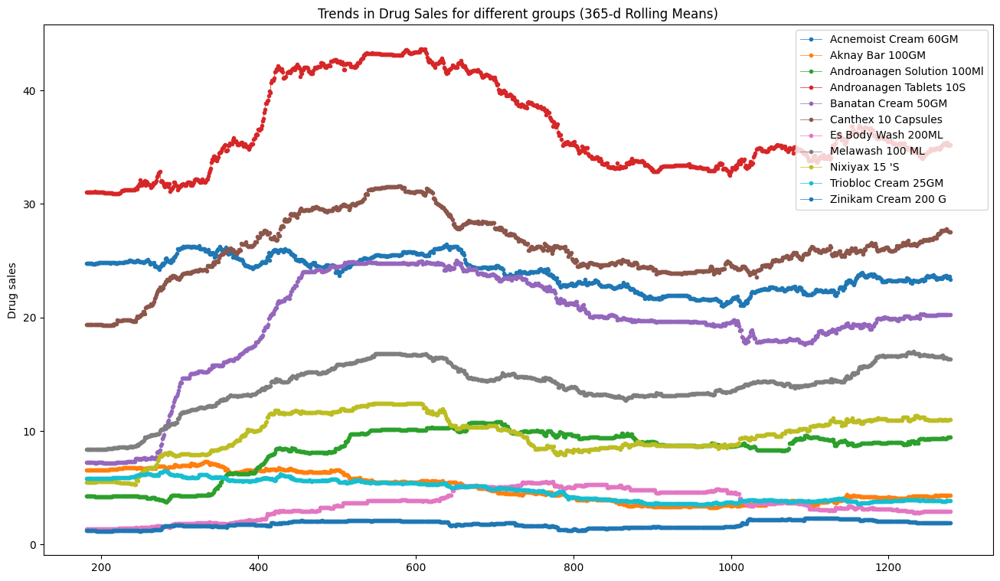

In [ ]:
fig, ax = plt.subplots(figsize=(16,9))
for nm in cols_plot:
    ax.plot(dfatc_365d[nm], label=nm, marker='.', linestyle='-', linewidth=0.5)
    ax.legend()
    ax.set_ylabel('Drug sales')
    ax.set_title('Trends in Drug Sales for different groups (365-d Rolling Means)');

Trends and seasonality can be explored in time series decomposition view, based on 30d rolling means.

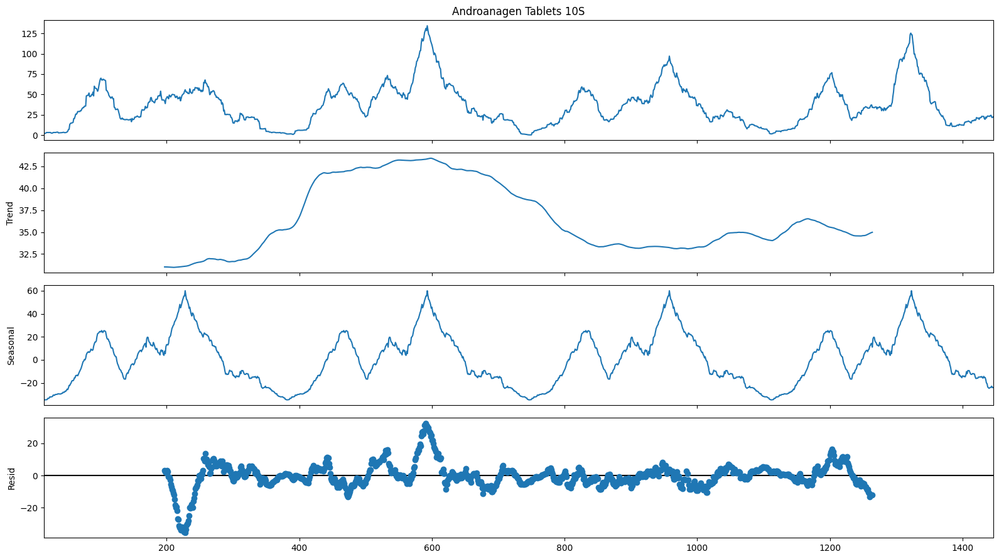

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
result = seasonal_decompose(dfatc_daily['Androanagen Tablets 10S'].rolling(30, center=True).mean().dropna(), period=365, filt=None)
plt.rcParams["figure.figsize"] = (16,9)
result.plot()
plt.show()

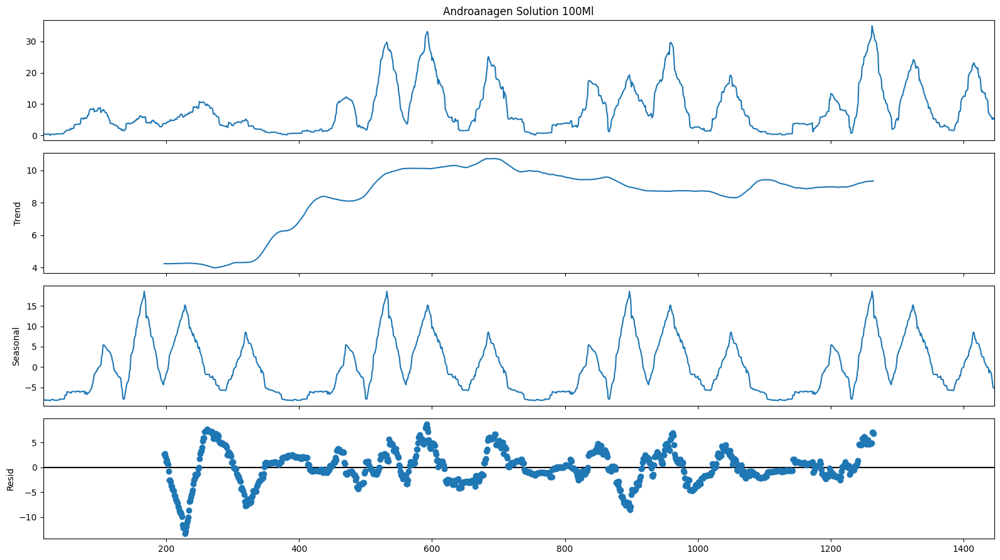

In [ ]:
result = seasonal_decompose(dfatc_daily['Androanagen Solution 100Ml'].rolling(30, center=True).mean().dropna(), period=365, filt=None)
plt.rcParams["figure.figsize"] = (16,9)
result.plot()
plt.show()

Function seasonal_decompose can be used for analysis of the portions of each component of time series. This is especially useful when determining uptake of residuals in data, based on the decomposed data. The volume of this uptake implies the predictability of the time series - higher the residuals, lower the predictability. To some extent, the proportion of the residuals when comparing with trend and seasonality can be also illustrated by the rolling means and standard deviation plots above.

In [ ]:
df = pd.read_csv('/content/salesweekly (1).csv')
for x in ['Acnemoist Cream 60GM','Aknay Bar 100GM','Androanagen Solution 100Ml','Androanagen Tablets 10S', 'Banatan Cream 50GM','Canthex 10 Capsules','Es Body Wash 200ML','Melawash 100 ML',"Nixiyax 15 'S",'Triobloc Cream 25GM','Zinikam Cream 200 G']:
    result = seasonal_decompose(df[x], period=52, model='additive')
    dfs = pd.concat([result.trend, result.seasonal, result.resid, result.observed], axis=1)
    dfs.columns = ['trend', 'seasonal', 'residuals', 'observed']
    dfs=dfs.dropna()
    res=dfs['residuals'].values
    obs=dfs['observed'].values
    resmean=np.mean(np.abs(res))
    obsmean=np.mean(np.abs(obs))
    perc=resmean*100/obsmean
    print(x+' RESMEAN:'+str(resmean)+', OBSMEAN:'+str(obsmean)+', PERC:'+str(perc)+'%')

Acnemoist Cream 60GM RESMEAN:39.44949754001306, OBSMEAN:167.13375796178343, PERC:23.603548451913305%
Aknay Bar 100GM RESMEAN:16.959453302648278, OBSMEAN:34.197452229299365, PERC:49.59273921616278%
Androanagen Solution 100Ml RESMEAN:28.132825062971893, OBSMEAN:59.738853503184714, PERC:47.09301135394591%
Androanagen Tablets 10S RESMEAN:73.56587561165969, OBSMEAN:253.21019108280254, PERC:29.053283873397827%
Banatan Cream 50GM RESMEAN:41.3481835513009, OBSMEAN:134.21656050955414, PERC:30.807065383230075%
Canthex 10 Capsules RESMEAN:49.06611018590058, OBSMEAN:182.9936305732484, PERC:26.813015312169828%
Es Body Wash 200ML RESMEAN:16.73862462154047, OBSMEAN:24.67515923566879, PERC:67.83593354625333%
Melawash 100 ML RESMEAN:26.72913977405495, OBSMEAN:97.6624203821656, PERC:27.368909831909132%
Nixiyax 15 'S RESMEAN:32.394443161974394, OBSMEAN:66.8343949044586, PERC:48.46971863556637%
Triobloc Cream 25GM RESMEAN:14.086731028342065, OBSMEAN:33.49044585987261, PERC:42.06193935811534%
Zinikam Cream

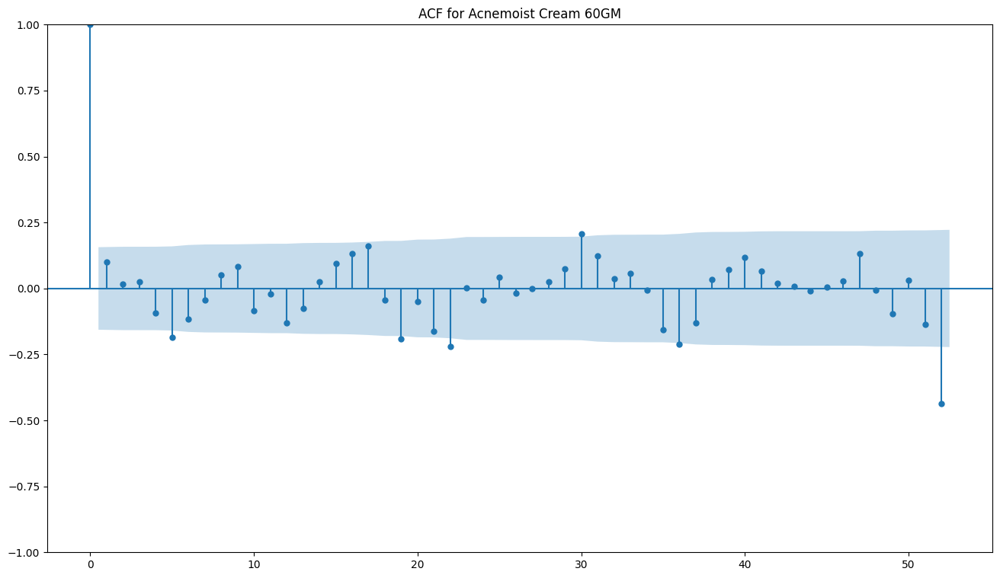

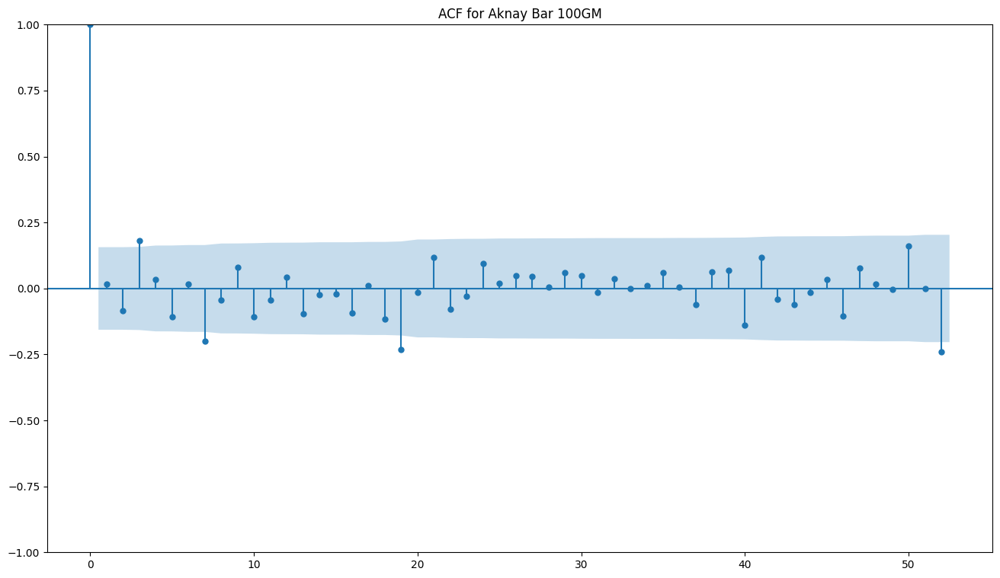

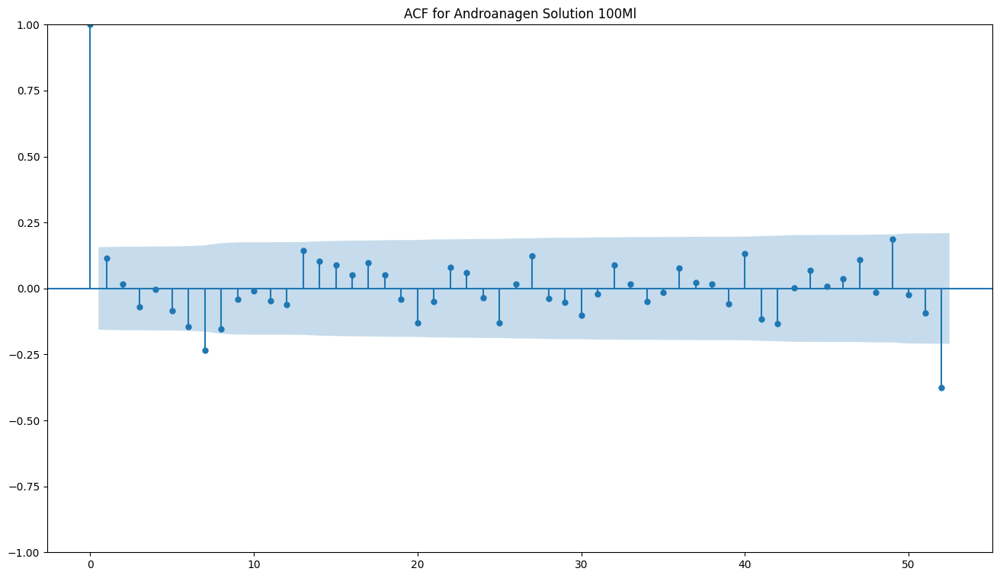

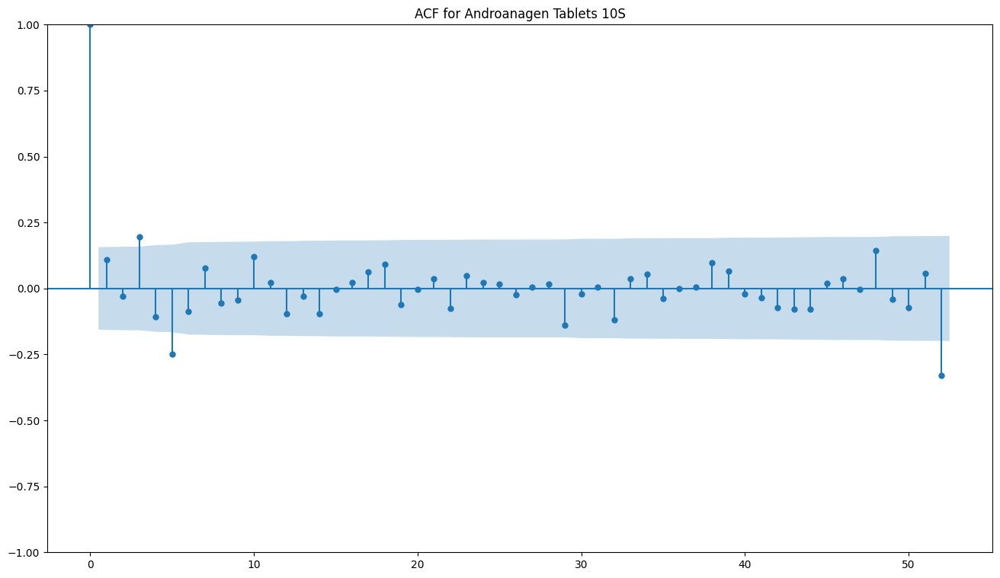

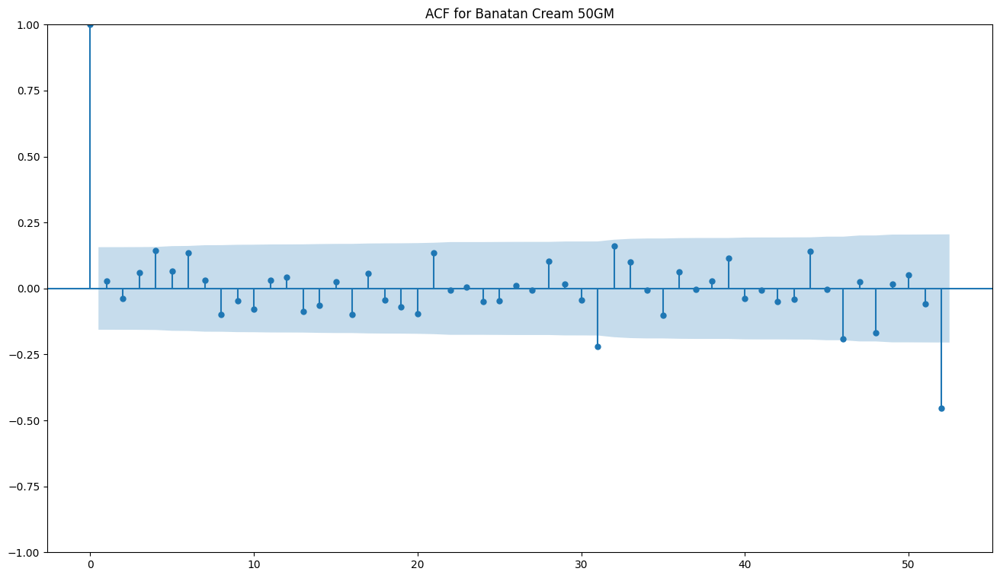

...

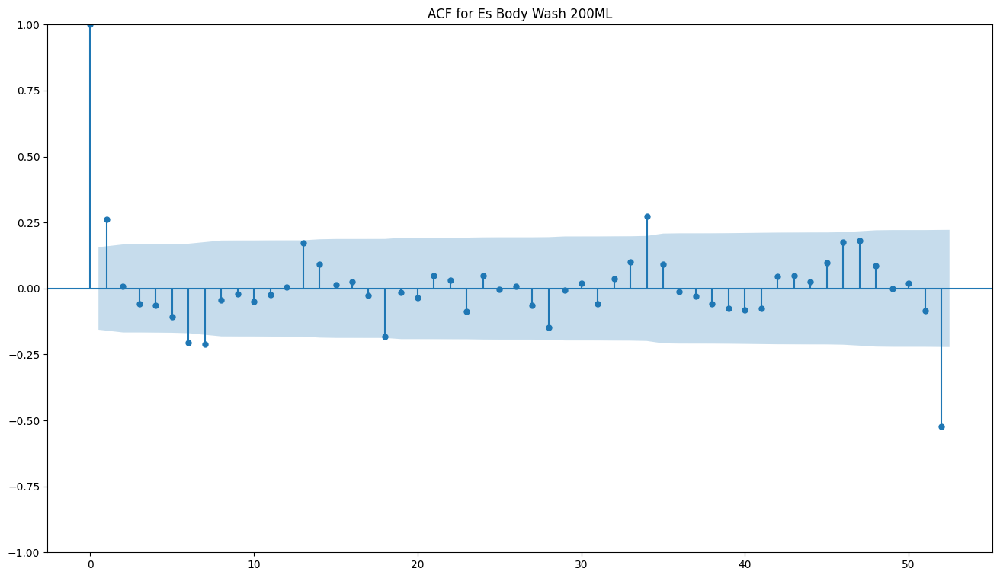

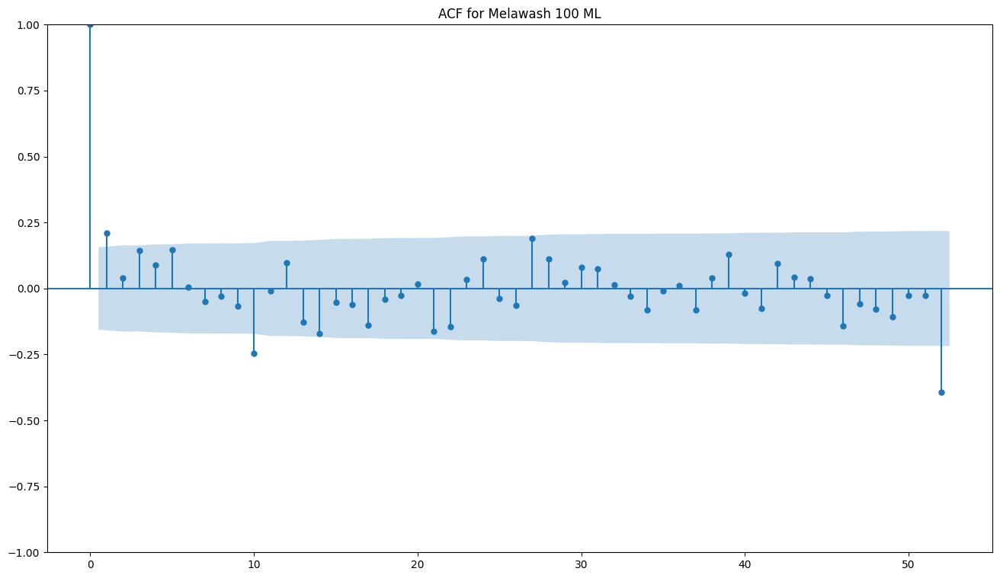

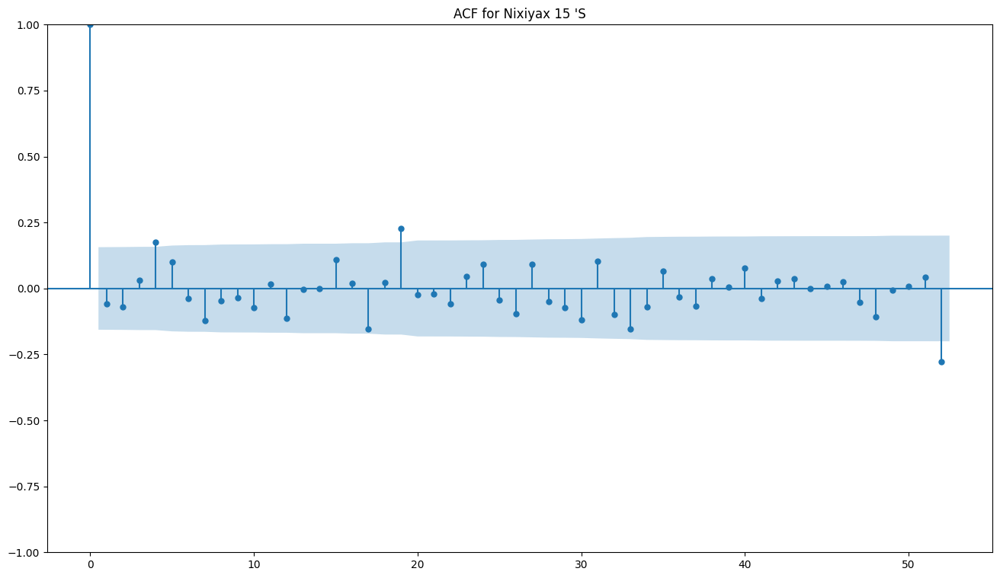

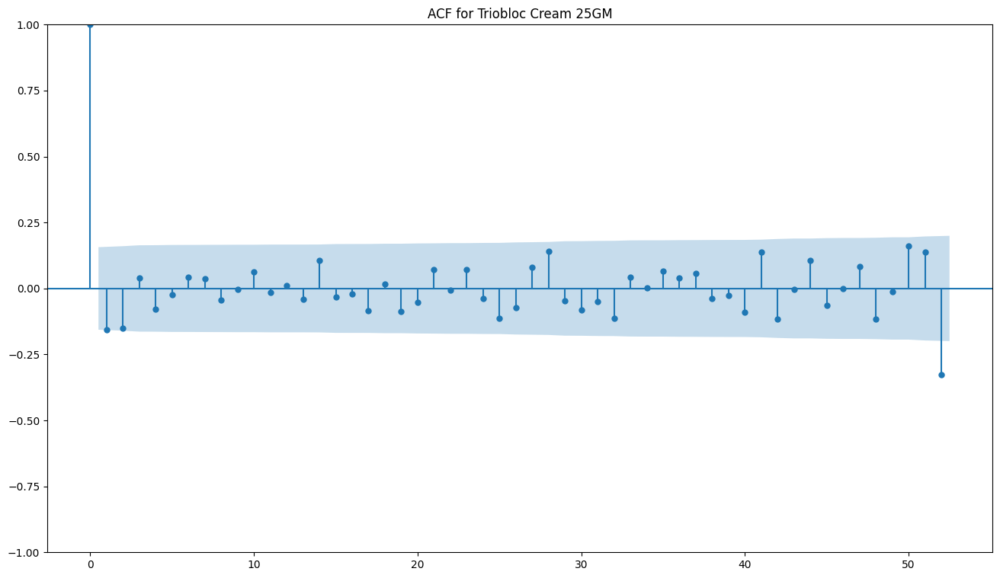

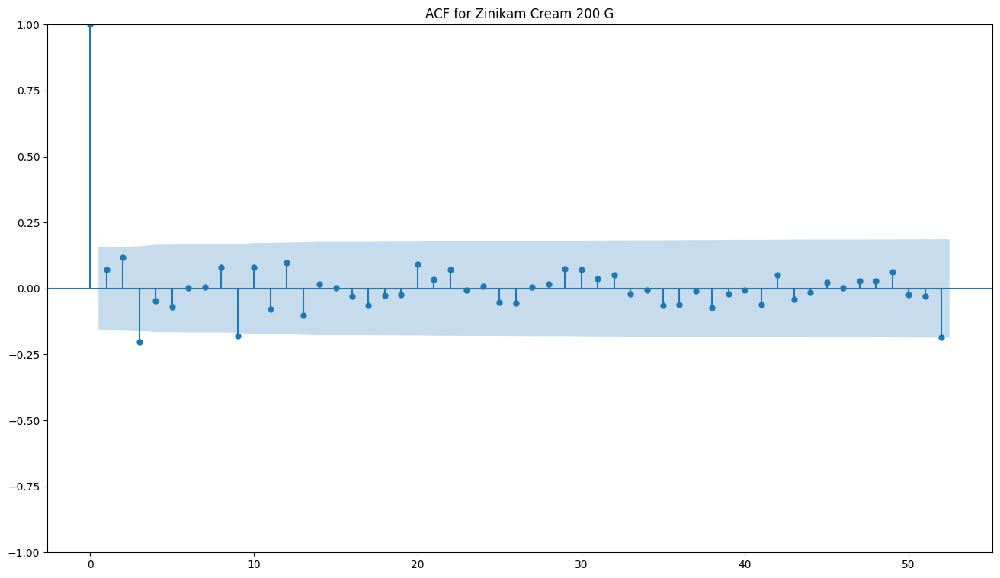

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.seasonal import seasonal_decompose

# Load the data
df = pd.read_csv('/content/salesweekly (1).csv')

# Define the products
products = ['Acnemoist Cream 60GM','Aknay Bar 100GM','Androanagen Solution 100Ml','Androanagen Tablets 10S',
            'Banatan Cream 50GM','Canthex 10 Capsules','Es Body Wash 200ML','Melawash 100 ML',"Nixiyax 15 'S",
            'Triobloc Cream 25GM','Zinikam Cream 200 G']

# Function to plot ACF for each product
def plot_acf_for_product(data, product):
    # Perform seasonal decomposition
    result = seasonal_decompose(data, period=52, model='additive')
    dfs = pd.concat([result.trend, result.seasonal, result.resid, result.observed], axis=1)
    dfs.columns = ['trend', 'seasonal', 'residuals', 'observed']
    dfs = dfs.dropna()

    # Plot ACF for residuals
    plot_acf(dfs['residuals'], lags=52, title=f'ACF for {product}')
    plt.show()

# Plot ACF for each product
for product in products:
    plot_acf_for_product(df[product], product)


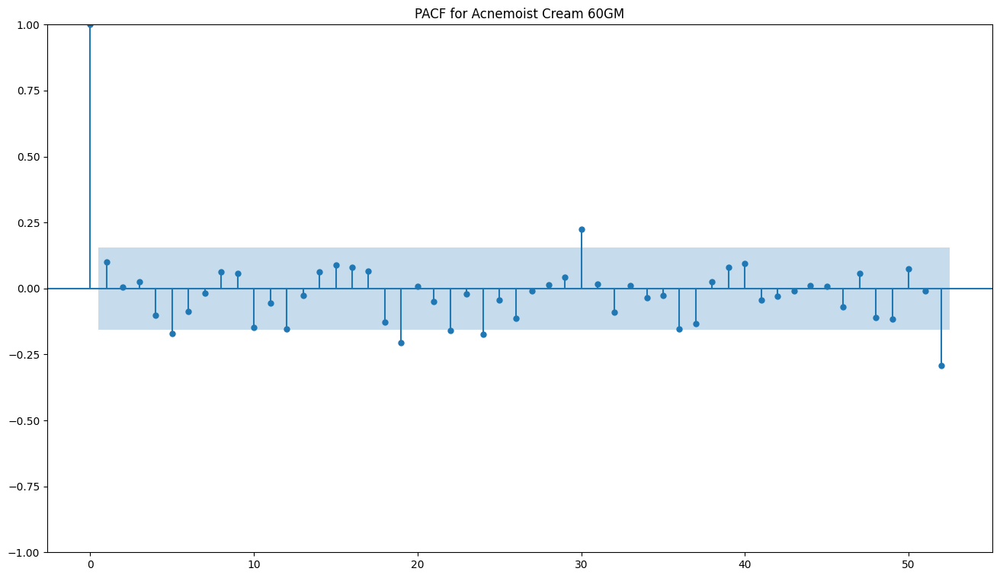

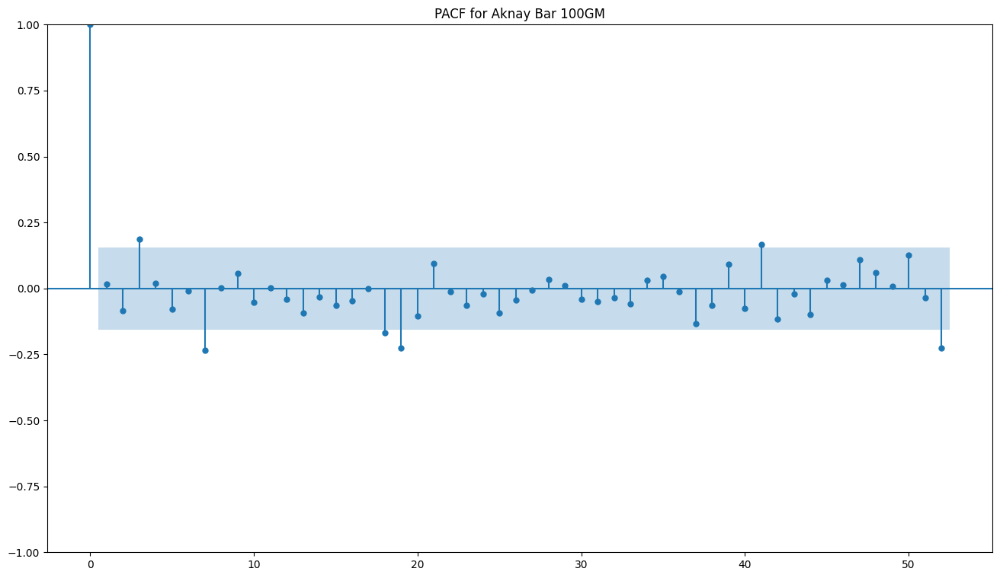

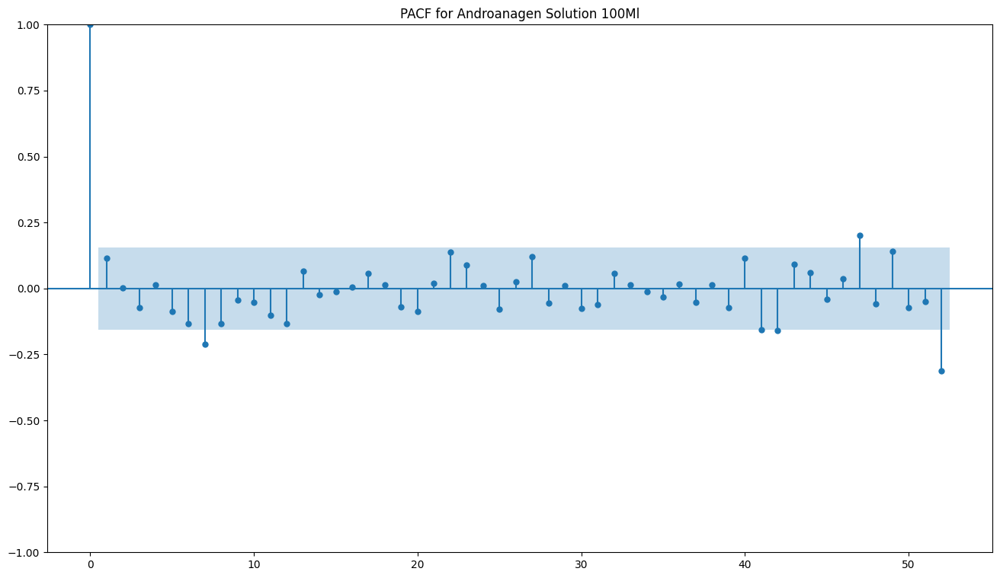

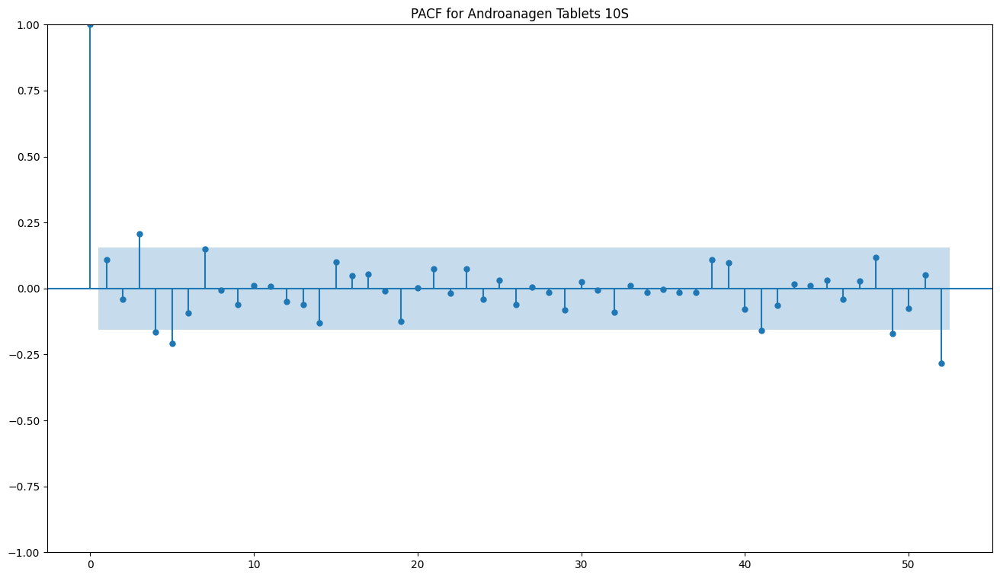

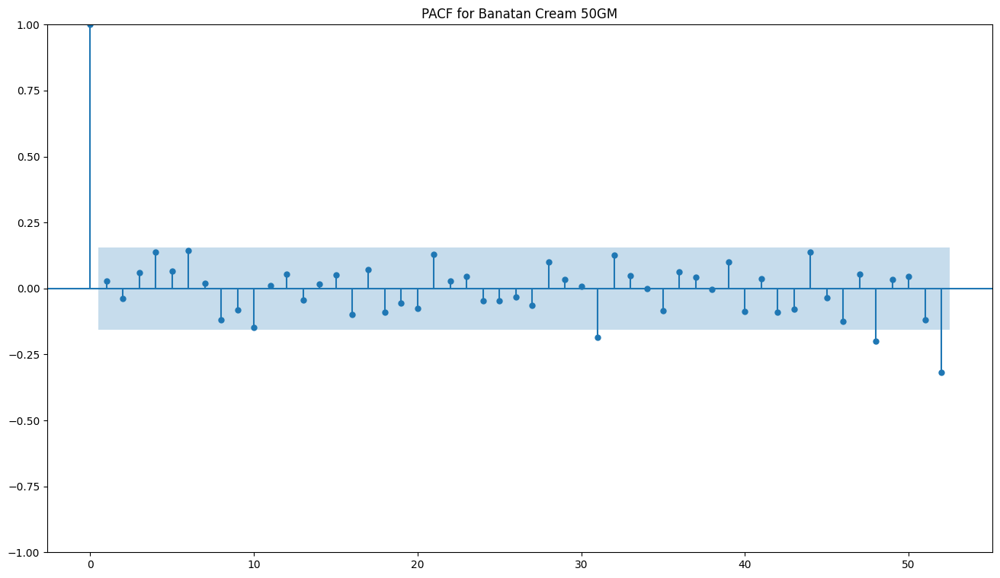

...

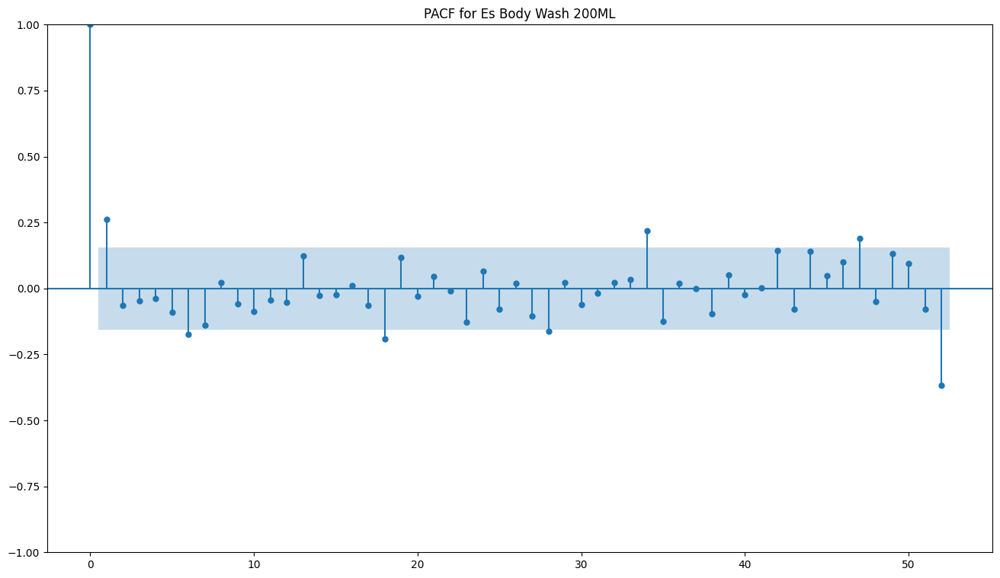

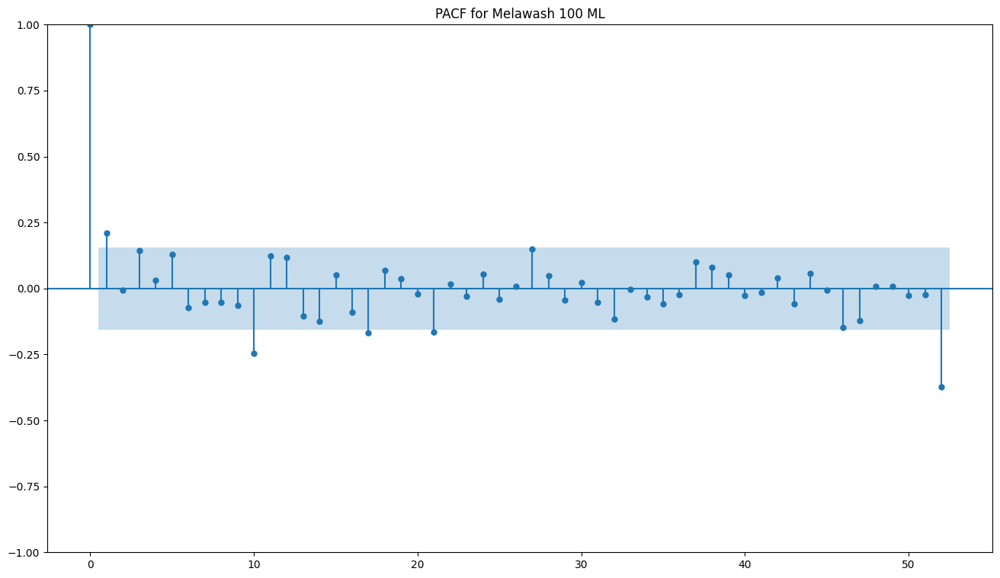

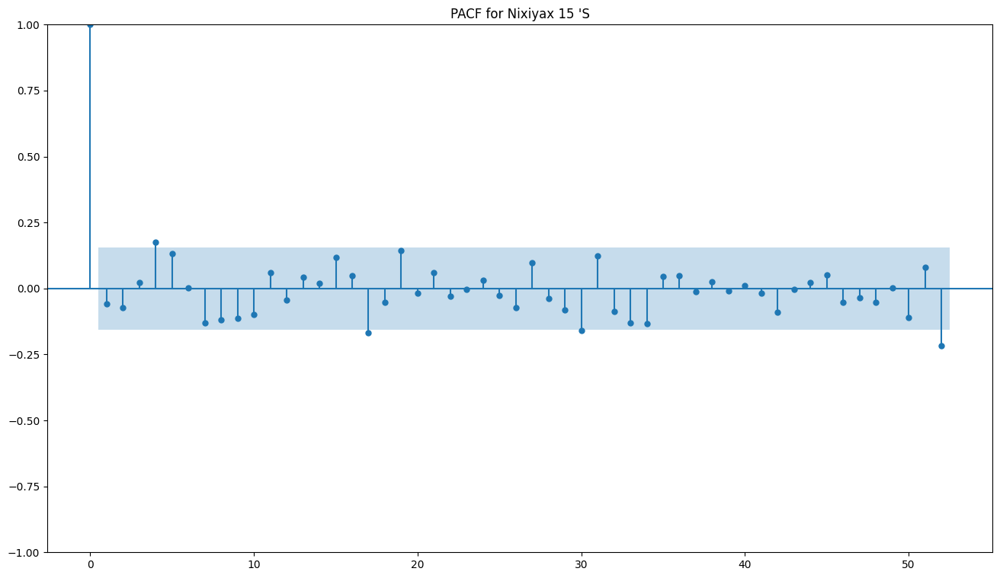

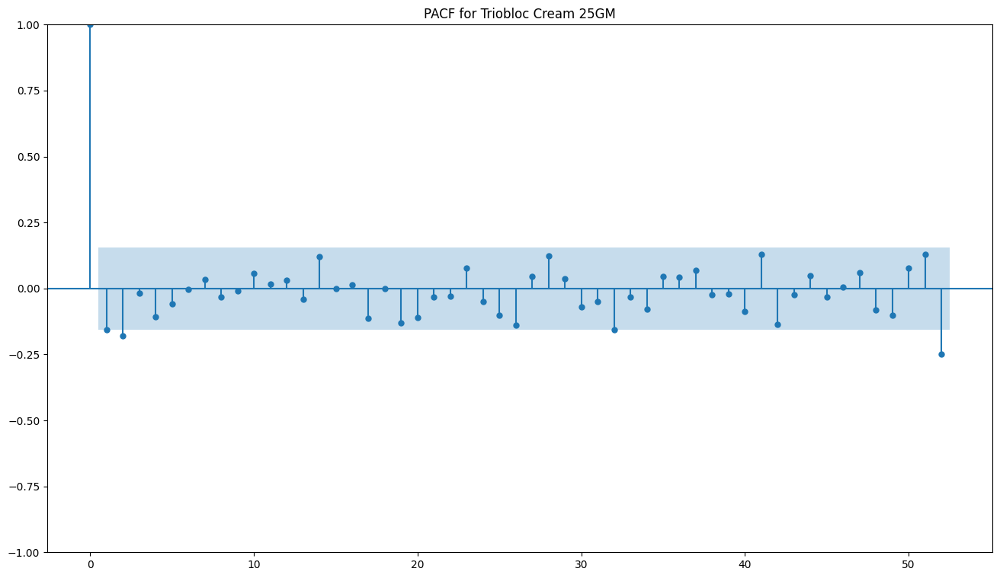

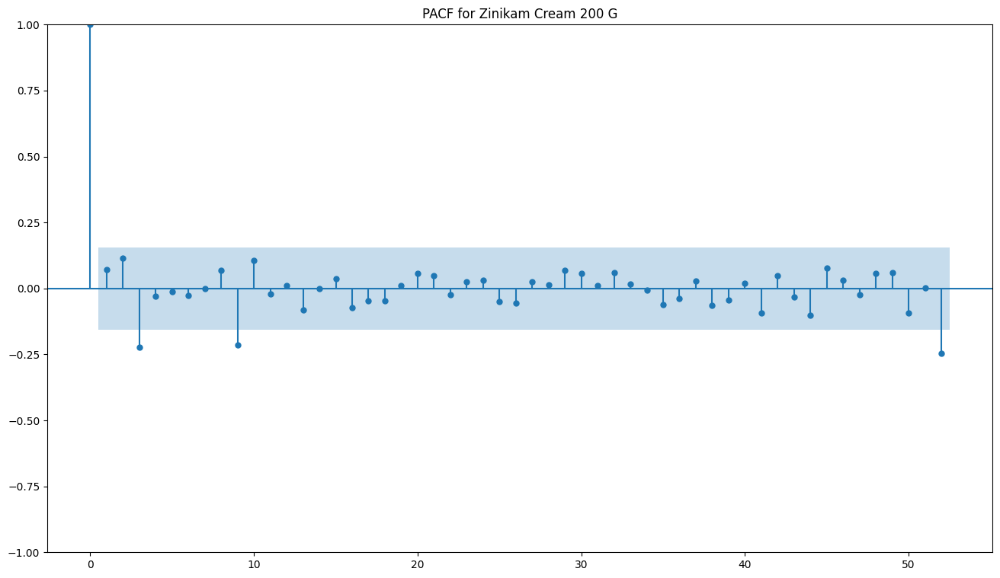

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose

# Load the data
df = pd.read_csv('/content/salesweekly (1).csv')

# Define the products
products = ['Acnemoist Cream 60GM','Aknay Bar 100GM','Androanagen Solution 100Ml','Androanagen Tablets 10S',
            'Banatan Cream 50GM','Canthex 10 Capsules','Es Body Wash 200ML','Melawash 100 ML',"Nixiyax 15 'S",
            'Triobloc Cream 25GM','Zinikam Cream 200 G']

# Function to plot PACF for each product
def plot_pacf_for_product(data, product):
    # Perform seasonal decomposition
    result = seasonal_decompose(data, period=52, model='additive')
    dfs = pd.concat([result.trend, result.seasonal, result.resid, result.observed], axis=1)
    dfs.columns = ['trend', 'seasonal', 'residuals', 'observed']
    dfs = dfs.dropna()

    # Plot PACF for residuals
    plot_pacf(dfs['residuals'], lags=52, title=f'PACF for {product}')
    plt.show()

# Plot PACF for each product
for product in products:
    plot_pacf_for_product(df[product], product)


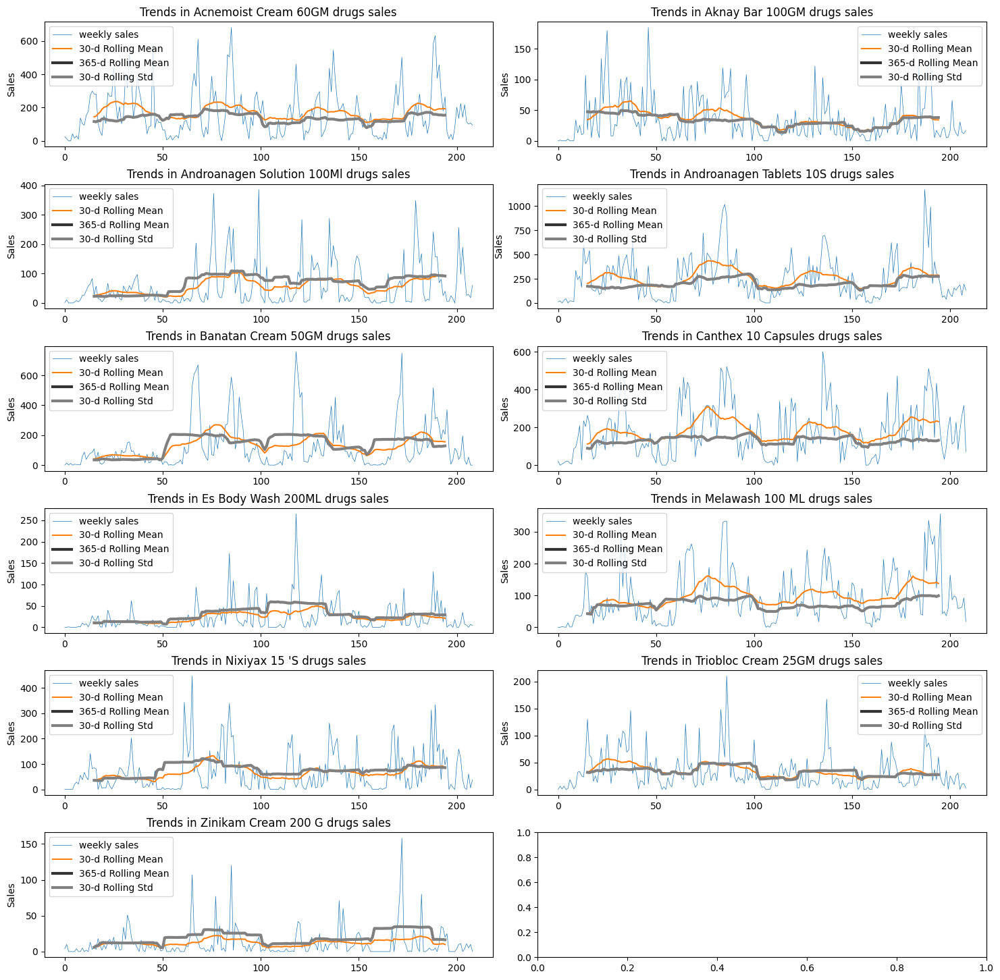

In [ ]:
dfatc_daily=pd.read_csv('/content/salesweekly (1).csv')
cols_plot = ['Acnemoist Cream 60GM','Aknay Bar 100GM','Androanagen Solution 100Ml','Androanagen Tablets 10S', 'Banatan Cream 50GM','Canthex 10 Capsules','Es Body Wash 200ML','Melawash 100 ML',"Nixiyax 15 'S",'Triobloc Cream 25GM','Zinikam Cream 200 G']
dfatc_365d = dfatc_daily[cols_plot].rolling(window=365, center=True).mean()
dfatc_30d = dfatc_daily[cols_plot].rolling(30, center=True).mean()
dfatc_std = dfatc_daily[cols_plot].rolling(30, center=True).std()
subplotindex=0
numrows=6
numcols=2
fig, ax = plt.subplots(numrows, numcols, figsize=(18, 18))
plt.subplots_adjust(wspace=0.1, hspace=0.3)

for x in cols_plot:
    # rowindex = subplotindex // numcols  # Use integer division to get the row index
    # colindex = subplotindex % numcols   # Use modulo to get the column index
    rowindex=math.floor(subplotindex/numcols)
    colindex=subplotindex-(rowindex*numcols)
    ax[rowindex,colindex].plot(dfatc_daily.loc[:,x], linewidth=0.5, label='weekly sales')
    ax[rowindex,colindex].plot(dfatc_30d.loc[:,x], label='30-d Rolling Mean')
    ax[rowindex,colindex].plot(dfatc_365d.loc[:,x], color='0.2', linewidth=3, label='365-d Rolling Mean')
    ax[rowindex,colindex].plot(dfatc_std.loc[:,x], color='0.5', linewidth=3, label='30-d Rolling Std')
    ax[rowindex,colindex].set_ylabel('Sales')
    ax[rowindex,colindex].legend()
    ax[rowindex,colindex].set_title('Trends in '+x+' drugs sales');
    subplotindex=subplotindex+1
plt.show()

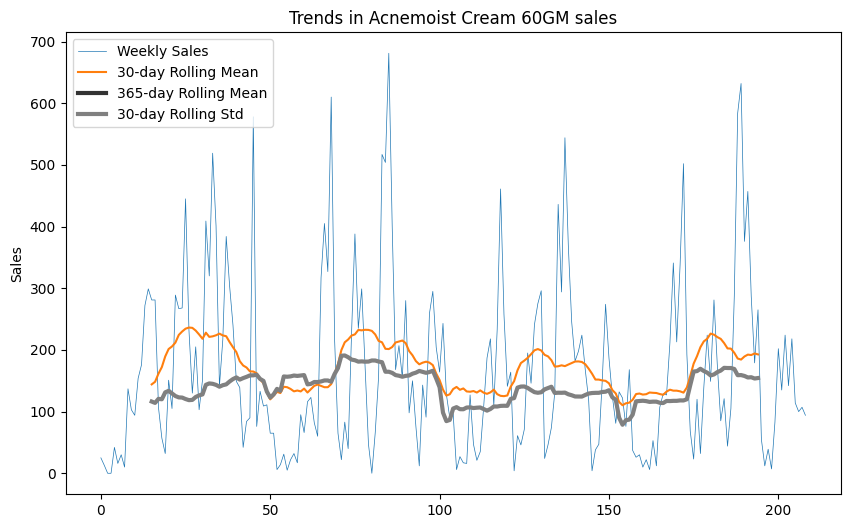

In [ ]:
dfatc_daily=pd.read_csv('/content/salesweekly (1).csv')
product = 'Acnemoist Cream 60GM'  # Choose the product to plot

# Calculate rolling means and standard deviations
dfatc_365d = dfatc_daily[product].rolling(window=365, center=True).mean()
dfatc_30d = dfatc_daily[product].rolling(30, center=True).mean()
dfatc_std = dfatc_daily[product].rolling(30, center=True).std()

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(dfatc_daily[product], linewidth=0.5, label='Weekly Sales')
plt.plot(dfatc_30d, label='30-day Rolling Mean')
plt.plot(dfatc_365d, color='0.2', linewidth=3, label='365-day Rolling Mean')
plt.plot(dfatc_std, color='0.5', linewidth=3, label='30-day Rolling Std')
plt.ylabel('Sales')
plt.legend()
plt.title('Trends in ' + product + ' sales')
plt.show()


<Axes: >

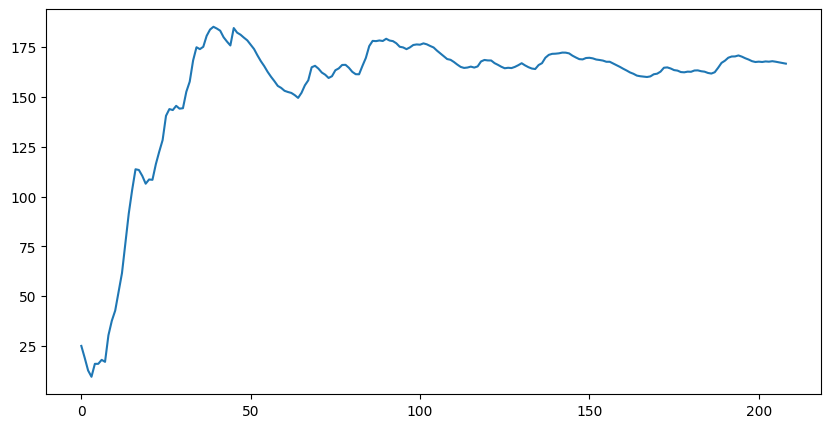

In [ ]:
dfatc_daily['Acnemoist Cream 60GM' ].expanding().mean().plot(figsize=(10,5))

<Axes: >

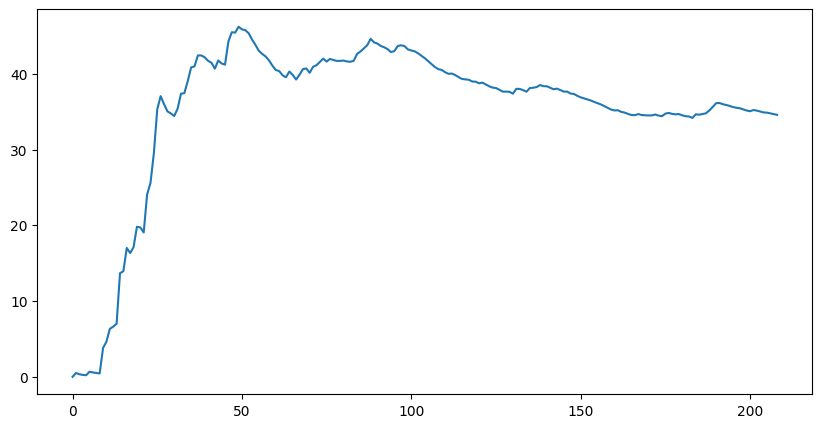

In [ ]:
dfatc_daily['Aknay Bar 100GM' ].expanding().mean().plot(figsize=(10,5))

<Axes: >

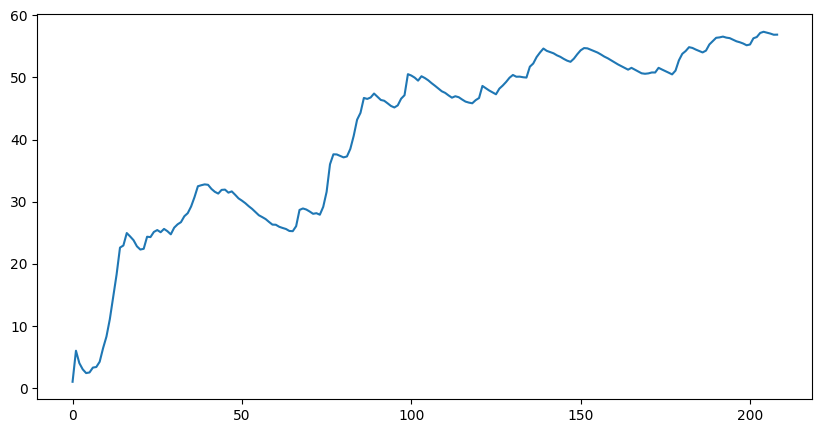

In [ ]:
dfatc_daily['Androanagen Solution 100Ml' ].expanding().mean().plot(figsize=(10,5))

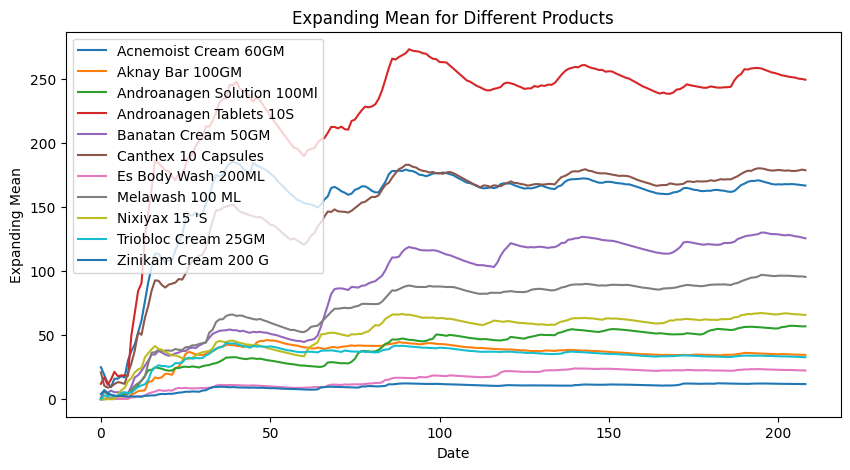

In [ ]:
# Read the CSV file
dfatc_daily = pd.read_csv('/content/salesweekly (1).csv')

# Define the list of products
cols_plot = ['Acnemoist Cream 60GM', 'Aknay Bar 100GM', 'Androanagen Solution 100Ml', 'Androanagen Tablets 10S', 'Banatan Cream 50GM', 'Canthex 10 Capsules', 'Es Body Wash 200ML', 'Melawash 100 ML', "Nixiyax 15 'S", 'Triobloc Cream 25GM', 'Zinikam Cream 200 G']

# Plot the expanding mean for each product
fig, ax = plt.subplots(figsize=(10, 5))
for product in cols_plot:
    dfatc_daily[product].expanding().mean().plot(ax=ax, label=product)

# Add labels and legend
ax.set_xlabel('Date')
ax.set_ylabel('Expanding Mean')
ax.set_title('Expanding Mean for Different Products')
ax.legend()

# Show the plot
plt.show()

### 4.2.2. Stationarity analysis

Stationarity of time-series is the property of exhibiting constant statistical properties over time (for example, mean, variance, autocorrelation). It can be visually determined by plotting rolling statistics (rolling means and variances). In stationary time series, the mean of the series, variance of the series and covariance of the i th term and the (i + m) th term should not be a function of time.

We can use Augmented Dickey-Fuller (ADF) test to check stationarity of the data. Possible values of regression parameters of ADF are:
- c : constant only (default)
- ct : constant and trend
- ctt : constant, and linear and quadratic trend
- nc : no constant, no trend

In [ ]:
df = pd.read_csv('/content/salesweekly (1).csv')
from statsmodels.tsa.stattools import adfuller

for x in ['Acnemoist Cream 60GM','Aknay Bar 100GM','Androanagen Solution 100Ml','Androanagen Tablets 10S', 'Banatan Cream 50GM','Canthex 10 Capsules','Es Body Wash 200ML','Melawash 100 ML',"Nixiyax 15 'S",'Triobloc Cream 25GM','Zinikam Cream 200 G']:
    dftest = adfuller(df[x], regression='ct', autolag='AIC')
    print("ADF test for "+x)
    print("-----------------------------")
    print("Test statistic = {:.3f}".format(dftest[0]))
    print("P-value = {:.3f}".format(dftest[1]))
    print("Critical values :")
    for k, v in dftest[4].items():
        print("\t{}: {} - The data is {} stationary with {}% confidence".format(k, v, "not" if v<dftest[0] else "", 100-int(k[:-1])))

ADF test for Acnemoist Cream 60GM
-----------------------------
Test statistic = -7.254
P-value = 0.000
Critical values :
	1%: -4.0036234899377545 - The data is  stationary with 99% confidence
	5%: -3.4321268670216623 - The data is  stationary with 95% confidence
	10%: -3.139758677471308 - The data is  stationary with 90% confidence
ADF test for Aknay Bar 100GM
-----------------------------
Test statistic = -5.521
P-value = 0.000
Critical values :
	1%: -4.003402336644926 - The data is  stationary with 99% confidence
	5%: -3.4320207442298027 - The data is  stationary with 95% confidence
	10%: -3.1396965086430555 - The data is  stationary with 90% confidence
ADF test for Androanagen Solution 100Ml
-----------------------------
Test statistic = -7.550
P-value = 0.000
Critical values :
	1%: -4.0036234899377545 - The data is  stationary with 99% confidence
	5%: -3.4321268670216623 - The data is  stationary with 95% confidence
	10%: -3.139758677471308 - The data is  stationary with 90% confi

In [ ]:
# Assuming df is your DataFrame
df = pd.read_csv('/content/salesweekly (1).csv')

for x in ['Acnemoist Cream 60GM','Aknay Bar 100GM','Androanagen Solution 100Ml','Androanagen Tablets 10S', 'Banatan Cream 50GM','Canthex 10 Capsules','Es Body Wash 200ML','Melawash 100 ML',"Nixiyax 15 'S",'Triobloc Cream 25GM','Zinikam Cream 200 G']:
    print(" > Is "+x+" data stationary ?")

    # Remove zeros if they are present
    non_zero_data = df[x][df[x] != 0]

    # Check for constant values
    if non_zero_data.nunique() == 1:
        print(f"The {x} data is constant. Consider differencing.")
    else:
        # Perform the KPSS test
        dftest = kpss(np.log(non_zero_data), 'ct')
        print("Test statistic = {:.3f}".format(dftest[0]))
        print("P-value = {:.3f}".format(dftest[1]))
        print("Critical values :")
        for k, v in dftest[3].items():
            print("\t{}: {}".format(k, v))

 > Is Acnemoist Cream 60GM data stationary ?
Test statistic = 0.037
P-value = 0.100
Critical values :
	10%: 0.119
	5%: 0.146
	2.5%: 0.176
	1%: 0.216
 > Is Aknay Bar 100GM data stationary ?
Test statistic = 0.077
P-value = 0.100
Critical values :
	10%: 0.119
	5%: 0.146
	2.5%: 0.176
	1%: 0.216
 > Is Androanagen Solution 100Ml data stationary ?
Test statistic = 0.053
P-value = 0.100
Critical values :
	10%: 0.119
	5%: 0.146
	2.5%: 0.176
	1%: 0.216
 > Is Androanagen Tablets 10S data stationary ?
Test statistic = 0.051
P-value = 0.100
Critical values :
	10%: 0.119
	5%: 0.146
	2.5%: 0.176
	1%: 0.216
 > Is Banatan Cream 50GM data stationary ?
Test statistic = 0.080
P-value = 0.100
Critical values :
	10%: 0.119
	5%: 0.146
	2.5%: 0.176
	1%: 0.216
 > Is Canthex 10 Capsules data stationary ?
Test statistic = 0.070
P-value = 0.100
Critical values :
	10%: 0.119
	5%: 0.146
	2.5%: 0.176
	1%: 0.216
 > Is Es Body Wash 200ML data stationary ?
Test statistic = 0.216
P-value = 0.010
Critical values :
	10%:

### 4.2.3. Regularity analysis

For calculating regularity and predictability of time series, Approximate Entropy test was used. For all series, entropy values were higher than 1 indicating low predictability, with highest values.

In [ ]:
df = pd.read_csv('/content/salesweekly (1).csv')
def ApEn(U, m, r):
    def _maxdist(x_i, x_j):
        return max([abs(ua - va) for ua, va in zip(x_i, x_j)])
    def _phi(m):
        x = [[U[j] for j in range(i, i + m - 1 + 1)] for i in range(N - m + 1)]
        C = [len([1 for x_j in x if _maxdist(x_i, x_j) <= r]) / (N - m + 1.0) for x_i in x]
        return (N - m + 1.0)**(-1) * sum(np.log(C))
    N = len(U)
    return abs(_phi(m+1) - _phi(m))

for x in ['Acnemoist Cream 60GM','Aknay Bar 100GM','Androanagen Solution 100Ml','Androanagen Tablets 10S', 'Banatan Cream 50GM','Canthex 10 Capsules','Es Body Wash 200ML','Melawash 100 ML',"Nixiyax 15 'S",'Triobloc Cream 25GM','Zinikam Cream 200 G']:
    print(x + ': ' + str(ApEn(df[x].values, m=2, r=0.2*np.std(df[x].values))))

Acnemoist Cream 60GM: 1.0119833039156365
Aknay Bar 100GM: 1.0131535371816205
Androanagen Solution 100Ml: 0.8216221326910929
Androanagen Tablets 10S: 0.8691601620226868
Banatan Cream 50GM: 0.8318855685986235
Canthex 10 Capsules: 0.9356169689146645
Es Body Wash 200ML: 0.9534694430580055
Melawash 100 ML: 0.9587752354794534
Nixiyax 15 'S: 0.8633154607068412
Triobloc Cream 25GM: 0.9749537571570484
Zinikam Cream 200 G: 0.8819276494110975


### 4.2.4. Autocorrelation analysis

Autocorrelation analysis illustrates the potential for time series data prediction. Autocorrelation plots graphically summarize the strength of a relationship with an observation in a time series with observations at prior time steps. Pearson coefficient is used to measure autocorrelation. Thus, the following analysis is relevant only for data with normal Gaussian distribution.

A plot of the autocorrelation of a time series by lag is called the AutoCorrelation Function (ACF). This plot is sometimes called a correlogram or an autocorrelation plot. Plot shows the lag value along the x-axis and the correlation on the y-axis between -1 and 1. Confidence intervals are drawn as a cone. By default, this is set to a 95% confidence interval, suggesting that correlation values outside of this code are very likely a correlation.

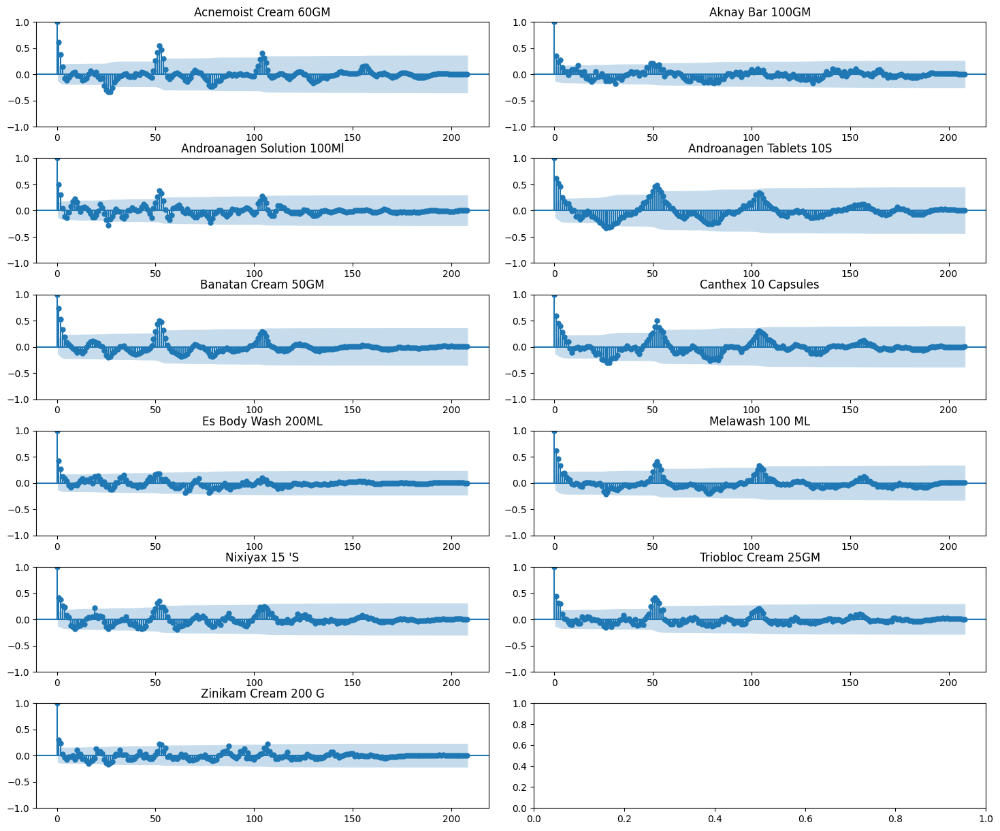

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf
import math

df = pd.read_csv('/content/salesweekly (1).csv')

subplotindex = 0
numrows = 6
numcols = 2
fig, ax = plt.subplots(numrows, numcols, figsize=(18, 15))
plt.subplots_adjust(wspace=0.1, hspace=0.3)

with plt.rc_context():
    plt.rc("figure", figsize=(18, 12))
    for x in ['Acnemoist Cream 60GM','Aknay Bar 100GM','Androanagen Solution 100Ml','Androanagen Tablets 10S', 'Banatan Cream 50GM','Canthex 10 Capsules','Es Body Wash 200ML','Melawash 100 ML',"Nixiyax 15 'S",'Triobloc Cream 25GM','Zinikam Cream 200 G']:
        rowindex = math.floor(subplotindex / numcols)
        colindex = subplotindex - (rowindex * numcols)

        # Adjust the number of lags dynamically
        max_lags = len(df[x]) - 1
        lags = min(300, max_lags)

        plot_acf(df[x], lags=lags, title=x, ax=ax[rowindex, colindex])
        subplotindex += 1

plt.show()


In general, the "partial" correlation between two variables is the amount of correlation between them which is not explained by their mutual correlations with a specified set of other variables. For example, if we are regressing a variable Y on other variables X1, X2, and X3, the partial correlation between Y and X3 is the amount of correlation between Y and X3 that is not explained by their common correlations with X1 and X2.

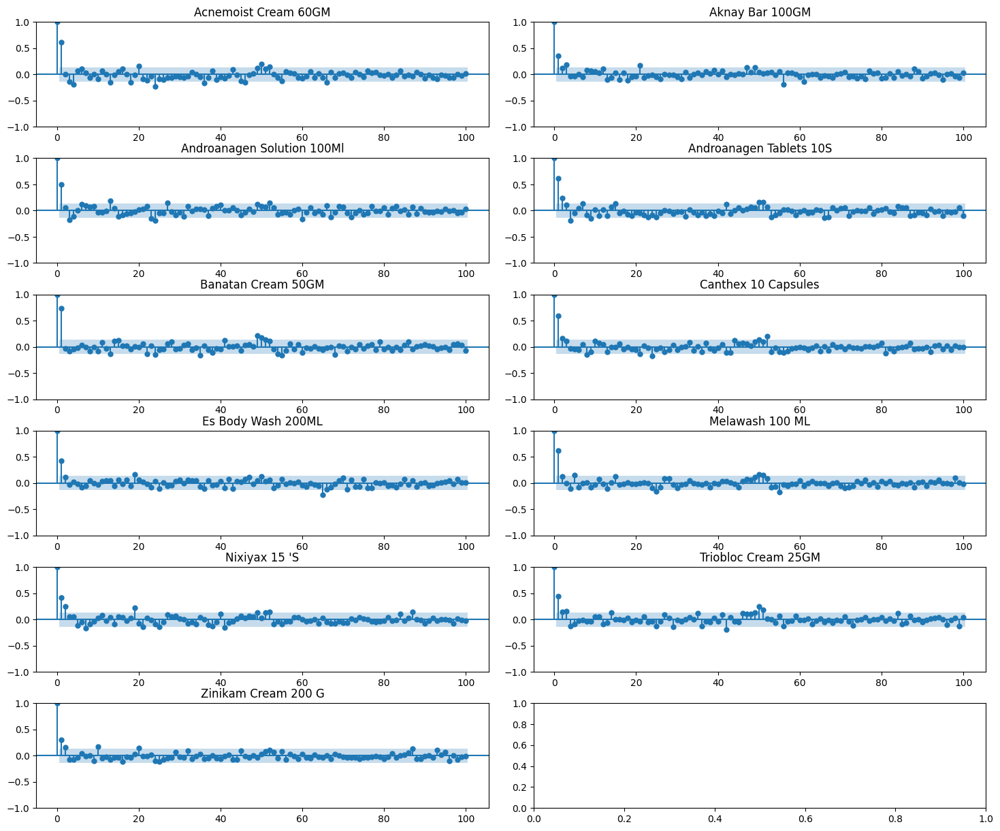

In [ ]:
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.graphics.tsaplots import plot_acf
df =pd.read_csv('/content/salesweekly (1).csv')
subplotindex=0
numrows=6
numcols=2
fig, ax = plt.subplots(numrows, numcols, figsize=(18, 15))
plt.subplots_adjust(wspace=0.1, hspace=0.3)
with plt.rc_context():
    plt.rc("figure", figsize=(18,15))
    for x in ['Acnemoist Cream 60GM','Aknay Bar 100GM','Androanagen Solution 100Ml','Androanagen Tablets 10S', 'Banatan Cream 50GM','Canthex 10 Capsules','Es Body Wash 200ML','Melawash 100 ML',"Nixiyax 15 'S",'Triobloc Cream 25GM','Zinikam Cream 200 G']:
        rowindex=math.floor(subplotindex/numcols)
        colindex=subplotindex-(rowindex*numcols)
        plot_pacf(df[x], lags=100, title=x, ax=ax[rowindex,colindex])
        subplotindex=subplotindex+1

Minor autocorrelation is observed at ACF (Auto-Correlation Function) and PACF (Partial Auto-Correlation Function) plots for all series

### 4.2.5. Data distribution analysis

In [ ]:
resultsRolling={'Acnemoist Cream 60GM':[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],
     'Aknay Bar 100GM':[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],
     'Androanagen Solution 100Ml':[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],
     'Androanagen Tablets 10S':[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],
     'Banatan Cream 50GM':[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],
     'Canthex 10 Capsules':[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],
     'Es Body Wash 200ML':[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],
     'Melawash 100 ML':[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],
     "Nixiyax 15 'S":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],
     'Triobloc Cream 25GM':[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],
     'Zinikam Cream 200 G':[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0]}
resultsRollingdf = pd.DataFrame(resultsRolling)
resultsRollingdf.index = ['Naive MSE', 'Naive MAPE', 'Seasonal Naive MSE', 'Seasonal Naive MAPE',
                          'ARIMA MSE', 'ARIMA MAPE', 'AutoARIMA MSE', 'AutoARIMA MAPE',
                         'Prophet MSE', 'Prophet MAPE']
resultsLongterm={'Acnemoist Cream 60GM':[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],
     'Aknay Bar 100GM':[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],
     'Androanagen Solution 100Ml':[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],
     'Androanagen Tablets 10S':[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],
     'Banatan Cream 50GM':[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],
     'Canthex 10 Capsules':[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],
     'Es Body Wash 200ML':[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],
     'Melawash 100 ML':[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],
     "Nixiyax 15 'S":[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],
     'Triobloc Cream 25GM':[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],
     'Zinikam Cream 200 G':[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0]}
resultsLongtermdf = pd.DataFrame(resultsLongterm)
resultsLongtermdf.index = ['Average MSE', 'Average MAPE', 'ARIMA MSE', 'ARIMA MAPE',
                           'AutoARIMA MSE', 'AutoARIMA MAPE', 'Prophet MSE', 'Prophet MAPE',
                          'Vanilla LSTM MSE', 'Vanilla LSTM MAPE', 'Stacked LSTM MSE', 'Stacked LSTM MAPE',
                          'Bidirectional LSTM MSE', 'Bidirectional LSTM MAPE']

####  Naïve forecasting

In [ ]:
df = pd.read_csv('/content/salesweekly (1).csv')

In [ ]:
df

,datum,Acnemoist Cream 60GM,Aknay Bar 100GM,Androanagen Solution 100Ml,Androanagen Tablets 10S,Banatan Cream 50GM,Canthex 10 Capsules,Es Body Wash 200ML,Melawash 100 ML,Nixiyax 15 'S,Triobloc Cream 25GM,Zinikam Cream 200 G,Index
0,06-01-2020,25,0,1,12,0,21,0,0,0,0,4,1
1,13-01-2020,13,1,11,22,14,0,0,0,0,6,10,2
2,20-01-2020,0,0,0,0,1,6,1,2,0,1,0,3
3,27-01-2020,0,0,0,28,12,12,0,1,0,6,0,4
4,03-02-2020,42,0,0,45,0,20,0,0,0,0,0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
204,04-12-2023,218,8,96,165,33,81,7,59,6,30,4,205
205,11-12-2023,114,31,26,187,5,185,5,61,0,0,11,206
206,18-12-2023,100,14,29,78,53,266,0,63,61,10,5,207
207,25-12-2023,107,12,18,195,0,316,7,92,6,11,10,208


In [ ]:
df.isnull().sum()

datum                         0
Acnemoist Cream 60GM          0
Aknay Bar 100GM               0
Androanagen Solution 100Ml    0
Androanagen Tablets 10S       0
Banatan Cream 50GM            0
Canthex 10 Capsules           0
Es Body Wash 200ML            0
Melawash 100 ML               0
Nixiyax 15 'S                 0
Triobloc Cream 25GM           0
Zinikam Cream 200 G           0
Index                         0
dtype: int64

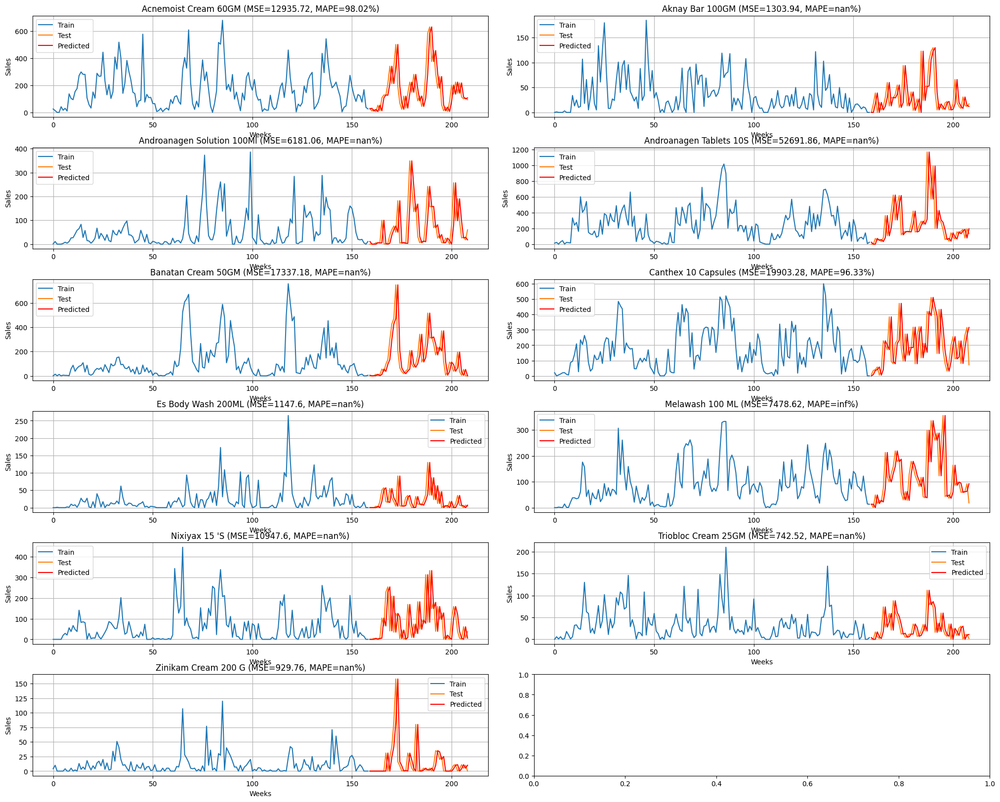

In [ ]:
# Define subplot settings
numrows = 6
numcols = 2
fig, ax = plt.subplots(numrows, numcols, figsize=(25,20))
plt.subplots_adjust(wspace=0.1, hspace=0.3)
# Loop over each product
for subplotindex, product in enumerate(['Acnemoist Cream 60GM','Aknay Bar 100GM','Androanagen Solution 100Ml','Androanagen Tablets 10S', 'Banatan Cream 50GM','Canthex 10 Capsules','Es Body Wash 200ML','Melawash 100 ML',"Nixiyax 15 'S",'Triobloc Cream 25GM','Zinikam Cream 200 G']):
    rowindex = math.floor(subplotindex / numcols)
    colindex = subplotindex - (rowindex * numcols)

    # Prepare data
    ds = df[product]
    dataframe = concat([ds.shift(1), ds], axis=1)
    dataframe.columns = ['t+1', 't-1']
    size = len(dataframe) - 50
    X = dataframe['t-1']
    Y = dataframe['t+1']
    train, test = X[:size], X[size:]
    test, predictions = X[size:], Y[size:]

    # Calculate error metrics
    error = mean_squared_error(test, predictions)
    perror = mean_absolute_percentage_error(test, predictions)

    # Plotting
    ax[rowindex, colindex].set_title(product + ' (MSE=' + str(round(error, 2)) + ', MAPE=' + str(round(perror, 2)) + '%)')
    ax[rowindex, colindex].legend(['Train', 'Test', 'Predicted'], loc='upper left')
    ax[rowindex, colindex].plot(train, label='Train')
    ax[rowindex, colindex].plot(test, label='Test')
    ax[rowindex, colindex].plot(predictions, color='red', label='Predicted')
    ax[rowindex, colindex].set_xlabel('Weeks')
    ax[rowindex, colindex].set_ylabel('Sales')
    ax[rowindex, colindex].grid(True)
    ax[rowindex, colindex].legend()

plt.show()

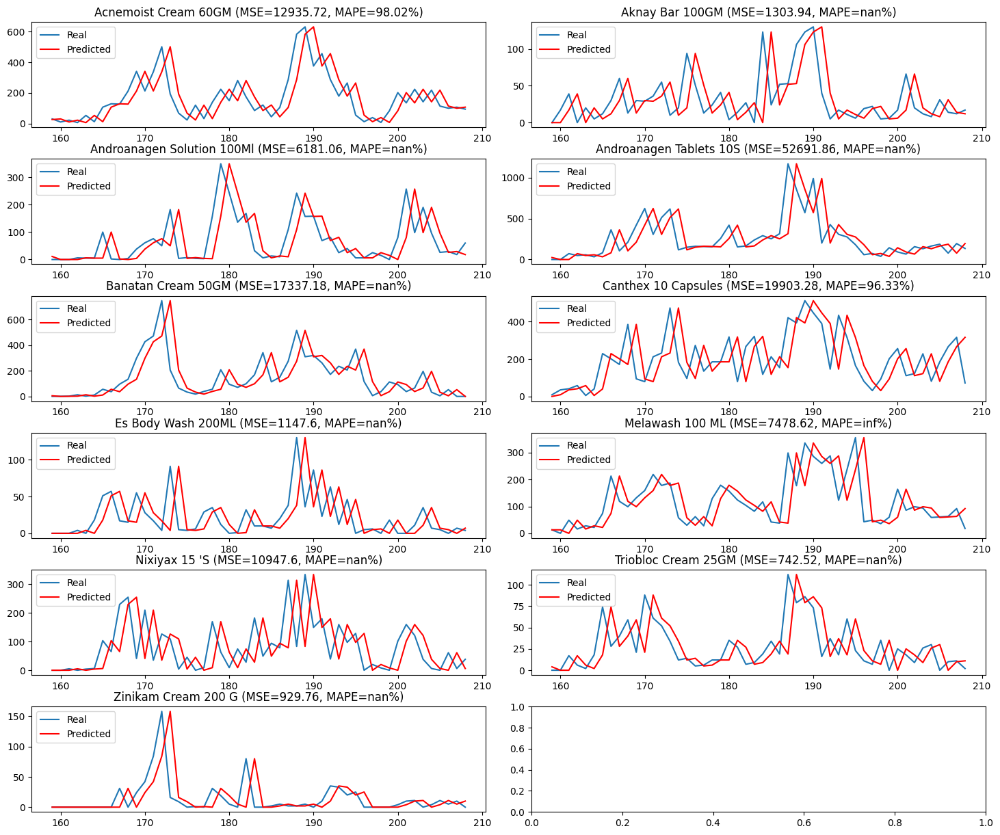

In [ ]:

#subplotindex=0
#numrows=6
#numcols=2
#fig, ax = plt.subplots(numrows, numcols, figsize=(18,15))
#plt.subplots_adjust(wspace=0.1, hspace=0.3)
#for x in ['Acnemoist Cream 60GM','Aknay Bar 100GM','Androanagen Solution 100Ml','Androanagen Tablets 10S', 'Banatan Cream 50GM','Canthex 10 Capsules','Es Body Wash 200ML','Melawash 100 ML',"Nixiyax 15 'S",'Triobloc Cream 25GM','Zinikam Cream 200 G']:
    #rowindex=math.floor(subplotindex/numcols)
    #colindex=subplotindex-(rowindex*numcols)
    #ds=df[x]
    #dataframe = concat([ds.shift(1), ds], axis=1)
    #dataframe.columns = ['t+1', 't-1']
    #size = len(dataframe)-50
    #X=dataframe['t-1']
   #Y=dataframe['t+1']
    #test, predictions = X[size:len(X)], Y[size:len(Y)]
    #error = mean_squared_error(test, predictions)
    #perror = mean_absolute_percentage_error(test, predictions)
    #resultsRollingdf.loc['Naive MSE',x]=error
    #resultsRollingdf.loc['Naive MAPE',x]=perror
    #ax[rowindex,colindex].set_title(x+' (MSE=' + str(round(error,2))+', MAPE='+ str(round(perror,2)) +'%)')
    #ax[rowindex,colindex].plot(test, label='Real')
    #ax[rowindex,colindex].plot(predictions, color='red', label='Predicted')
    #ax[rowindex,colindex].legend(loc='upper left')
    #subplotindex=subplotindex+1
#plt.show()


#### 4.3.1.2. Average method forecasting

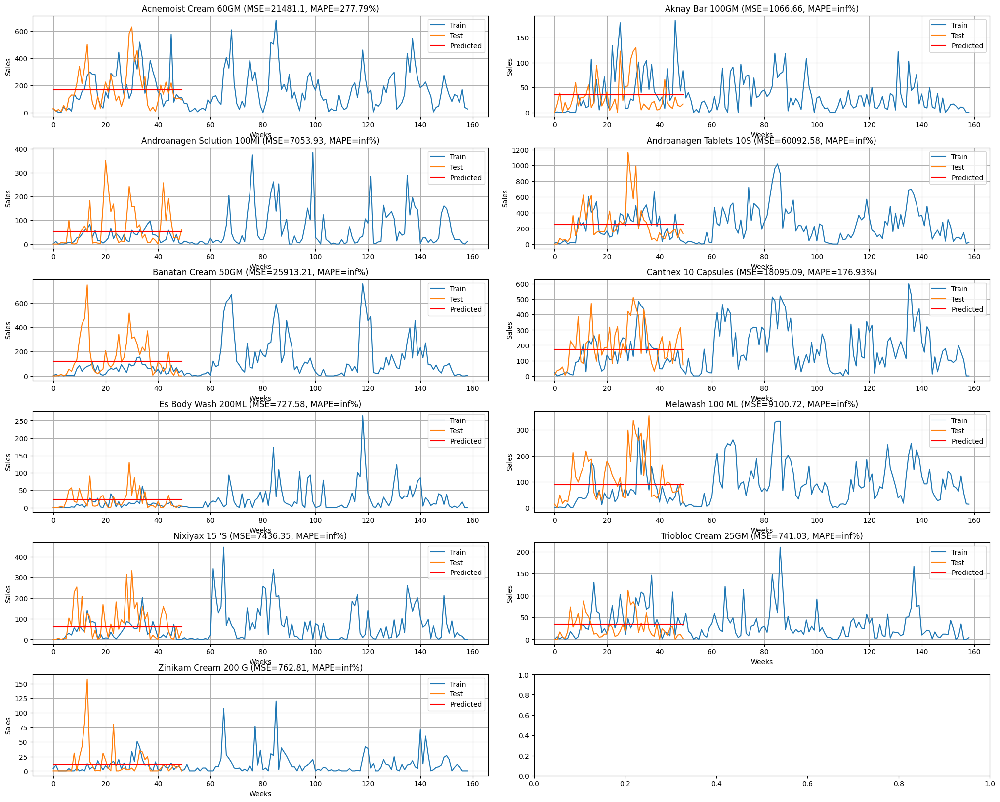

In [ ]:
# Define subplot settings
numrows = 6
numcols = 2
fig, ax = plt.subplots(numrows, numcols, figsize=(25,20))
plt.subplots_adjust(wspace=0.1, hspace=0.3)

# Loop over each product
for subplotindex, product in enumerate(['Acnemoist Cream 60GM','Aknay Bar 100GM','Androanagen Solution 100Ml','Androanagen Tablets 10S', 'Banatan Cream 50GM','Canthex 10 Capsules','Es Body Wash 200ML','Melawash 100 ML',"Nixiyax 15 'S",'Triobloc Cream 25GM','Zinikam Cream 200 G']):
    rowindex = math.floor(subplotindex / numcols)
    colindex = subplotindex - (rowindex * numcols)

    # Prepare data
    X = df[product].values
    size = len(X) - 50
    train = X[:size]
    test = X[size:]

    # Calculate mean of training data
    mean = np.mean(train)

    # Generate predictions using mean
    predictions = np.full(50, mean)

    # Calculate error metrics
    error = mean_squared_error(test, predictions)
    perror = mean_absolute_percentage_error(test, predictions)

    # Plotting
    ax[rowindex, colindex].set_title(product + ' (MSE=' + str(round(error, 2)) + ', MAPE=' + str(round(perror, 2)) + '%)')
    ax[rowindex, colindex].legend(['Train', 'Test', 'Predicted'], loc='upper left')
    ax[rowindex, colindex].plot(train, label='Train')
    ax[rowindex, colindex].plot(test, label='Test')
    ax[rowindex, colindex].plot(predictions, color='red', label='Predicted')
    ax[rowindex, colindex].set_xlabel('Weeks')
    ax[rowindex, colindex].set_ylabel('Sales')
    ax[rowindex, colindex].grid(True)
    ax[rowindex, colindex].legend()

plt.show()

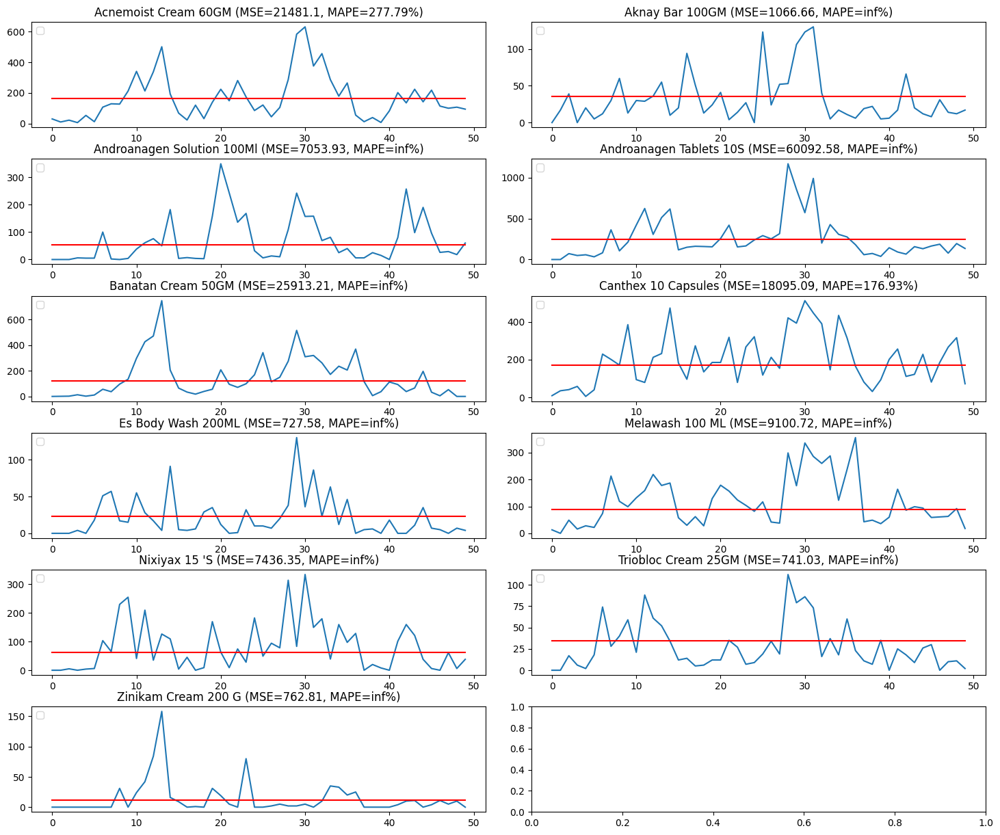

In [ ]:
#df = pd.read_csv('salesweekly.csv')
#subplotindex=0
#numrows=6
##numcols=2
#fig, ax = plt.subplots(numrows, numcols, figsize=(18,15))
#plt.subplots_adjust(wspace=0.1, hspace=0.3)
#for x in ['Acnemoist Cream 60GM','Aknay Bar 100GM','Androanagen Solution 100Ml','Androanagen Tablets 10S', 'Banatan Cream 50GM','Canthex 10 Capsules','Es Body Wash 200ML','Melawash 100 ML',"Nixiyax 15 'S",'Triobloc Cream 25GM','Zinikam Cream 200 G']:
   #rowindex=math.floor(subplotindex/numcols)
    #colindex=subplotindex-(rowindex*numcols)
    #X=df[x].values
    #size = len(X)-50
    #test = X[size:len(X)]
    #mean = np.mean(X[0:size])
    #predictions = np.full(50,mean)
    #error = mean_squared_error(test, predictions)
    #perror = mean_absolute_percentage_error(test, predictions)
    #resultsLongtermdf.loc['Average MSE',x]=error
    #resultsLongtermdf.loc['Average MAPE',x]=perror
    #ax[rowindex,colindex].set_title(x+' (MSE=' + str(round(error,2))+', MAPE='+ str(round(perror,2)) +'%)')
    #ax[rowindex,colindex].legend(['Real', 'Predicted'], loc='upper left')
    #ax[rowindex,colindex].plot(test)
    #ax[rowindex,colindex].plot(predictions, color='red')
    #subplotindex=subplotindex+1
#plt.show()

#### 4.3.1.3. Seasonal Naïve forecasting

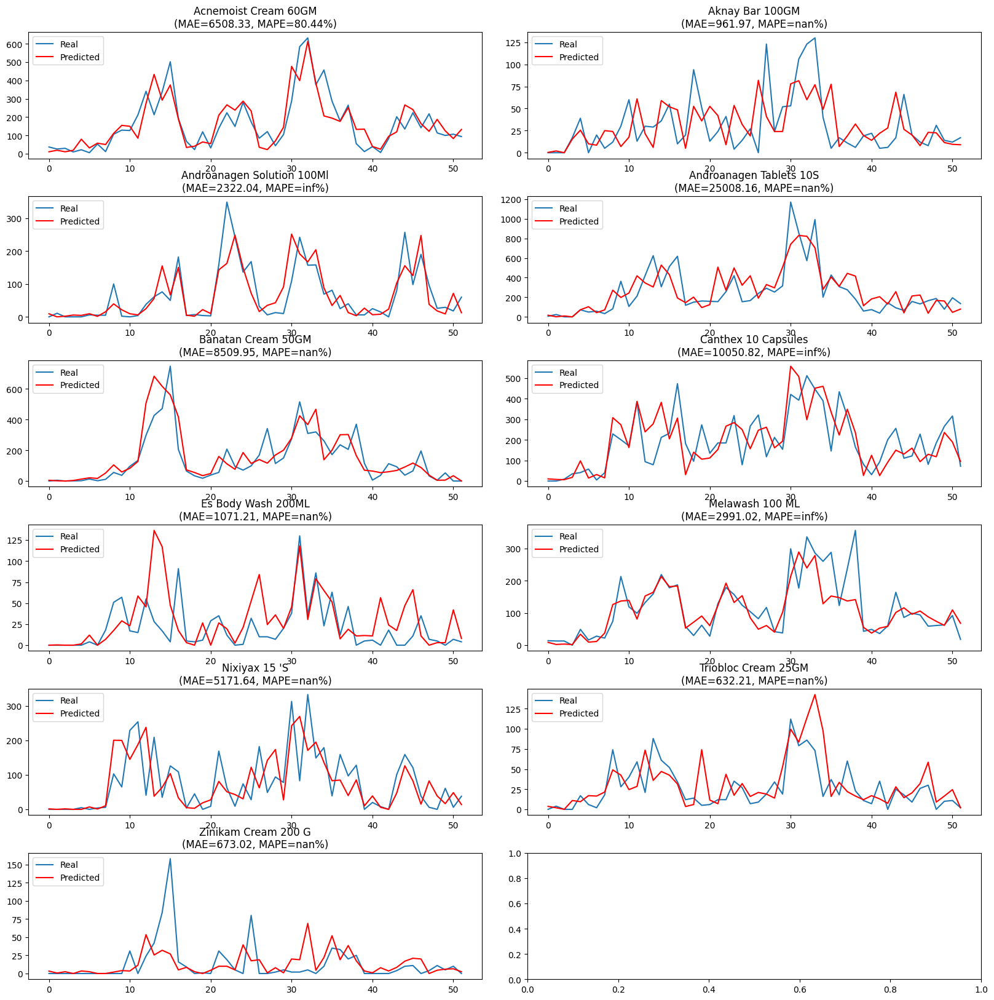

In [ ]:
df = pd.read_csv('/content/salesweekly (1).csv')
subplotindex = 0
numrows = 6
numcols = 2
fig, ax = plt.subplots(numrows, numcols, figsize=(20, 20))
plt.subplots_adjust(wspace=0.1, hspace=0.3)

for x in ['Acnemoist Cream 60GM', 'Aknay Bar 100GM', 'Androanagen Solution 100Ml', 'Androanagen Tablets 10S', 'Banatan Cream 50GM', 'Canthex 10 Capsules', 'Es Body Wash 200ML', 'Melawash 100 ML', "Nixiyax 15 'S", 'Triobloc Cream 25GM', 'Zinikam Cream 200 G']:
    rowindex = math.floor(subplotindex / numcols)
    colindex = subplotindex - (rowindex * numcols)
    X = df[x].values
    size = len(X) - 52
    test = X[size:len(X)]
    train = X[0:size]
    predictions = []

    history = [x for x in train]

    for i in range(len(test)):
        obs = [train[-(y * 52) + i] for y in range(1, min(5, (size - i) // 52 + 1))]
        yhat = np.mean(obs)
        predictions.append(yhat)

    error = mean_squared_error(test, predictions)
    perror = mean_absolute_percentage_error(test, predictions)

    resultsRollingdf.loc['Seasonal Naive MSE', x] = error
    resultsRollingdf.loc['Seasonal Naive MAPE', x] = perror

    ax[rowindex, colindex].set_title(x + '\n(MAE=' + str(round(error, 2)) + ', MAPE=' + str(round(perror, 2)) + '%)')
    ax[rowindex, colindex].legend(['Real', 'Predicted'], loc='upper left')
    ax[rowindex, colindex].plot(test,label='Real')
    ax[rowindex, colindex].plot(predictions, color='red',label='Predicted')
    ax[rowindex, colindex].legend(loc='upper left')
    subplotindex += 1

plt.show()



<ipython-input-3-b24a99ea3721>:10: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
<ipython-input-3-b24a99ea3721>:10: RuntimeWarning: invalid value encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
<ipython-input-3-b24a99ea3721>:10: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
<ipython-input-3-b24a99ea3721>:10: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
<ipython-input-3-b24a99ea3721>:10: RuntimeWarning: invalid value encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
<ipython-input-3-b24a99ea3721>:10: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
<ipython-input-3-b24a99ea3721>:10: RuntimeWarning: invalid value encountered in divide
  return np.mean(np.abs((y_true -

Summary: Seasonal Naive method used for forecasting.


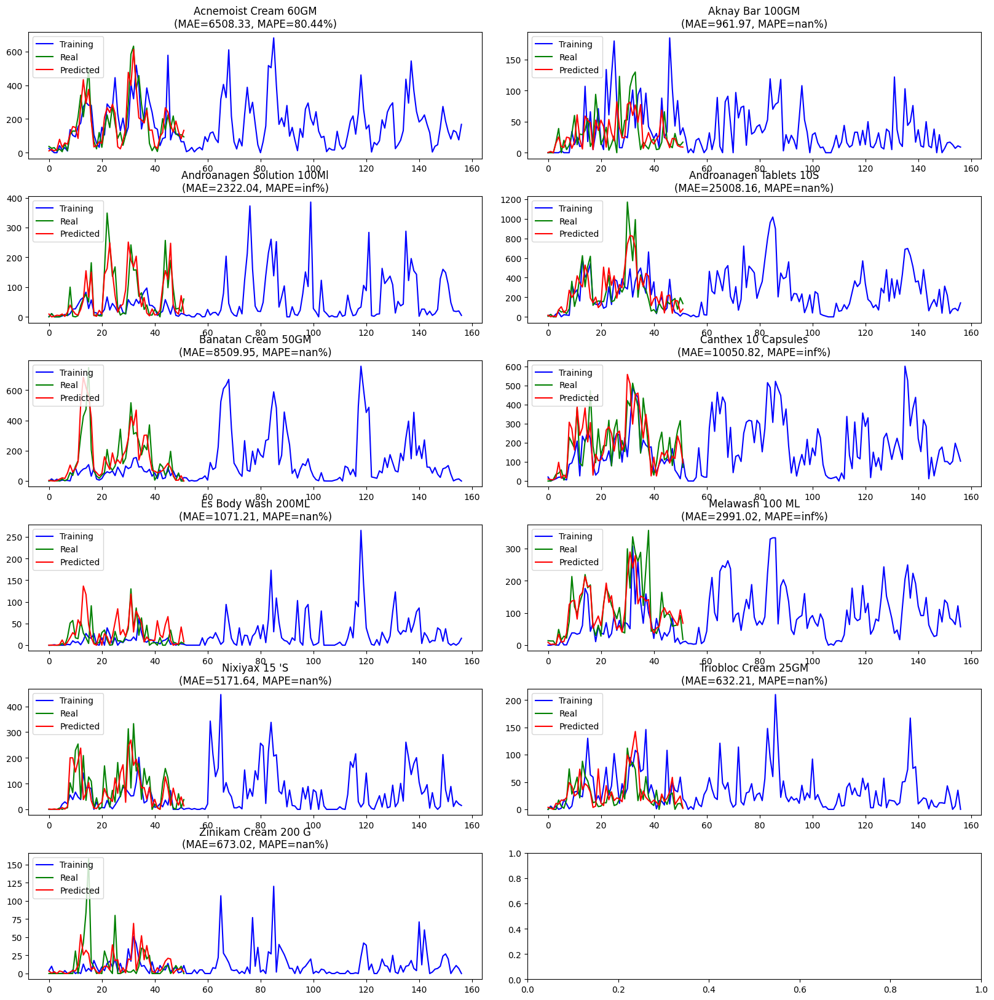

In [ ]:
# import math
# import pandas as pd
# import matplotlib.pyplot as plt
# import numpy as np
# from sklearn.metrics import mean_squared_error

# # Load the dataset
# df = pd.read_csv('/content/salesweekly (1).csv')

# # Define the plotting parameters
# subplotindex = 0
# numrows = 6
# numcols = 2
# fig, ax = plt.subplots(numrows, numcols, figsize=(20, 20))
# plt.subplots_adjust(wspace=0.1, hspace=0.3)

# # Placeholder for results
# resultsRollingdf = pd.DataFrame(index=['Seasonal Naive MSE', 'Seasonal Naive MAPE'])

# # Loop over each series
# for x in ['Acnemoist Cream 60GM', 'Aknay Bar 100GM', 'Androanagen Solution 100Ml', 'Androanagen Tablets 10S',
#           'Banatan Cream 50GM', 'Canthex 10 Capsules', 'Es Body Wash 200ML', 'Melawash 100 ML',
#           "Nixiyax 15 'S", 'Triobloc Cream 25GM', 'Zinikam Cream 200 G']:
#     rowindex = math.floor(subplotindex / numcols)
#     colindex = subplotindex - (rowindex * numcols)

#     # Prepare data
#     X = df[x].values
#     size = len(X) - 52
#     test = X[size:len(X)]
#     train = X[0:size]
#     predictions = []

#     # Seasonal Naive method
#     for i in range(len(test)):
#         obs = [train[-(y * 52) + i] for y in range(1, min(5, (size - i) // 52 + 1))]  # Using weekly seasonality
#         yhat = np.mean(obs)  # Simple mean of past seasonal values
#         predictions.append(yhat)

#     # Calculate error metrics
#     error = mean_squared_error(test, predictions)
#     perror = mean_absolute_percentage_error(test, predictions)

#     # Store results
#     resultsRollingdf.loc['Seasonal Naive MSE', x] = error
#     resultsRollingdf.loc['Seasonal Naive MAPE', x] = perror

#     # Plot
#     ax[rowindex, colindex].set_title(x + '\n(MAE=' + str(round(error, 2)) + ', MAPE=' + str(round(perror, 2)) + '%)')
#     ax[rowindex, colindex].plot(train, label='Training', color='blue')  # Plot training data
#     ax[rowindex, colindex].plot(test, label='Real', color='green')  # Plot test data
#     ax[rowindex, colindex].plot(predictions, color='red', label='Predicted')  # Plot predictions
#     ax[rowindex, colindex].legend(loc='upper left')
#     subplotindex += 1

# # Print summary message
# print("Summary: Seasonal Naive method used for forecasting.")

# plt.show()


### 4.3.2. ARIMA Forecasting

ARIMA method was used to to carry out short-term (rolling forecast) and long-term forecasting based on test data. Before each forecast is made, the process of optimizing hyper-parameters (p,d,q) of ARIMA model was carry out. Then, with optimal set of parameters, rolling forecast and long-term forecasting was carried out. Seasonal ARIMA (SARIMA) method was tested by using Auto-ARIMA implementation. This implementation has built-in stepwise optimizer which chooses optimal set of parameters (p,d,q for non-seasonal and p,d,q,P,D,Q for seasonal series,

#### 4.3.2.1. Choosing parameters for ARIMA model

First, method arma_order_select_ic was used to determine initial p and q parameters. The method computes Akaike’s Information Criterion (AIC) for many ARIMA models and chooses the best configuration. It is important to note that AIC tend not to be a good guide to selecting the appropriate order of differencing (d) of a model, but only for selecting the values of p and q.

In [ ]:
import statsmodels.api as sm
df = pd.read_csv('/content/salesweekly (1).csv')
warnings.filterwarnings("ignore")
for x in ['Acnemoist Cream 60GM', 'Aknay Bar 100GM', 'Androanagen Solution 100Ml', 'Androanagen Tablets 10S', 'Banatan Cream 50GM', 'Canthex 10 Capsules', 'Es Body Wash 200ML', 'Melawash 100 ML', "Nixiyax 15 'S", 'Triobloc Cream 25GM', 'Zinikam Cream 200 G']:
    resDiff = sm.tsa.arma_order_select_ic(df[x], max_ar=5, max_ma=5, ic='aic', trend='c')
    print('ARMA(p,q,'+x+') =',resDiff['aic_min_order'],'is the best.')

ARMA(p,q,Acnemoist Cream 60GM) = (3, 2) is the best.
ARMA(p,q,Aknay Bar 100GM) = (5, 5) is the best.
ARMA(p,q,Androanagen Solution 100Ml) = (4, 2) is the best.
ARMA(p,q,Androanagen Tablets 10S) = (3, 2) is the best.
ARMA(p,q,Banatan Cream 50GM) = (3, 2) is the best.
ARMA(p,q,Canthex 10 Capsules) = (4, 2) is the best.
ARMA(p,q,Es Body Wash 200ML) = (2, 0) is the best.
ARMA(p,q,Melawash 100 ML) = (3, 2) is the best.
ARMA(p,q,Nixiyax 15 'S) = (2, 4) is the best.
ARMA(p,q,Triobloc Cream 25GM) = (3, 2) is the best.
ARMA(p,q,Zinikam Cream 200 G) = (4, 2) is the best.


However, AIC is not used to score accuracy of the forecasting methods in this research. Mean squared error is used instead. For that, reason, grid search optimization method was applied, where different combinations of the hyper-parameters were used to calculate MSE and then, the combination producing the least MSE was chosen as optimal. Grid search optimization is carried out for both approaches in forecasting: rolling and long-term.

Grid search optimization for rolling forecast produced the following best combinations of the hyper-parameters:

In [ ]:
# def evaluate_arima_model(X, arima_order):
#     train_size = int(len(X) * 0.66)
#     train, test = X[0:train_size], X[train_size:]
#     history = [x for x in train]
#     predictions = list()
#     for t in range(len(test)):
#         model = ARIMA(history, order=arima_order)
#         model_fit = model.fit(disp=0)
#         yhat = model_fit.forecast()[0]
#         predictions.append(yhat)
#         history.append(test[t])
#     error = mean_squared_error(test, predictions)
#     return error

# def evaluate_models(f, dataset, p_values, d_values, q_values):
#     best_score, best_cfg = float("inf"), None
#     for p in p_values:
#         for d in d_values:
#             for q in q_values:
#                 order = (p,d,q)
#                 try:
#                     mse = evaluate_arima_model(dataset, order)
#                     if mse < best_score:
#                         best_score, best_cfg = mse, order
#                 except:
#                     continue
#     print(f+' - Best ARIMA%s MSE=%.3f' % (best_cfg, best_score))

# p_values = range(0, 6)
# d_values = range(0, 2)
# q_values = range(0, 6)

# warnings.filterwarnings("ignore")

# df = pd.read_csv('/content/salesweekly.csv')

# for f in ['Acnemoist Cream 60GM', 'Aknay Bar 100GM', 'Androanagen Solution 100Ml', 'Androanagen Tablets 10S', 'Banatan Cream 50GM', 'Canthex 10 Capsules', 'Es Body Wash 200ML', 'Melawash 100 ML', "Nixiyax 15 'S", 'Triobloc Cream 25GM', 'Zinikam Cream 200 G']:
#     evaluate_models(f, df[f].values, p_values, d_values, q_values)

In [ ]:
# import pandas as pd
# import numpy as np
# from statsmodels.tsa.arima.model import ARIMA
# from sklearn.metrics import mean_squared_error

# def evaluate_arima_model(X, arima_order):
#     train_size = int(len(X) * 0.66)
#     train, test = X[0:train_size], X[train_size:]
#     history = [x for x in train]
#     predictions = list()
#     for t in range(len(test)):
#         model = ARIMA(history, order=arima_order)
#         model_fit = model.fit()
#         yhat = model_fit.forecast()[0]
#         predictions.append(yhat)
#         history.append(test[t])
#     error = mean_squared_error(test, predictions)
#     return error

# def evaluate_models(product, dataset, p_values, d_values, q_values):
#     best_score, best_cfg = float("inf"), None
#     for p in p_values:
#         for d in d_values:
#             for q in q_values:
#                 order = (p, d, q)
#                 try:
#                     mse = evaluate_arima_model(dataset, order)
#                     if mse < best_score:
#                         best_score, best_cfg = mse, order
#                 except:
#                     continue
#     print(f'{product} - Best ARIMA{best_cfg} MSE={best_score:.3f}')

# # Load your dataset (replace 'your_data.csv' with your actual file)
# df = pd.read_csv('salesweekly.csv')

# # Define hyperparameter ranges
# p_values = range(0, 6)
# d_values = range(0, 2)
# q_values = range(0, 6)

# # Specify the products you want to evaluate
# products_to_evaluate = ['Acnemoist Cream 60GM', 'Aknay Bar 100GM', 'Androanagen Solution 100Ml',
#                          'Androanagen Tablets 10S', 'Banatan Cream 50GM', 'Canthex 10 Capsules',
#                          'Es Body Wash 200ML', 'Melawash 100 ML', "Nixiyax 15 'S", 'Triobloc Cream 25GM',
#                          'Zinikam Cream 200 G']

# # Evaluate ARIMA models for each product
# for product in products_to_evaluate:
#     product_data = df[product].diff().dropna()  # Apply differencing to make the data stationary
#     evaluate_models(product, product_data.values, p_values, d_values, q_values)


Grid search optimization for long-term forecast produced the following best combinations of the hyper-parameters:

In [ ]:
pip install pmdarima

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 29.3 MB/s eta 0:00:00


In [ ]:
import pandas as pd
from pmdarima import auto_arima
from sklearn.metrics import mean_squared_error

def evaluate_arima_model(X):
    train_size = int(len(X) - 50)
    train, test = X[0:train_size], X[train_size:]

    # Automatically select the best ARIMA model
    model = auto_arima(train, suppress_warnings=True, seasonal=False)

    # Forecast the test set
    forecast, conf_int = model.predict(n_periods=len(test), return_conf_int=True)

    # Calculate the mean squared error
    error = mean_squared_error(test, forecast)

    # Get the best model parameters
    best_params = model.get_params()

    return error, best_params

def evaluate_models(f, dataset):
    mse, best_params = evaluate_arima_model(dataset)
    print(f'{f} - Best ARIMA Model MSE={mse:.3f}, Best Parameters: {best_params}')

# Load your dataset (replace 'your_data.csv' with your actual file)
df = pd.read_csv('/content/salesweekly (1).csv')

# Specify the products you want to evaluate
products_to_evaluate = ['Acnemoist Cream 60GM', 'Aknay Bar 100GM', 'Androanagen Solution 100Ml',
                         'Androanagen Tablets 10S', 'Banatan Cream 50GM', 'Canthex 10 Capsules',
                         'Es Body Wash 200ML', 'Melawash 100 ML', "Nixiyax 15 'S", 'Triobloc Cream 25GM',
                         'Zinikam Cream 200 G']

# Evaluate ARIMA models for each product
for product in products_to_evaluate:
    product_data = df[product].diff().dropna()  # Apply differencing to make the data stationary
    evaluate_models(product, product_data.values)


Acnemoist Cream 60GM - Best ARIMA Model MSE=13000.862, Best Parameters: {'maxiter': 50, 'method': 'lbfgs', 'order': (0, 0, 2), 'out_of_sample_size': 0, 'scoring': 'mse', 'scoring_args': {}, 'seasonal_order': (0, 0, 0, 0), 'start_params': None, 'suppress_warnings': True, 'trend': None, 'with_intercept': False}
Aknay Bar 100GM - Best ARIMA Model MSE=1304.495, Best Parameters: {'maxiter': 50, 'method': 'lbfgs', 'order': (0, 0, 2), 'out_of_sample_size': 0, 'scoring': 'mse', 'scoring_args': {}, 'seasonal_order': (0, 0, 0, 0), 'start_params': None, 'suppress_warnings': True, 'trend': None, 'with_intercept': False}
Androanagen Solution 100Ml - Best ARIMA Model MSE=6216.526, Best Parameters: {'maxiter': 50, 'method': 'lbfgs', 'order': (3, 0, 1), 'out_of_sample_size': 0, 'scoring': 'mse', 'scoring_args': {}, 'seasonal_order': (0, 0, 0, 0), 'start_params': None, 'suppress_warnings': True, 'trend': None, 'with_intercept': False}
Androanagen Tablets 10S - Best ARIMA Model MSE=52709.457, Best Param

From the optimization stand of point, some series are considered as so-called white noise - random time series data. Those are series for whom the best result was achieved with p=0, d=0 and q=0.

#### 4.3.2.2. Rolling forecasting with ARIMA model

In [ ]:
from statsmodels.tsa.arima.model import ARIMA

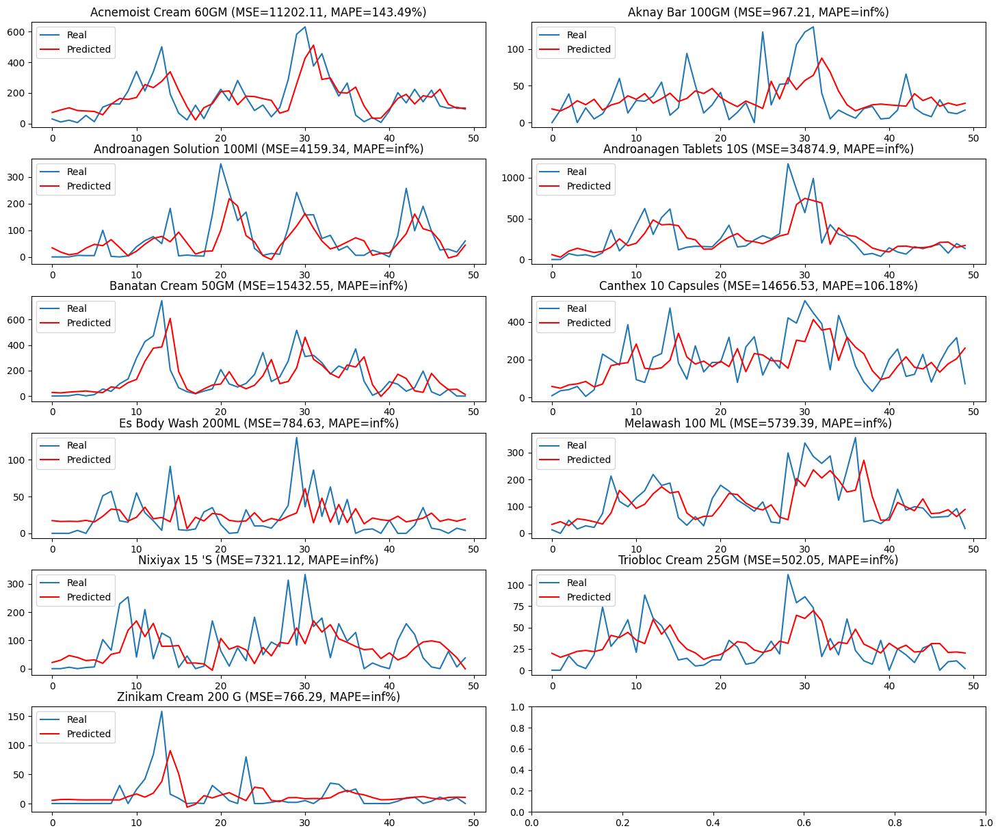

In [ ]:
df = pd.read_csv('/content/salesweekly (1).csv')

Acnemoist_Cream_60GM= {'series':'Acnemoist Cream 60GM','p':4,'d':0,'q':3}
Aknay_Bar_100GM= {'series':'Aknay Bar 100GM','p':4,'d':0,'q':2}
Androanagen_Solution_100Ml= {'series':'Androanagen Solution 100Ml','p':2,'d':0,'q':4}
Androanagen_Tablets_10S= {'series':'Androanagen Tablets 10S','p':3,'d':0,'q':3}
Banatan_Cream_50GM= {'series':'Banatan Cream 50GM','p':3,'d':0,'q':2}
Canthex_10_Capsules= {'series':'Canthex 10 Capsules','p':3,'d':0,'q':1}
Es_Body_Wash_200ML= {'series':'Es Body Wash 200ML','p':0,'d':0,'q':1}
Melawash_100_ML= {'series':'Melawash 100 ML','p':5,'d':0,'q':2}
Nixiyax_15_S= {'series':"Nixiyax 15 'S",'p':4,'d':0,'q':5}
Triobloc_Cream_25GM= {'series':'Triobloc Cream 25GM','p':5,'d':0,'q':4}
Zinikam_Cream_200_G= {'series':'Zinikam Cream 200 G','p':0,'d':0,'q':4}

subplotindex=0
numrows=6
numcols=2
fig, ax = plt.subplots(numrows, numcols, figsize=(18,15))
plt.subplots_adjust(wspace=0.1, hspace=0.3)

warnings.filterwarnings("ignore")

for x in [Acnemoist_Cream_60GM,Aknay_Bar_100GM,Androanagen_Solution_100Ml,Androanagen_Tablets_10S,Banatan_Cream_50GM,Canthex_10_Capsules,Es_Body_Wash_200ML,Melawash_100_ML,Nixiyax_15_S,Triobloc_Cream_25GM,Zinikam_Cream_200_G]:
    rowindex=math.floor(subplotindex/numcols)
    colindex=subplotindex-(rowindex*numcols)
    X = df[x['series']].values
    size = len(X)-50
    train, test = X[0:size], X[size:len(X)]
    history = [x for x in train]
    predictions = list()
    for t in range(len(test)):
        model = ARIMA(history, order=(x['p'],x['d'],x['q']))
        model_fit = model.fit()
        output = model_fit.forecast()
        yhat = output[0]
        predictions.append(yhat)
        obs = test[t]
        history.append(obs)
    error = mean_squared_error(test, predictions)
    perror = mean_absolute_percentage_error(test, predictions)
    resultsRollingdf.loc['ARIMA MSE',x['series']]=error
    resultsRollingdf.loc['ARIMA MAPE',x['series']]=perror
    ax[rowindex,colindex].set_title(x['series']+' (MSE=' + str(round(error,2))+', MAPE='+ str(round(perror,2)) +'%)')
    ax[rowindex,colindex].legend(['Real', 'Predicted'], loc='upper left')
    ax[rowindex,colindex].plot(test,label='Real')
    ax[rowindex,colindex].plot(predictions, color='red',label='Predicted')
    ax[rowindex, colindex].legend(loc='upper left')
    subplotindex=subplotindex+1
plt.show()

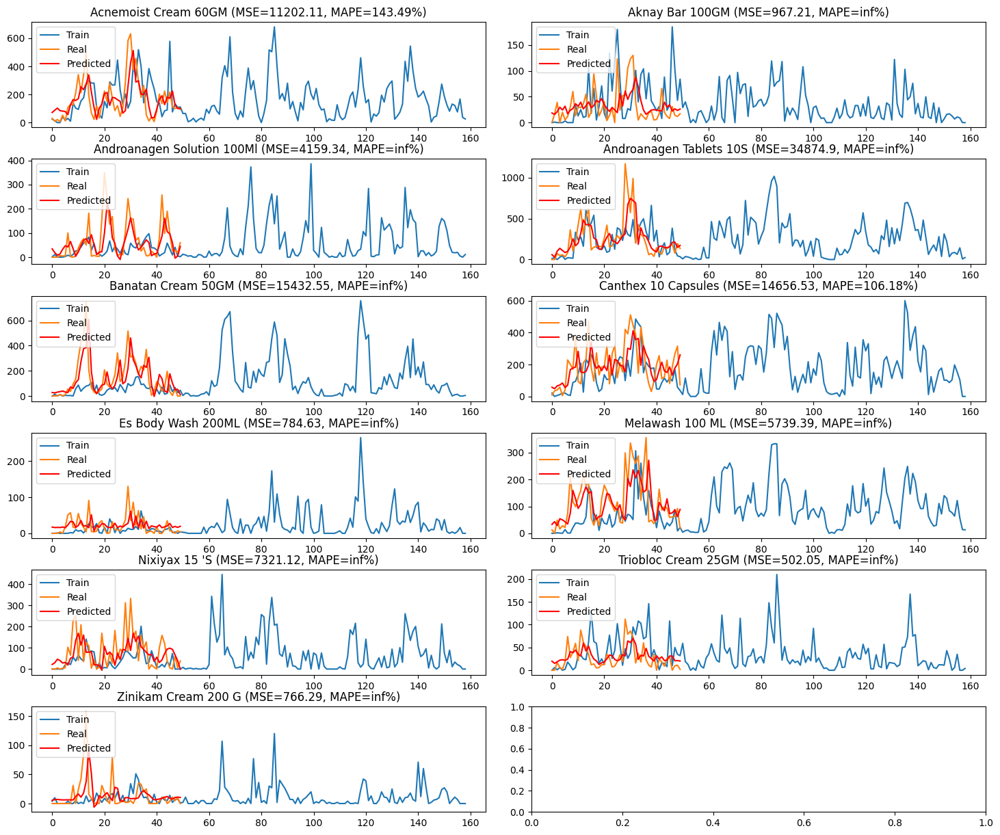

In [ ]:
#df = pd.read_csv('/content/salesweekly (1).csv')

#Acnemoist_Cream_60GM= {'series':'Acnemoist Cream 60GM','p':4,'d':0,'q':3}
#Aknay_Bar_100GM= {'series':'Aknay Bar 100GM','p':4,'d':0,'q':2}
#Androanagen_Solution_100Ml= {'series':'Androanagen Solution 100Ml','p':2,'d':0,'q':4}
#Androanagen_Tablets_10S= {'series':'Androanagen Tablets 10S','p':3,'d':0,'q':3}
#Banatan_Cream_50GM= {'series':'Banatan Cream 50GM','p':3,'d':0,'q':2}
#Canthex_10_Capsules= {'series':'Canthex 10 Capsules','p':3,'d':0,'q':1}
#Es_Body_Wash_200ML= {'series':'Es Body Wash 200ML','p':0,'d':0,'q':1}
#Melawash_100_ML= {'series':'Melawash 100 ML','p':5,'d':0,'q':2}
#Nixiyax_15_S= {'series':"Nixiyax 15 'S",'p':4,'d':0,'q':5}
#Triobloc_Cream_25GM= {'series':'Triobloc Cream 25GM','p':5,'d':0,'q':4}
#Zinikam_Cream_200_G= {'series':'Zinikam Cream 200 G','p':0,'d':0,'q':4}

#subplotindex=0
#numrows=6
#numcols=2
#fig, ax = plt.subplots(numrows, numcols, figsize=(18,15))
#plt.subplots_adjust(wspace=0.1, hspace=0.3)

#for x in [Acnemoist_Cream_60GM,Aknay_Bar_100GM,Androanagen_Solution_100Ml,Androanagen_Tablets_10S,Banatan_Cream_50GM,Canthex_10_Capsules,Es_Body_Wash_200ML,Melawash_100_ML,Nixiyax_15_S,Triobloc_Cream_25GM,Zinikam_Cream_200_G]:
    #rowindex=math.floor(subplotindex/numcols)
    #colindex=subplotindex-(rowindex*numcols)
    #X = df[x['series']].values
    #size = len(X)-50
    #train, test = X[0:size], X[size:len(X)]
    #history = [x for x in train]
    #predictions = list()
    #for t in range(len(test)):
        #model = ARIMA(history, order=(x['p'],x['d'],x['q']))
        #model_fit = model.fit()
        #output = model_fit.forecast()
        #yhat = output[0]
       # predictions.append(yhat)
        #obs = test[t]
        #history.append(obs)
    #error = mean_squared_error(test, predictions)
    #perror = mean_absolute_percentage_error(test, predictions)
    #resultsRollingdf.loc['ARIMA MSE',x['series']]=error
    #resultsRollingdf.loc['ARIMA MAPE',x['series']]=perror
   # ax[rowindex,colindex].set_title(x['series']+' (MSE=' + str(round(error,2))+', MAPE='+ str(round(perror,2)) +'%)')
    #ax[rowindex,colindex].plot(train, label='Train')  # Plot train data
   # ax[rowindex,colindex].plot(test, label='Real')  # Plot test data
   # ax[rowindex,colindex].plot(predictions, color='red',label='Predicted')
   # ax[rowindex, colindex].legend(loc='upper left')
    #subplotindex=subplotindex+1
plt.show()

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood op

Acnemoist Cream 60GM
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  208
Model:                 ARIMA(4, 0, 3)   Log Likelihood               -1263.234
Date:                Sun, 21 Apr 2024   AIC                           2544.468
Time:                        04:16:10   BIC                           2574.506
Sample:                             0   HQIC                          2556.614
                                - 208                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        167.0019     25.785      6.477      0.000     116.465     217.539
ar.L1          0.1786      0.357      0.501      0.617      -0.521       0.878
ar.L2         -0.2107      0.34

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood op

Aknay Bar 100GM
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  208
Model:                 ARIMA(4, 0, 2)   Log Likelihood               -1020.409
Date:                Sun, 21 Apr 2024   AIC                           2056.819
Time:                        04:16:45   BIC                           2083.519
Sample:                             0   HQIC                          2067.615
                                - 208                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         33.6126      6.743      4.985      0.000      20.396      46.829
ar.L1          1.1232      0.449      2.500      0.012       0.243       2.004
ar.L2         -0.0598      0.421    

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood op

Androanagen Solution 100Ml
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  208
Model:                 ARIMA(2, 0, 4)   Log Likelihood               -1147.901
Date:                Sun, 21 Apr 2024   AIC                           2311.802
Time:                        04:17:26   BIC                           2338.503
Sample:                             0   HQIC                          2322.599
                                - 208                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         56.8739     11.008      5.166      0.000      35.298      78.450
ar.L1          1.2794      0.034     37.589      0.000       1.213       1.346
ar.L2         -0.9337    

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood op

Androanagen Tablets 10S
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  208
Model:                 ARIMA(3, 0, 3)   Log Likelihood               -1352.236
Date:                Sun, 21 Apr 2024   AIC                           2720.471
Time:                        04:17:55   BIC                           2747.171
Sample:                             0   HQIC                          2731.267
                                - 208                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        249.7045     48.168      5.184      0.000     155.297     344.112
ar.L1          0.5602      0.251      2.230      0.026       0.068       1.053
ar.L2         -0.4539      0

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood op

Banatan Cream 50GM
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  208
Model:                 ARIMA(3, 0, 2)   Log Likelihood               -1261.691
Date:                Sun, 21 Apr 2024   AIC                           2537.382
Time:                        04:18:32   BIC                           2560.745
Sample:                             0   HQIC                          2546.829
                                - 208                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        125.9347     42.874      2.937      0.003      41.904     209.965
ar.L1          1.3919      0.054     25.936      0.000       1.287       1.497
ar.L2         -1.4007      0.062 

<ipython-input-2-49ea1a12af53>:10: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100


Es Body Wash 200ML
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  208
Model:                 ARIMA(0, 0, 1)   Log Likelihood               -1012.496
Date:                Sun, 21 Apr 2024   AIC                           2030.993
Time:                        04:18:52   BIC                           2041.006
Sample:                             0   HQIC                          2035.042
                                - 208                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         22.4872      4.517      4.978      0.000      13.634      31.341
ma.L1          0.3198      0.053      6.002      0.000       0.215       0.424
sigma2       989.4337     51.612 

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood op

Melawash 100 ML
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  208
Model:                 ARIMA(5, 0, 2)   Log Likelihood               -1150.106
Date:                Sun, 21 Apr 2024   AIC                           2318.211
Time:                        04:19:36   BIC                           2348.249
Sample:                             0   HQIC                          2330.357
                                - 208                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         95.7506     18.941      5.055      0.000      58.626     132.875
ar.L1         -0.1544      0.172     -0.896      0.370      -0.492       0.183
ar.L2         -0.2224      0.135    

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood op

Nixiyax 15 'S
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  208
Model:                 ARIMA(4, 0, 5)   Log Likelihood               -1170.068
Date:                Sun, 21 Apr 2024   AIC                           2362.137
Time:                        04:20:33   BIC                           2398.850
Sample:                             0   HQIC                          2376.981
                                - 208                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         65.7436     17.700      3.714      0.000      31.053     100.435
ar.L1          1.0126      0.745      1.360      0.174      -0.447       2.472
ar.L2         -0.0163      0.907     -

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood op

Triobloc Cream 25GM
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  208
Model:                 ARIMA(5, 0, 4)   Log Likelihood                -997.314
Date:                Sun, 21 Apr 2024   AIC                           2016.629
Time:                        04:21:30   BIC                           2053.342
Sample:                             0   HQIC                          2031.473
                                - 208                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         33.0029      4.650      7.097      0.000      23.889      42.117
ar.L1          1.8395      0.708      2.599      0.009       0.452       3.227
ar.L2         -1.7846      1.021

<ipython-input-2-49ea1a12af53>:10: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100


Zinikam Cream 200 G
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  208
Model:                 ARIMA(0, 0, 4)   Log Likelihood                -909.731
Date:                Sun, 21 Apr 2024   AIC                           1831.461
Time:                        04:21:39   BIC                           1851.487
Sample:                             0   HQIC                          1839.559
                                - 208                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         11.8691      4.023      2.951      0.003       3.985      19.753
ma.L1          0.2569      0.044      5.868      0.000       0.171       0.343
ma.L2          0.2609      0.059

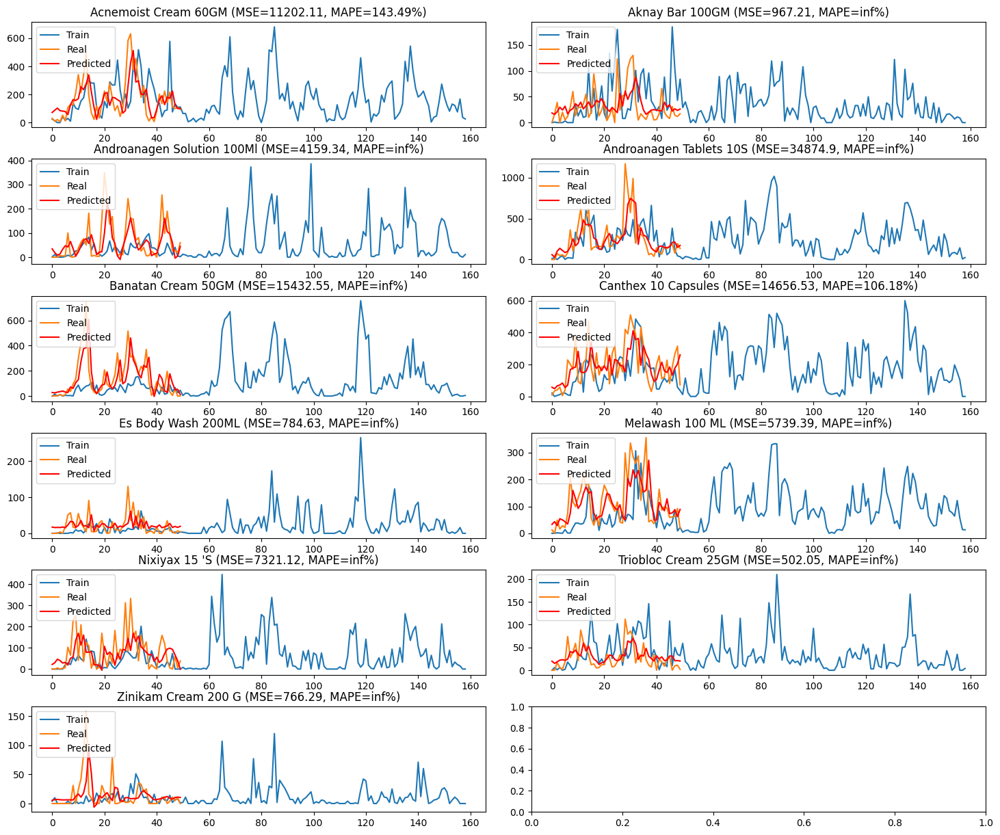

In [ ]:
# import math
# import pandas as pd
# import matplotlib.pyplot as plt
# from statsmodels.tsa.arima.model import ARIMA
# from sklearn.metrics import mean_squared_error
# import numpy as np

# # Function to calculate Mean Absolute Percentage Error
# def mean_absolute_percentage_error(y_true, y_pred):
#     return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# # Load the dataset
# df = pd.read_csv('/content/salesweekly (1).csv')

# # Define parameters for each series
# Acnemoist_Cream_60GM = {'series': 'Acnemoist Cream 60GM', 'p': 4, 'd': 0, 'q': 3}
# Aknay_Bar_100GM = {'series': 'Aknay Bar 100GM', 'p': 4, 'd': 0, 'q': 2}
# Androanagen_Solution_100Ml = {'series': 'Androanagen Solution 100Ml', 'p': 2, 'd': 0, 'q': 4}
# Androanagen_Tablets_10S = {'series': 'Androanagen Tablets 10S', 'p': 3, 'd': 0, 'q': 3}
# Banatan_Cream_50GM = {'series': 'Banatan Cream 50GM', 'p': 3, 'd': 0, 'q': 2}
# Canthex_10_Capsules = {'series': 'Canthex 10 Capsules', 'p': 3, 'd': 0, 'q': 1}
# Es_Body_Wash_200ML = {'series': 'Es Body Wash 200ML', 'p': 0, 'd': 0, 'q': 1}
# Melawash_100_ML = {'series': 'Melawash 100 ML', 'p': 5, 'd': 0, 'q': 2}
# Nixiyax_15_S = {'series': "Nixiyax 15 'S", 'p': 4, 'd': 0, 'q': 5}
# Triobloc_Cream_25GM = {'series': 'Triobloc Cream 25GM', 'p': 5, 'd': 0, 'q': 4}
# Zinikam_Cream_200_G = {'series': 'Zinikam Cream 200 G', 'p': 0, 'd': 0, 'q': 4}

# # Setup for plotting
# numrows = 6
# numcols = 2
# fig, ax = plt.subplots(numrows, numcols, figsize=(18, 15))
# plt.subplots_adjust(wspace=0.1, hspace=0.3)

# # Placeholder for results
# resultsRollingdf = pd.DataFrame(index=['ARIMA MSE', 'ARIMA MAPE'])

# subplotindex = 0

# # Loop over each series
# for x in [Acnemoist_Cream_60GM, Aknay_Bar_100GM, Androanagen_Solution_100Ml, Androanagen_Tablets_10S,
#           Banatan_Cream_50GM, Canthex_10_Capsules, Es_Body_Wash_200ML, Melawash_100_ML, Nixiyax_15_S,
#           Triobloc_Cream_25GM, Zinikam_Cream_200_G]:
#     rowindex = math.floor(subplotindex / numcols)
#     colindex = subplotindex - (rowindex * numcols)
#     X = df[x['series']].values
#     size = len(X) - 50
#     train, test = X[0:size], X[size:len(X)]
#     history = [x for x in train]
#     predictions = list()
#     for t in range(len(test)):
#         model = ARIMA(history, order=(x['p'], x['d'], x['q']))
#         model_fit = model.fit()
#         output = model_fit.forecast()
#         yhat = output[0]
#         predictions.append(yhat)
#         obs = test[t]
#         history.append(obs)

#     # Calculate error metrics
#     error = mean_squared_error(test, predictions)
#     perror = mean_absolute_percentage_error(test, predictions)
#     resultsRollingdf.loc['ARIMA MSE', x['series']] = error
#     resultsRollingdf.loc['ARIMA MAPE', x['series']] = perror

#     # Plotting
#     ax[rowindex, colindex].set_title(x['series'] + ' (MSE=' + str(round(error, 2)) + ', MAPE=' + str(round(perror, 2)) + '%)')
#     ax[rowindex, colindex].plot(train, label='Train')  # Plot train data
#     ax[rowindex, colindex].plot(test, label='Real')  # Plot test data
#     ax[rowindex, colindex].plot(predictions, color='red', label='Predicted')
#     ax[rowindex, colindex].legend(loc='upper left')

#     # Print model summary
#     # print(x['series'])
#     # print(model_fit.summary())

#     subplotindex += 1

# plt.show()




#### 4.3.2.3. Long-term forecasting with ARIMA model

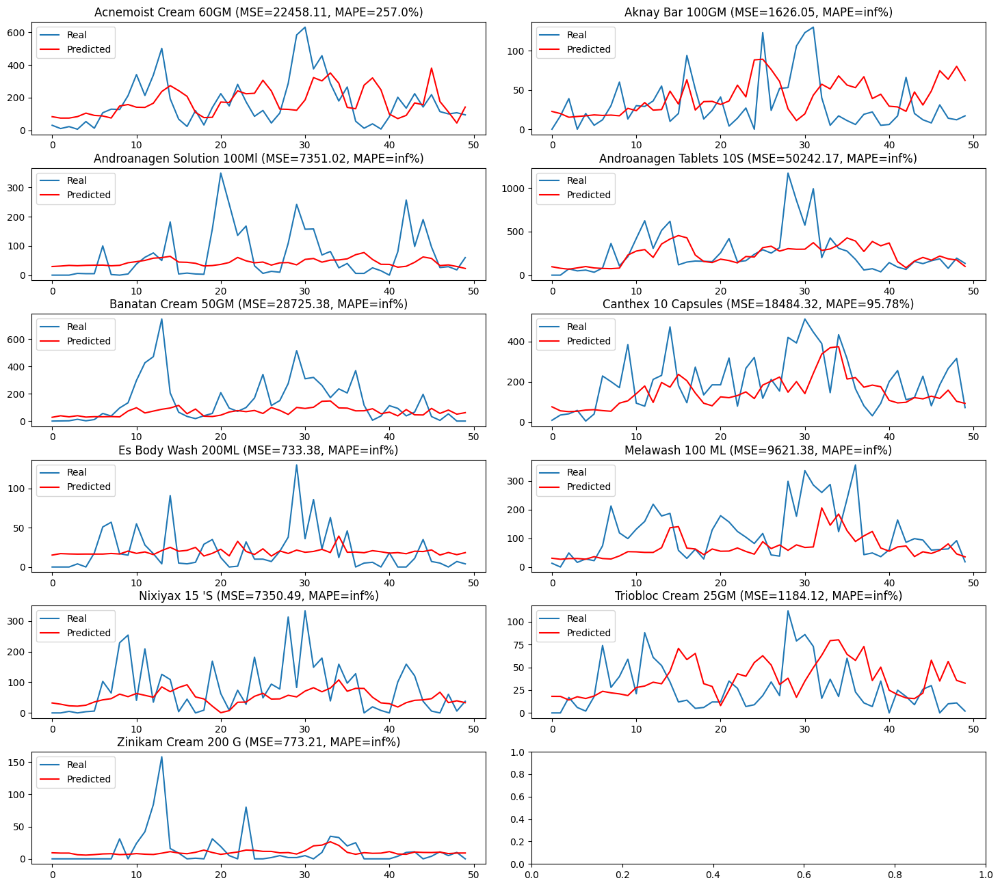

In [ ]:
df = pd.read_csv('/content/salesweekly (1).csv')

Acnemoist_Cream_60GM= {'series':'Acnemoist Cream 60GM','p':4,'d':0,'q':3}
Aknay_Bar_100GM= {'series':'Aknay Bar 100GM','p':4,'d':0,'q':2}
Androanagen_Solution_100Ml= {'series':'Androanagen Solution 100Ml','p':2,'d':0,'q':4}
Androanagen_Tablets_10S= {'series':'Androanagen Tablets 10S','p':3,'d':0,'q':3}
Banatan_Cream_50GM= {'series':'Banatan Cream 50GM','p':3,'d':0,'q':2}
Canthex_10_Capsules= {'series':'Canthex 10 Capsules','p':3,'d':0,'q':1}
Es_Body_Wash_200ML= {'series':'Es Body Wash 200ML','p':0,'d':0,'q':1}
Melawash_100_ML= {'series':'Melawash 100 ML','p':5,'d':0,'q':2}
Nixiyax_15_S= {'series':"Nixiyax 15 'S",'p':4,'d':0,'q':5}
Triobloc_Cream_25GM= {'series':'Triobloc Cream 25GM','p':5,'d':0,'q':4}
Zinikam_Cream_200_G= {'series':'Zinikam Cream 200 G','p':0,'d':0,'q':4}

subplotindex=0
numrows=6
numcols=2
fig, ax = plt.subplots(numrows, numcols, figsize=(18,16))
plt.subplots_adjust(wspace=0.1, hspace=0.3)

warnings.filterwarnings("ignore")

for x in [Acnemoist_Cream_60GM,Aknay_Bar_100GM,Androanagen_Solution_100Ml,Androanagen_Tablets_10S,Banatan_Cream_50GM,Canthex_10_Capsules,Es_Body_Wash_200ML,Melawash_100_ML,Nixiyax_15_S,Triobloc_Cream_25GM,Zinikam_Cream_200_G]:
    rowindex=math.floor(subplotindex/numcols)
    colindex=subplotindex-(rowindex*numcols)
    X = df[x['series']].values
    size = int(len(X) - 50)
    train, test = X[0:size], X[size:len(X)]
    model = ARIMA(train, order=(x['p'],x['d'],x['q']))
    model_fit = model.fit()
    forecast = model_fit.predict(1,len(test))
    error = mean_squared_error(test, forecast)
    perror = mean_absolute_percentage_error(test, forecast)
    resultsLongtermdf.loc['ARIMA MSE',x['series']]=error
    resultsLongtermdf.loc['ARIMA MAPE',x['series']]=perror
    ax[rowindex,colindex].set_title(x['series']+' (MSE=' + str(round(error,2))+', MAPE='+ str(round(perror,2)) +'%)')
    ax[rowindex,colindex].legend(['Real', 'Predicted'], loc='upper left')
    ax[rowindex,colindex].plot(test,label='Real')
    ax[rowindex,colindex].plot(forecast, color='red',label='Predicted')
    ax[rowindex, colindex].legend(loc='upper left')
    subplotindex=subplotindex+1
plt.show()

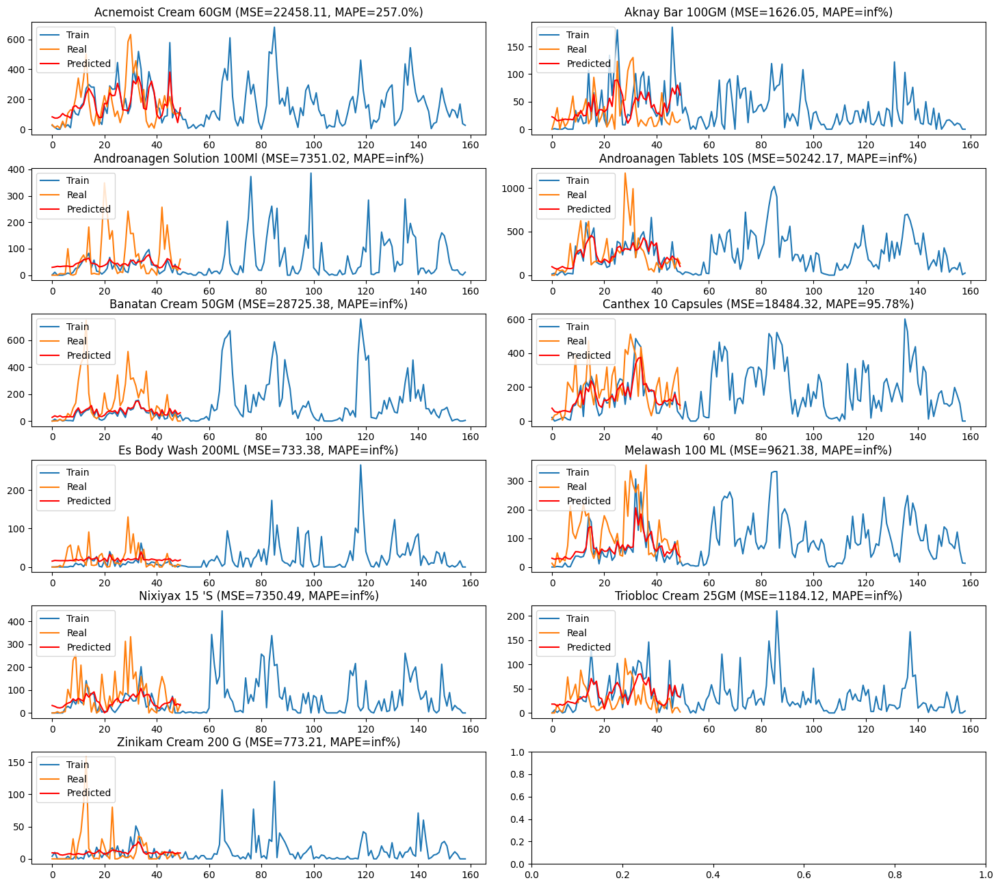

In [ ]:
df = pd.read_csv('/content/salesweekly (1).csv')

Acnemoist_Cream_60GM= {'series':'Acnemoist Cream 60GM','p':4,'d':0,'q':3}
Aknay_Bar_100GM= {'series':'Aknay Bar 100GM','p':4,'d':0,'q':2}
Androanagen_Solution_100Ml= {'series':'Androanagen Solution 100Ml','p':2,'d':0,'q':4}
Androanagen_Tablets_10S= {'series':'Androanagen Tablets 10S','p':3,'d':0,'q':3}
Banatan_Cream_50GM= {'series':'Banatan Cream 50GM','p':3,'d':0,'q':2}
Canthex_10_Capsules= {'series':'Canthex 10 Capsules','p':3,'d':0,'q':1}
Es_Body_Wash_200ML= {'series':'Es Body Wash 200ML','p':0,'d':0,'q':1}
Melawash_100_ML= {'series':'Melawash 100 ML','p':5,'d':0,'q':2}
Nixiyax_15_S= {'series':"Nixiyax 15 'S",'p':4,'d':0,'q':5}
Triobloc_Cream_25GM= {'series':'Triobloc Cream 25GM','p':5,'d':0,'q':4}
Zinikam_Cream_200_G= {'series':'Zinikam Cream 200 G','p':0,'d':0,'q':4}

subplotindex=0
numrows=6
numcols=2
fig, ax = plt.subplots(numrows, numcols, figsize=(18,16))
plt.subplots_adjust(wspace=0.1, hspace=0.3)

for x in [Acnemoist_Cream_60GM,Aknay_Bar_100GM,Androanagen_Solution_100Ml,Androanagen_Tablets_10S,Banatan_Cream_50GM,Canthex_10_Capsules,Es_Body_Wash_200ML,Melawash_100_ML,Nixiyax_15_S,Triobloc_Cream_25GM,Zinikam_Cream_200_G]:
    rowindex=math.floor(subplotindex/numcols)
    colindex=subplotindex-(rowindex*numcols)
    X = df[x['series']].values
    size = int(len(X) - 50)
    train, test = X[0:size], X[size:len(X)]
    model = ARIMA(train, order=(x['p'],x['d'],x['q']))
    model_fit = model.fit()
    forecast = model_fit.predict(1,len(test))
    error = mean_squared_error(test, forecast)
    perror = mean_absolute_percentage_error(test, forecast)
    resultsLongtermdf.loc['ARIMA MSE',x['series']]=error
    resultsLongtermdf.loc['ARIMA MAPE',x['series']]=perror
    ax[rowindex,colindex].set_title(x['series']+' (MSE=' + str(round(error,2))+', MAPE='+ str(round(perror,2)) +'%)')
    ax[rowindex,colindex].plot(train, label='Train')  # Plot training data
    ax[rowindex,colindex].plot(test, label='Real')  # Plot test data
    ax[rowindex,colindex].plot(forecast, color='red', label='Predicted')  # Plot forecast
    ax[rowindex,colindex].legend(loc='upper left')
    subplotindex=subplotindex+1
plt.show()

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Acnemoist Cream 60GM
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  159
Model:                 ARIMA(4, 0, 3)   Log Likelihood                -969.678
Date:                Sun, 21 Apr 2024   AIC                           1957.357
Time:                        04:30:59   BIC                           1984.977
Sample:                             0   HQIC                          1968.573
                                - 159                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        165.8761     26.816      6.186      0.000     113.318     218.434
ar.L1          0.1622      0.212      0.766      0.443      -0.253       0.577
ar.L2          0.1495      0.28

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-3-b24a99ea3721>:10: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100


Aknay Bar 100GM
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  159
Model:                 ARIMA(4, 0, 2)   Log Likelihood                -782.255
Date:                Sun, 21 Apr 2024   AIC                           1580.511
Time:                        04:31:01   BIC                           1605.062
Sample:                             0   HQIC                          1590.481
                                - 159                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         34.9106      7.727      4.518      0.000      19.766      50.055
ar.L1          0.7190      0.730      0.984      0.325      -0.713       2.150
ar.L2         -0.2523      0.370    

<ipython-input-3-b24a99ea3721>:10: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100


Androanagen Solution 100Ml
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  159
Model:                 ARIMA(2, 0, 4)   Log Likelihood                -874.489
Date:                Sun, 21 Apr 2024   AIC                           1764.978
Time:                        04:31:02   BIC                           1789.529
Sample:                             0   HQIC                          1774.948
                                - 159                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         52.9725     12.269      4.318      0.000      28.926      77.019
ar.L1          1.2716      0.030     42.603      0.000       1.213       1.330
ar.L2         -0.9489    

<ipython-input-3-b24a99ea3721>:10: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Androanagen Tablets 10S
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  159
Model:                 ARIMA(3, 0, 3)   Log Likelihood               -1025.609
Date:                Sun, 21 Apr 2024   AIC                           2067.218
Time:                        04:31:03   BIC                           2091.769
Sample:                             0   HQIC                          2077.188
                                - 159                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        246.7971     54.907      4.495      0.000     139.181     354.413
ar.L1          0.9511      0.363      2.621      0.009       0.240       1.662
ar.L2         -0.7797      0

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-3-b24a99ea3721>:10: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100


Banatan Cream 50GM
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  159
Model:                 ARIMA(3, 0, 2)   Log Likelihood                -957.154
Date:                Sun, 21 Apr 2024   AIC                           1928.309
Time:                        04:31:05   BIC                           1949.791
Sample:                             0   HQIC                          1937.033
                                - 159                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        118.5429     58.713      2.019      0.043       3.467     233.619
ar.L1          1.4198      0.181      7.864      0.000       1.066       1.774
ar.L2         -1.3348      0.236 

<ipython-input-3-b24a99ea3721>:10: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100


                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  159
Model:                 ARIMA(0, 0, 1)   Log Likelihood                -778.843
Date:                Sun, 21 Apr 2024   AIC                           1563.686
Time:                        04:31:05   BIC                           1572.893
Sample:                             0   HQIC                          1567.425
                                - 159                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         22.7685      5.803      3.924      0.000      11.396      34.141
ma.L1          0.3822      0.062      6.140      0.000       0.260       0.504
sigma2      1051.3936     62.316     16.872      0.0

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-3-b24a99ea3721>:10: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100


Melawash 100 ML
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  159
Model:                 ARIMA(5, 0, 2)   Log Likelihood                -868.848
Date:                Sun, 21 Apr 2024   AIC                           1755.697
Time:                        04:31:07   BIC                           1783.317
Sample:                             0   HQIC                          1766.913
                                - 159                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         86.9947     20.346      4.276      0.000      47.118     126.871
ar.L1          0.1970      1.907      0.103      0.918      -3.542       3.936
ar.L2          0.8571      0.701    

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-3-b24a99ea3721>:10: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100


Nixiyax 15 'S
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  159
Model:                 ARIMA(4, 0, 5)   Log Likelihood                -885.386
Date:                Sun, 21 Apr 2024   AIC                           1792.771
Time:                        04:31:10   BIC                           1826.529
Sample:                             0   HQIC                          1806.480
                                - 159                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         61.1537     18.925      3.231      0.001      24.061      98.247
ar.L1          0.4057      0.237      1.711      0.087      -0.059       0.870
ar.L2         -0.2523      0.153     -

/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
<ipython-input-3-b24a99ea3721>:10: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100


Triobloc Cream 25GM
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  159
Model:                 ARIMA(5, 0, 4)   Log Likelihood                -773.062
Date:                Sun, 21 Apr 2024   AIC                           1568.123
Time:                        04:31:12   BIC                           1601.881
Sample:                             0   HQIC                          1581.832
                                - 159                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         33.8876      8.265      4.100      0.000      17.688      50.087
ar.L1         -0.3189      0.359     -0.887      0.375      -1.023       0.385
ar.L2          0.8834      0.424

<ipython-input-3-b24a99ea3721>:10: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((y_true - y_pred) / y_true)) * 100


Zinikam Cream 200 G
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  159
Model:                 ARIMA(0, 0, 4)   Log Likelihood                -670.151
Date:                Sun, 21 Apr 2024   AIC                           1352.303
Time:                        04:31:12   BIC                           1370.716
Sample:                             0   HQIC                          1359.780
                                - 159                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         11.0933      4.087      2.715      0.007       3.084      19.103
ma.L1          0.1765      0.072      2.455      0.014       0.036       0.317
ma.L2          0.3484      0.074

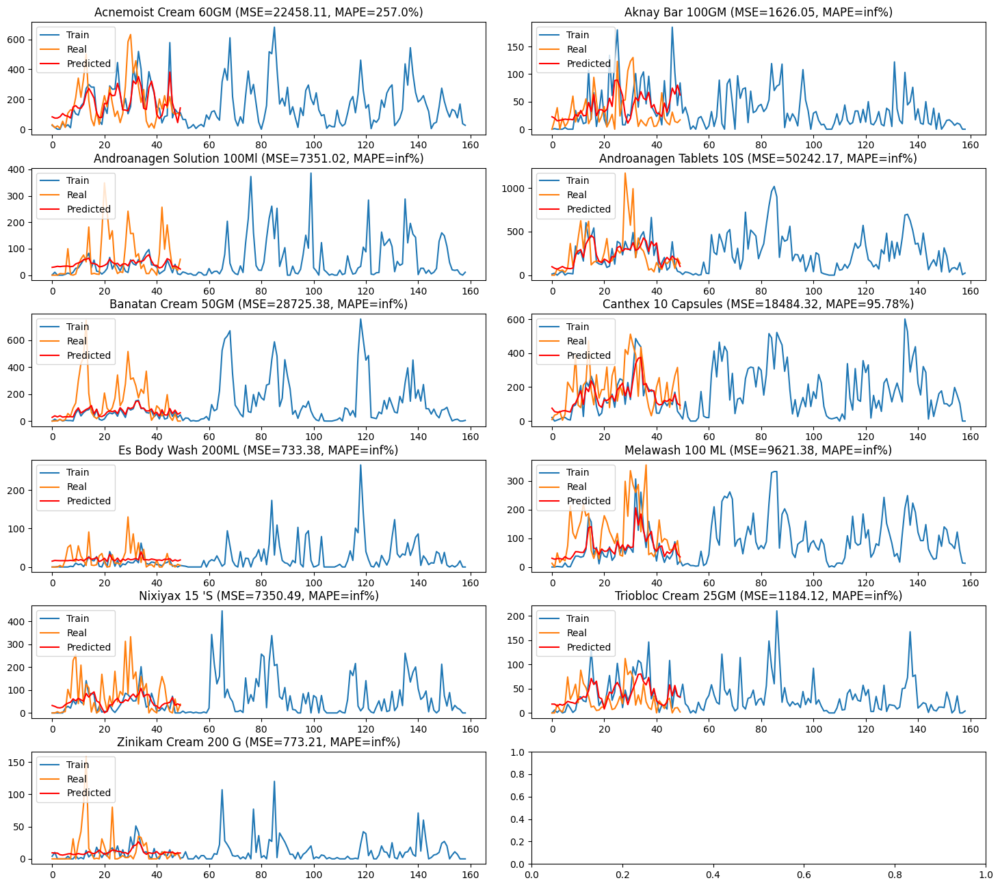

In [ ]:
import math
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
import numpy as np

# Function to calculate Mean Absolute Percentage Error
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Load the dataset
df = pd.read_csv('/content/salesweekly (1).csv')

# Define parameters for each series
Acnemoist_Cream_60GM = {'series': 'Acnemoist Cream 60GM', 'p': 4, 'd': 0, 'q': 3}
Aknay_Bar_100GM = {'series': 'Aknay Bar 100GM', 'p': 4, 'd': 0, 'q': 2}
Androanagen_Solution_100Ml = {'series': 'Androanagen Solution 100Ml', 'p': 2, 'd': 0, 'q': 4}
Androanagen_Tablets_10S = {'series': 'Androanagen Tablets 10S', 'p': 3, 'd': 0, 'q': 3}
Banatan_Cream_50GM = {'series': 'Banatan Cream 50GM', 'p': 3, 'd': 0, 'q': 2}
Canthex_10_Capsules = {'series': 'Canthex 10 Capsules', 'p': 3, 'd': 0, 'q': 1}
Es_Body_Wash_200ML = {'series': 'Es Body Wash 200ML', 'p': 0, 'd': 0, 'q': 1}
Melawash_100_ML = {'series': 'Melawash 100 ML', 'p': 5, 'd': 0, 'q': 2}
Nixiyax_15_S = {'series': "Nixiyax 15 'S", 'p': 4, 'd': 0, 'q': 5}
Triobloc_Cream_25GM = {'series': 'Triobloc Cream 25GM', 'p': 5, 'd': 0, 'q': 4}
Zinikam_Cream_200_G = {'series': 'Zinikam Cream 200 G', 'p': 0, 'd': 0, 'q': 4}

# Setup for plotting
numrows = 6
numcols = 2
fig, ax = plt.subplots(numrows, numcols, figsize=(18, 16))
plt.subplots_adjust(wspace=0.1, hspace=0.3)

# Placeholder for results
resultsLongtermdf = pd.DataFrame(index=['ARIMA MSE', 'ARIMA MAPE'])

subplotindex = 0

# Loop over each series
for x in [Acnemoist_Cream_60GM, Aknay_Bar_100GM, Androanagen_Solution_100Ml, Androanagen_Tablets_10S,
          Banatan_Cream_50GM, Canthex_10_Capsules, Es_Body_Wash_200ML, Melawash_100_ML, Nixiyax_15_S,
          Triobloc_Cream_25GM, Zinikam_Cream_200_G]:
    rowindex = math.floor(subplotindex / numcols)
    colindex = subplotindex - (rowindex * numcols)
    X = df[x['series']].values
    size = int(len(X) - 50)
    train, test = X[0:size], X[size:len(X)]
    model = ARIMA(train, order=(x['p'], x['d'], x['q']))
    model_fit = model.fit()
    forecast = model_fit.predict(1, len(test))
    error = mean_squared_error(test, forecast)
    perror = mean_absolute_percentage_error(test, forecast)
    resultsLongtermdf.loc['ARIMA MSE', x['series']] = error
    resultsLongtermdf.loc['ARIMA MAPE', x['series']] = perror
    ax[rowindex, colindex].set_title(x['series'] + ' (MSE=' + str(round(error, 2)) + ', MAPE=' + str(round(perror, 2)) + '%)')
    ax[rowindex, colindex].plot(train, label='Train')  # Plot training data
    ax[rowindex, colindex].plot(test, label='Real')  # Plot test data
    ax[rowindex, colindex].plot(forecast, color='red', label='Predicted')  # Plot forecast
    ax[rowindex, colindex].legend(loc='upper left')
    subplotindex += 1

    # Print model summary
    print(x['series'])
    print(model_fit.summary())

plt.show()


#### 4.3.2.4. Rolling forecasting with Auto-ARIMA model

In [ ]:
!pip install pmdarima

In [ ]:
# from pmdarima import auto_arima

# df = pd.read_csv('salesweekly.csv')
# subplotindex=0
# numrows=6
# numcols=2
# fig, ax = plt.subplots(numrows, numcols, figsize=(18,15))
# plt.subplots_adjust(wspace=0.1, hspace=0.3)

# warnings.filterwarnings("ignore")

# for x in ['Acnemoist Cream 60GM', 'Aknay Bar 100GM']:
#     rowindex=math.floor(subplotindex/numcols)
#     colindex=subplotindex-(rowindex*numcols)
#     X = df[x].values
#     size = len(X)-50
#     train, test = X[0:size], X[size:len(X)]
#     history = [c for c in train]
#     predictions = list()
#     for t in range(len(test)):
#         if (x=='Acnemoist Cream 60GM' or x=='Aknay Bar 100GM'):
#             model = auto_arima(X, start_p=1, start_q=1,
#                            max_p=5, max_q=5, m=52, max_d=1, max_D=1,
#                            start_P=0, start_Q=0, max_P=5, max_Q=5, seasonal=True,
#                            trace=False,
#                            error_action='ignore',
#                            suppress_warnings=True,
#                            stepwise=True)
#         else:
#             model = auto_arima(X, start_p=1, start_q=1,
#                            max_p=5, max_q=5, max_d=1,
#                            trace=False, seasonal=False,
#                            error_action='ignore',
#                            suppress_warnings=True,
#                            stepwise=True)
#         model_fit = model.fit(history)
#         output = model_fit.predict(n_periods=1)
#         yhat = output[0]
#         predictions.append(yhat)
#         obs = test[t]
#         history.append(obs)
#     error = mean_squared_error(test, predictions)
#     perror = mean_absolute_percentage_error(test, predictions)
#     resultsRollingdf.loc['AutoARIMA MSE',x]=error
#     resultsRollingdf.loc['AutoARIMA MAPE',x]=perror
#     ax[rowindex,colindex].set_title(x+' (MSE=' + str(round(error,2))+', MAPE='+ str(round(perror,2)) +'%)')
#     ax[rowindex,colindex].legend(['Real', 'Predicted'], loc='upper left')
#     ax[rowindex,colindex].plot(test)
#     ax[rowindex,colindex].plot(predictions, color='red')
#     subplotindex=subplotindex+1
# plt.show()

#### 4.3.2.5. Long-term forecasting with Auto-ARIMA model

In [ ]:
# from pmdarima import auto_arima

# df = pd.read_csv('salesweekly.csv')
# subplotindex=0
# numrows=6
# numcols=2
# fig, ax = plt.subplots(numrows, numcols, figsize=(18,15))
# plt.subplots_adjust(wspace=0.1, hspace=0.3)

# warnings.filterwarnings("ignore")

# for x in ['Acnemoist Cream 60GM', 'Aknay Bar 100GM']:
#     rowindex=math.floor(subplotindex/numcols)
#     colindex=subplotindex-(rowindex*numcols)
#     X = df[x].values
#     size = int(len(X) - 50)
#     train, test = X[0:size], X[size:len(X)]
#     if (x=='Acnemoist Cream 60GM' or x=='Aknay Bar 100GM'):
#         model = auto_arima(X, start_p=1, start_q=1,
#                            max_p=5, max_q=5, m=52, max_d=1, max_D=1,
#                            start_P=0, start_Q=0, max_P=5, max_Q=5, seasonal=True,
#                            trace=False,
#                            error_action='ignore',
#                            suppress_warnings=True,
#                            stepwise=True)
#     else:
#         model = auto_arima(X, start_p=1, start_q=1,
#                            max_p=5, max_q=5, max_d=1,
#                            trace=False, seasonal=False,
#                            error_action='ignore',
#                            suppress_warnings=True,
#                            stepwise=True)
#     model_fit = model.fit(train)
#     forecast = model_fit.predict(n_periods=len(test))
#     error = mean_squared_error(test, forecast)
#     perror = mean_absolute_percentage_error(test, predictions)
#     resultsLongtermdf.loc['AutoARIMA MSE',x]=error
#     resultsLongtermdf.loc['AutoARIMA MAPE',x]=perror
#     ax[rowindex,colindex].set_title(x+' (MSE=' + str(round(error,2))+', MAPE='+ str(round(perror,2)) +'%)')
#     ax[rowindex,colindex].legend(['Real', 'Predicted'], loc='upper left')
#     ax[rowindex,colindex].plot(test)
#     ax[rowindex,colindex].plot(forecast, color='red')
#     subplotindex=subplotindex+1
# plt.show()

###  Prophet forecasting

Prophet model is fited with data in two columns, where first one contains time information and is labeled as ds. Another stores actual time series data and is labeled as y.

Prophet model is tuned by using the following hyper-parameters:

- growth. For a linear trending, value should be 'linear'. If not, 'logistic'. In latter case, the cap (maximum value data will reach) and floor (minimum value data will reach) of your predictions need to be provided. This is typically determined by domain experts.
- interval_width. the uncertainty interval to produce a confidence interval around the forecast.
- fourier_order. the number of Fourier components each seasonality is composed of.
- n_changepoints. The changepoints parameter is used when the changepoint dates are supplied instead of having Prophet determine them. In practice Prophet should be let to do that alone.
- changepoint_range usually does not have that much of an effect on the performance.
- changepoint_prior_scale, is there to indicate how flexible the changepoints are allowed to be. In other words, how much can the changepoints fit to the data. If high it will be more flexible, but then overfitting is possible.
- seasonality_prior_scale parameter. This parameter will again allow your seasonalities to be more flexible.

<blockquote>While Prophet model is used both for rolling forecasts and long-term forecasting, optimization of hyper-parameters is carried out only for long-term forecasts. Optimal sets of hyper-parameters are then used also for rolling forecasts.</blockquote>

####  Grid-search optimization of Prophet hyper-parameters

Before actual forecasting, the optimal set of hyper-parameters is determined by using grid-search method. NOTE: this is illustrative example; actual optimization is carried out with larger intervals of hyper-parameters' values.

In [ ]:

df = pd.read_csv('salesweekly.csv')

Acnemoist_Cream_60GM= {
    'series':'Acnemoist Cream 60GM',
    'params_grid':{'growth':['linear'],'changepoint_prior_scale':[10,30,50],
               'interval_width':[0.0005]
              }
}
Aknay_Bar_100GM= {
    'series':'Aknay Bar 100GM',
    'params_grid':{'growth':['linear'],'changepoint_prior_scale':[0.01,0.05,0.1],
               'interval_width':[0.0005]
              }
}
Androanagen_Solution_100Ml= {
    'series':'Androanagen Solution 100Ml',
    'params_grid':{'growth':['linear'],'changepoint_prior_scale':[0.005,0.01,0.05,0.1],
                   'interval_width':[0.0005]
              }
}
Androanagen_Tablets_10S= {
    'series':'Androanagen Tablets 10S',
    'params_grid':{'growth':['linear'],'changepoint_prior_scale':[5,10,50],'seasonality_prior_scale':[150,170,200],
               'interval_width':[0.0005]
              }
}
Banatan_Cream_50GM= {
    'series':'Banatan Cream 50GM',
    'params_grid':{'growth':['linear'],'changepoint_prior_scale':[1,5,10],
               'interval_width':[0.0005]
              }
}
Canthex_10_Capsules= {
    'series':'Canthex 10 Capsules',
    'params_grid':{'growth':['linear'],'changepoint_prior_scale':[0.05,0.08,0.1,0.5],
               'interval_width':[0.0005]
              }
}
Es_Body_Wash_200ML= {
    'series':'Es Body Wash 200ML',
    'params_grid':{'growth':['linear'],'changepoint_prior_scale':[0.01,0.05,0.1],'seasonality_prior_scale':[120,160,200],
               'interval_width':[0.0005]
              }
}
Melawash_100_ML= {
    'series':'Melawash 100 ML',
    'params_grid':{'growth':['linear'],'changepoint_prior_scale':[0.01,0.05,0.1],'seasonality_prior_scale':[100,120,160,200],
               'interval_width':[0.0005]
              }
}
Nixiyax_15_S= {
    'series':"Nixiyax 15 'S",
    'params_grid':{'growth':['linear'],'changepoint_prior_scale':[0.01,0.05,0.1],'seasonality_prior_scale':[100,120,160,200],
               'interval_width':[0.0005]
              }
}
Triobloc_Cream_25GM= {
    'series':'Triobloc Cream 25GM',
    'params_grid':{'growth':['linear'],'changepoint_prior_scale':[0.01,0.05,0.1],'seasonality_prior_scale':[100,120,160,200],
               'interval_width':[0.0005]
              }
}
Zinikam_Cream_200_G= {
    'series':'Zinikam Cream 200 G',
    'params_grid':{'growth':['linear'],'changepoint_prior_scale':[0.01,0.05,0.1],'seasonality_prior_scale':[100,120,160,200],
               'interval_width':[0.0005]
              }
}

r=[Acnemoist_Cream_60GM,Aknay_Bar_100GM,Androanagen_Solution_100Ml,Androanagen_Tablets_10S,Banatan_Cream_50GM,Canthex_10_Capsules,Es_Body_Wash_200ML,Melawash_100_ML,Nixiyax_15_S,Triobloc_Cream_25GM,Zinikam_Cream_200_G]
warnings.filterwarnings("ignore")

for x in r:
    dfg=df[['datum',x['series']]]
    dfg = dfg.rename(columns={'datum': 'ds', x['series']: 'y'})
    size = int(len(dfg) - 50)
    dfgtrain=dfg.loc[0:size,:]
    dfgtest=dfg.loc[size+1:len(dfg),:]
    predictions = list()
    minError=0
    grid = ParameterGrid(x['params_grid'])
    for p in grid:
        model = Prophet(**p, daily_seasonality=False, weekly_seasonality=False)
        if(x=='Acnemoist Cream 60GM' or x=='Aknay Bar 100GM' or x=='Androanagen Solution 100Ml' or x=='Androanagen Tablets 10S'or x=='Banatan Cream 50GM'or x=='Canthex 10 Capsules' or x=='Es Body Wash 200ML' or x=='Melawash 100 ML' or x=="Nixiyax 15 'S" or x=='Triobloc Cream 25GM' or x == 'Zinikam Cream 200 G' ):
            model=model.add_seasonality(
                                name='yearly',
                                period=365.25,
                                fourier_order=13)
        model_fit = model.fit(dfgtrain)
        future = model.make_future_dataframe(periods=50, freq='W')
        output = model.predict(future)
        predictions=output.loc[size+2:len(dfg),:]['yhat'].values
        error = mean_squared_error(dfgtest['y'].values, predictions)
        if(minError>0):
            if(error<minError):
                minError=error
                minP=p
        else:
            minError=error
            minP=p

    print(minP)
    print('Test MSE ('+x['series']+'): %.3f' % minError)

04:58:16 - cmdstanpy - INFO - Chain [1] start processing


04:58:16 - cmdstanpy - INFO - Chain [1] done processing
04:58:17 - cmdstanpy - INFO - Chain [1] start processing
04:58:17 - cmdstanpy - INFO - Chain [1] done processing
04:58:17 - cmdstanpy - INFO - Chain [1] start processing
04:58:17 - cmdstanpy - INFO - Chain [1] done processing
04:58:17 - cmdstanpy - INFO - Chain [1] start processing
04:58:17 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 50, 'growth': 'linear', 'interval_width': 0.0005}
Test MSE (Acnemoist Cream 60GM): 13791.145


04:58:17 - cmdstanpy - INFO - Chain [1] start processing
04:58:17 - cmdstanpy - INFO - Chain [1] done processing
04:58:18 - cmdstanpy - INFO - Chain [1] start processing
04:58:18 - cmdstanpy - INFO - Chain [1] done processing
04:58:18 - cmdstanpy - INFO - Chain [1] start processing
04:58:18 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 0.01, 'growth': 'linear', 'interval_width': 0.0005}
Test MSE (Aknay Bar 100GM): 912.195


04:58:18 - cmdstanpy - INFO - Chain [1] start processing
04:58:18 - cmdstanpy - INFO - Chain [1] done processing
04:58:18 - cmdstanpy - INFO - Chain [1] start processing
04:58:18 - cmdstanpy - INFO - Chain [1] done processing
04:58:19 - cmdstanpy - INFO - Chain [1] start processing
04:58:19 - cmdstanpy - INFO - Chain [1] done processing
04:58:19 - cmdstanpy - INFO - Chain [1] start processing


{'changepoint_prior_scale': 0.01, 'growth': 'linear', 'interval_width': 0.0005}
Test MSE (Androanagen Solution 100Ml): 3371.805


04:58:19 - cmdstanpy - INFO - Chain [1] done processing
04:58:19 - cmdstanpy - INFO - Chain [1] start processing
04:58:19 - cmdstanpy - INFO - Chain [1] done processing
04:58:19 - cmdstanpy - INFO - Chain [1] start processing
04:58:20 - cmdstanpy - INFO - Chain [1] done processing
04:58:20 - cmdstanpy - INFO - Chain [1] start processing
04:58:20 - cmdstanpy - INFO - Chain [1] done processing
04:58:20 - cmdstanpy - INFO - Chain [1] start processing
04:58:20 - cmdstanpy - INFO - Chain [1] done processing
04:58:20 - cmdstanpy - INFO - Chain [1] start processing
04:58:20 - cmdstanpy - INFO - Chain [1] done processing
04:58:21 - cmdstanpy - INFO - Chain [1] start processing
04:58:21 - cmdstanpy - INFO - Chain [1] done processing
04:58:21 - cmdstanpy - INFO - Chain [1] start processing
04:58:21 - cmdstanpy - INFO - Chain [1] done processing
04:58:21 - cmdstanpy - INFO - Chain [1] start processing
04:58:21 - cmdstanpy - INFO - Chain [1] done processing
04:58:22 - cmdstanpy - INFO - Chain [1] 

{'changepoint_prior_scale': 5, 'growth': 'linear', 'interval_width': 0.0005, 'seasonality_prior_scale': 200}
Test MSE (Androanagen Tablets 10S): 29064.748


04:58:22 - cmdstanpy - INFO - Chain [1] start processing
04:58:22 - cmdstanpy - INFO - Chain [1] done processing
04:58:22 - cmdstanpy - INFO - Chain [1] start processing
04:58:22 - cmdstanpy - INFO - Chain [1] done processing
04:58:23 - cmdstanpy - INFO - Chain [1] start processing
04:58:23 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 5, 'growth': 'linear', 'interval_width': 0.0005}
Test MSE (Banatan Cream 50GM): 9019.632


04:58:23 - cmdstanpy - INFO - Chain [1] start processing
04:58:23 - cmdstanpy - INFO - Chain [1] done processing
04:58:23 - cmdstanpy - INFO - Chain [1] start processing
04:58:23 - cmdstanpy - INFO - Chain [1] done processing
04:58:23 - cmdstanpy - INFO - Chain [1] start processing
04:58:23 - cmdstanpy - INFO - Chain [1] done processing
04:58:23 - cmdstanpy - INFO - Chain [1] start processing
04:58:24 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 0.05, 'growth': 'linear', 'interval_width': 0.0005}
Test MSE (Canthex 10 Capsules): 10778.348


04:58:24 - cmdstanpy - INFO - Chain [1] start processing
04:58:24 - cmdstanpy - INFO - Chain [1] done processing
04:58:24 - cmdstanpy - INFO - Chain [1] start processing
04:58:24 - cmdstanpy - INFO - Chain [1] done processing
04:58:24 - cmdstanpy - INFO - Chain [1] start processing
04:58:24 - cmdstanpy - INFO - Chain [1] done processing
04:58:25 - cmdstanpy - INFO - Chain [1] start processing
04:58:25 - cmdstanpy - INFO - Chain [1] done processing
04:58:25 - cmdstanpy - INFO - Chain [1] start processing
04:58:25 - cmdstanpy - INFO - Chain [1] done processing
04:58:25 - cmdstanpy - INFO - Chain [1] start processing
04:58:25 - cmdstanpy - INFO - Chain [1] done processing
04:58:25 - cmdstanpy - INFO - Chain [1] start processing
04:58:26 - cmdstanpy - INFO - Chain [1] done processing
04:58:26 - cmdstanpy - INFO - Chain [1] start processing
04:58:26 - cmdstanpy - INFO - Chain [1] done processing
04:58:26 - cmdstanpy - INFO - Chain [1] start processing


{'changepoint_prior_scale': 0.1, 'growth': 'linear', 'interval_width': 0.0005, 'seasonality_prior_scale': 160}
Test MSE (Es Body Wash 200ML): 814.519


04:58:26 - cmdstanpy - INFO - Chain [1] done processing
04:58:26 - cmdstanpy - INFO - Chain [1] start processing
04:58:26 - cmdstanpy - INFO - Chain [1] done processing
04:58:27 - cmdstanpy - INFO - Chain [1] start processing
04:58:27 - cmdstanpy - INFO - Chain [1] done processing
04:58:27 - cmdstanpy - INFO - Chain [1] start processing
04:58:27 - cmdstanpy - INFO - Chain [1] done processing
04:58:27 - cmdstanpy - INFO - Chain [1] start processing
04:58:27 - cmdstanpy - INFO - Chain [1] done processing
04:58:28 - cmdstanpy - INFO - Chain [1] start processing
04:58:28 - cmdstanpy - INFO - Chain [1] done processing
04:58:28 - cmdstanpy - INFO - Chain [1] start processing
04:58:28 - cmdstanpy - INFO - Chain [1] done processing
04:58:28 - cmdstanpy - INFO - Chain [1] start processing
04:58:28 - cmdstanpy - INFO - Chain [1] done processing
04:58:28 - cmdstanpy - INFO - Chain [1] start processing
04:58:28 - cmdstanpy - INFO - Chain [1] done processing
04:58:29 - cmdstanpy - INFO - Chain [1] 

{'changepoint_prior_scale': 0.05, 'growth': 'linear', 'interval_width': 0.0005, 'seasonality_prior_scale': 200}
Test MSE (Melawash 100 ML): 3915.283


04:58:30 - cmdstanpy - INFO - Chain [1] done processing
04:58:30 - cmdstanpy - INFO - Chain [1] start processing
04:58:30 - cmdstanpy - INFO - Chain [1] done processing
04:58:30 - cmdstanpy - INFO - Chain [1] start processing
04:58:30 - cmdstanpy - INFO - Chain [1] done processing
04:58:31 - cmdstanpy - INFO - Chain [1] start processing
04:58:31 - cmdstanpy - INFO - Chain [1] done processing
04:58:31 - cmdstanpy - INFO - Chain [1] start processing
04:58:31 - cmdstanpy - INFO - Chain [1] done processing
04:58:31 - cmdstanpy - INFO - Chain [1] start processing
04:58:31 - cmdstanpy - INFO - Chain [1] done processing
04:58:32 - cmdstanpy - INFO - Chain [1] start processing
04:58:32 - cmdstanpy - INFO - Chain [1] done processing
04:58:32 - cmdstanpy - INFO - Chain [1] start processing
04:58:32 - cmdstanpy - INFO - Chain [1] done processing
04:58:32 - cmdstanpy - INFO - Chain [1] start processing
04:58:32 - cmdstanpy - INFO - Chain [1] done processing
04:58:32 - cmdstanpy - INFO - Chain [1] 

{'changepoint_prior_scale': 0.05, 'growth': 'linear', 'interval_width': 0.0005, 'seasonality_prior_scale': 160}
Test MSE (Nixiyax 15 'S): 3915.768


04:58:33 - cmdstanpy - INFO - Chain [1] start processing
04:58:33 - cmdstanpy - INFO - Chain [1] done processing
04:58:33 - cmdstanpy - INFO - Chain [1] start processing
04:58:33 - cmdstanpy - INFO - Chain [1] done processing
04:58:34 - cmdstanpy - INFO - Chain [1] start processing
04:58:34 - cmdstanpy - INFO - Chain [1] done processing
04:58:34 - cmdstanpy - INFO - Chain [1] start processing
04:58:34 - cmdstanpy - INFO - Chain [1] done processing
04:58:34 - cmdstanpy - INFO - Chain [1] start processing
04:58:34 - cmdstanpy - INFO - Chain [1] done processing
04:58:34 - cmdstanpy - INFO - Chain [1] start processing
04:58:34 - cmdstanpy - INFO - Chain [1] done processing
04:58:34 - cmdstanpy - INFO - Chain [1] start processing
04:58:34 - cmdstanpy - INFO - Chain [1] done processing
04:58:35 - cmdstanpy - INFO - Chain [1] start processing
04:58:35 - cmdstanpy - INFO - Chain [1] done processing
04:58:35 - cmdstanpy - INFO - Chain [1] start processing
04:58:35 - cmdstanpy - INFO - Chain [1]

{'changepoint_prior_scale': 0.01, 'growth': 'linear', 'interval_width': 0.0005, 'seasonality_prior_scale': 100}
Test MSE (Triobloc Cream 25GM): 369.836


04:58:36 - cmdstanpy - INFO - Chain [1] start processing
04:58:36 - cmdstanpy - INFO - Chain [1] done processing
04:58:36 - cmdstanpy - INFO - Chain [1] start processing
04:58:36 - cmdstanpy - INFO - Chain [1] done processing
04:58:36 - cmdstanpy - INFO - Chain [1] start processing
04:58:36 - cmdstanpy - INFO - Chain [1] done processing
04:58:37 - cmdstanpy - INFO - Chain [1] start processing
04:58:37 - cmdstanpy - INFO - Chain [1] done processing
04:58:37 - cmdstanpy - INFO - Chain [1] start processing
04:58:37 - cmdstanpy - INFO - Chain [1] done processing
04:58:37 - cmdstanpy - INFO - Chain [1] start processing
04:58:37 - cmdstanpy - INFO - Chain [1] done processing
04:58:37 - cmdstanpy - INFO - Chain [1] start processing
04:58:37 - cmdstanpy - INFO - Chain [1] done processing
04:58:38 - cmdstanpy - INFO - Chain [1] start processing
04:58:38 - cmdstanpy - INFO - Chain [1] done processing
04:58:38 - cmdstanpy - INFO - Chain [1] start processing
04:58:38 - cmdstanpy - INFO - Chain [1]

{'changepoint_prior_scale': 0.1, 'growth': 'linear', 'interval_width': 0.0005, 'seasonality_prior_scale': 100}
Test MSE (Zinikam Cream 200 G): 734.245


In [ ]:
# df = pd.read_csv('salesweekly.csv')

# subplotindex=0
# numrows=6
# numcols=2
# fig, ax = plt.subplots(numrows, numcols, figsize=(18,15))
# plt.subplots_adjust(wspace=0.1, hspace=0.3)

# warnings.filterwarnings("ignore")

# Acnemoist_Cream_60GM= {'series':'Acnemoist Cream 60GM','params_grid':{'changepoint_prior_scale': 50, 'interval_width': 0.0005}}
# Aknay_Bar_100GM= {'series':'Aknay Bar 100GM','params_grid':{'changepoint_prior_scale': 0.01,  'interval_width': 0.0005}}
# Androanagen_Solution_100Ml= {'series':'Androanagen Solution 100Ml','params_grid':{'changepoint_prior_scale': 0.01,  'interval_width': 0.0005}}
# Androanagen_Tablets_10S= {'series':'Androanagen Tablets 10S','params_grid':{'changepoint_prior_scale': 5,  'interval_width': 0.0005, 'seasonality_prior_scale': 200}}
# Banatan_Cream_50GM= {'series':'Banatan Cream 50GM','params_grid':{'changepoint_prior_scale': 5,  'interval_width': 0.0005}}
# Canthex_10_Capsules= {'series':'Canthex 10 Capsules','params_grid':{'changepoint_prior_scale': 0.05,  'interval_width': 0.0005}}
# Es_Body_Wash_200ML= {'series':'Es Body Wash 200ML','params_grid':{'changepoint_prior_scale': 0.1,  'interval_width': 0.0005, 'seasonality_prior_scale': 120}}
# Melawash_100_ML= {'series':'Melawash 100 ML','params_grid':{'changepoint_prior_scale': 0.05,  'interval_width': 0.0005, 'seasonality_prior_scale': 200}}
# Nixiyax_15_S= {'series':"Nixiyax 15 'S",'params_grid':{'changepoint_prior_scale': 0.05, 'interval_width': 0.0005, 'seasonality_prior_scale': 120}}
# Triobloc_Cream_25GM= {'series':'Triobloc Cream 25GM','params_grid':{'changepoint_prior_scale': 0.01,  'interval_width': 0.0005, 'seasonality_prior_scale': 100}}
# Zinikam_Cream_200_G= {'series':'Zinikam Cream 200 G','params_grid':{'changepoint_prior_scale': 0.1,  'interval_width': 0.0005, 'seasonality_prior_scale': 120}}

# r=[Acnemoist_Cream_60GM,Aknay_Bar_100GM,Androanagen_Solution_100Ml,Androanagen_Tablets_10S,Banatan_Cream_50GM,Canthex_10_Capsules,Es_Body_Wash_200ML,Melawash_100_ML,Nixiyax_15_S,Triobloc_Cream_25GM,Zinikam_Cream_200_G]

# for x in r:
#     rowindex=math.floor(subplotindex/numcols)
#     colindex=subplotindex-(rowindex*numcols)
#     dfg=df[['datum',x['series']]]
#     dfg = dfg.rename(columns={'datum': 'ds', x['series']: 'y'})
#     size = len(dfg) - 50
#     dfgtrain=dfg.loc[0:size,:]
#     dfgtest=dfg.loc[size+1:len(dfg),:]
#     history = dfgtrain.copy()
#     predictions = list()

#     for t in dfgtest['ds'].values:
#         model = Prophet(changepoint_prior_scale=x['params_grid']['changepoint_prior_scale'],
#                                   growth='linear',
#                                   interval_width=x['params_grid']['interval_width'],
#                                   daily_seasonality=False,
#                                   weekly_seasonality=False
#                            )
#         if(x=='Acnemoist Cream 60GM' or x=='Aknay Bar 100GM' or x=='Androanagen Solution 100Ml' or x=='Androanagen Tablets 10S'or x=='Banatan Cream 50GM'or x=='Canthex 10 Capsules' or x=='Es Body Wash 200ML' or x=='Melawash 100 ML' or x=="Nixiyax 15 'S" or x=='Triobloc Cream 25GM' or x == 'Zinikam Cream 200 G' ):
#             model=model.add_seasonality(
#                                 name='yearly',
#                                 period=365.25,
#                                 prior_scale=x['params_grid']['seasonality_prior_scale'],
#                                 fourier_order=13)
#         model_fit = model.fit(history)
#         future = model.make_future_dataframe(periods=1, freq='W')
#         output = model.predict(future)
#         print(output)
#         yhat = output.loc[output.ds==t]['yhat'].values[0]
#         predictions.append(yhat)
#         obs = dfgtest.loc[dfgtest.ds==t]['y'].values[0]
#         dd=pd.DataFrame([[t,obs]],columns=['ds','y'])
#         history=history.append(dd)

#     error = mean_squared_error(dfgtest['y'].values, predictions)
#     perror = mean_absolute_percentage_error(dfgtest['y'].values, predictions)
#     resultsRollingdf.loc['Prophet MSE',x['series']]=error
#     resultsRollingdf.loc['Prophet MAPE',x['series']]=perror
#     ax[rowindex,colindex].set_title(x['series']+' (MSE=' + str(round(error,2))+', MAPE='+ str(round(perror,2)) +'%)')
#     ax[rowindex,colindex].legend(['Real', 'Predicted'], loc='upper left')
#     ax[rowindex,colindex].plot(dfgtest['y'].values)
#     ax[rowindex,colindex].plot(predictions, color='red')
#     subplotindex=subplotindex+1
# plt.show()

Before actual forecasting, the optimal set of hyper-parameters is determined by using grid-search method. NOTE: this is illustrative example; actual optimization is carried out with larger intervals of hyper-parameters' values.

**Grid-search optimization of Prophet hyper-parameters**

In [ ]:
from prophet import Prophet
df = pd.read_csv('salesweekly.csv')

Acnemoist_Cream_60GM= {
    'series':'Acnemoist Cream 60GM',
    'params_grid':{'growth':['linear'],'changepoint_prior_scale':[10,30,50],
               'interval_width':[0.0005]
              }
}
Aknay_Bar_100GM= {
    'series':'Aknay Bar 100GM',
    'params_grid':{'growth':['linear'],'changepoint_prior_scale':[0.01,0.05,0.1],
               'interval_width':[0.0005]
              }
}
Androanagen_Solution_100Ml= {
    'series':'Androanagen Solution 100Ml',
    'params_grid':{'growth':['linear'],'changepoint_prior_scale':[0.005,0.01,0.05,0.1],
                   'interval_width':[0.0005]
              }
}
Androanagen_Tablets_10S= {
    'series':'Androanagen Tablets 10S',
    'params_grid':{'growth':['linear'],'changepoint_prior_scale':[5,10,50],'seasonality_prior_scale':[150,170,200],
               'interval_width':[0.0005]
              }
}
Banatan_Cream_50GM= {
    'series':'Banatan Cream 50GM',
    'params_grid':{'growth':['linear'],'changepoint_prior_scale':[1,5,10],
               'interval_width':[0.0005]
              }
}
Canthex_10_Capsules= {
    'series':'Canthex 10 Capsules',
    'params_grid':{'growth':['linear'],'changepoint_prior_scale':[0.05,0.08,0.1,0.5],
               'interval_width':[0.0005]
              }
}
Es_Body_Wash_200ML= {
    'series':'Es Body Wash 200ML',
    'params_grid':{'growth':['linear'],'changepoint_prior_scale':[0.01,0.05,0.1],'seasonality_prior_scale':[120,160,200],
               'interval_width':[0.0005]
              }
}
Melawash_100_ML= {
    'series':'Melawash 100 ML',
    'params_grid':{'growth':['linear'],'changepoint_prior_scale':[0.01,0.05,0.1],'seasonality_prior_scale':[100,120,160,200],
               'interval_width':[0.0005]
              }
}
Nixiyax_15_S= {
    'series':"Nixiyax 15 'S",
    'params_grid':{'growth':['linear'],'changepoint_prior_scale':[0.01,0.05,0.1],'seasonality_prior_scale':[100,120,160,200],
               'interval_width':[0.0005]
              }
}
Triobloc_Cream_25GM= {
    'series':'Triobloc Cream 25GM',
    'params_grid':{'growth':['linear'],'changepoint_prior_scale':[0.01,0.05,0.1],'seasonality_prior_scale':[100,120,160,200],
               'interval_width':[0.0005]
              }
}
Zinikam_Cream_200_G= {
    'series':'Zinikam Cream 200 G',
    'params_grid':{'growth':['linear'],'changepoint_prior_scale':[0.01,0.05,0.1],'seasonality_prior_scale':[100,120,160,200],
               'interval_width':[0.0005]
              }
}

r=[Acnemoist_Cream_60GM,Aknay_Bar_100GM,Androanagen_Solution_100Ml,Androanagen_Tablets_10S,Banatan_Cream_50GM,Canthex_10_Capsules,Es_Body_Wash_200ML,Melawash_100_ML,Nixiyax_15_S,Triobloc_Cream_25GM,Zinikam_Cream_200_G]
warnings.filterwarnings("ignore")

for x in r:
    dfg=df[['datum',x['series']]]
    dfg = dfg.rename(columns={'datum': 'ds', x['series']: 'y'})
    size = int(len(dfg) - 50)
    dfgtrain=dfg.loc[0:size,:]
    dfgtest=dfg.loc[size+1:len(dfg),:]
    predictions = list()
    minError=0
    grid = ParameterGrid(x['params_grid'])
    for p in grid:
        model = Prophet(**p, daily_seasonality=False, weekly_seasonality=False)
        if(x=='Acnemoist Cream 60GM' or x=='Aknay Bar 100GM' or x=='Androanagen Solution 100Ml' or x=='Androanagen Tablets 10S'or x=='Banatan Cream 50GM'or x=='Canthex 10 Capsules' or x=='Es Body Wash 200ML' or x=='Melawash 100 ML' or x=="Nixiyax 15 'S" or x=='Triobloc Cream 25GM' or x == 'Zinikam Cream 200 G' ):
            model=model.add_seasonality(
                                name='yearly',
                                period=365.25,
                                fourier_order=13)
        model_fit = model.fit(dfgtrain)
        future = model.make_future_dataframe(periods=50, freq='W')
        output = model.predict(future)
        predictions=output.loc[size+2:len(dfg),:]['yhat'].values
        error = mean_squared_error(dfgtest['y'].values, predictions)
        if(minError>0):
            if(error<minError):
                minError=error
                minP=p
        else:
            minError=error
            minP=p

    print(minP)
    print('Test MSE ('+x['series']+'): %.3f' % minError)

04:58:16 - cmdstanpy - INFO - Chain [1] start processing


04:58:16 - cmdstanpy - INFO - Chain [1] done processing
04:58:17 - cmdstanpy - INFO - Chain [1] start processing
04:58:17 - cmdstanpy - INFO - Chain [1] done processing
04:58:17 - cmdstanpy - INFO - Chain [1] start processing
04:58:17 - cmdstanpy - INFO - Chain [1] done processing
04:58:17 - cmdstanpy - INFO - Chain [1] start processing
04:58:17 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 50, 'growth': 'linear', 'interval_width': 0.0005}
Test MSE (Acnemoist Cream 60GM): 13791.145


04:58:17 - cmdstanpy - INFO - Chain [1] start processing
04:58:17 - cmdstanpy - INFO - Chain [1] done processing
04:58:18 - cmdstanpy - INFO - Chain [1] start processing
04:58:18 - cmdstanpy - INFO - Chain [1] done processing
04:58:18 - cmdstanpy - INFO - Chain [1] start processing
04:58:18 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 0.01, 'growth': 'linear', 'interval_width': 0.0005}
Test MSE (Aknay Bar 100GM): 912.195


04:58:18 - cmdstanpy - INFO - Chain [1] start processing
04:58:18 - cmdstanpy - INFO - Chain [1] done processing
04:58:18 - cmdstanpy - INFO - Chain [1] start processing
04:58:18 - cmdstanpy - INFO - Chain [1] done processing
04:58:19 - cmdstanpy - INFO - Chain [1] start processing
04:58:19 - cmdstanpy - INFO - Chain [1] done processing
04:58:19 - cmdstanpy - INFO - Chain [1] start processing


{'changepoint_prior_scale': 0.01, 'growth': 'linear', 'interval_width': 0.0005}
Test MSE (Androanagen Solution 100Ml): 3371.805


04:58:19 - cmdstanpy - INFO - Chain [1] done processing
04:58:19 - cmdstanpy - INFO - Chain [1] start processing
04:58:19 - cmdstanpy - INFO - Chain [1] done processing
04:58:19 - cmdstanpy - INFO - Chain [1] start processing
04:58:20 - cmdstanpy - INFO - Chain [1] done processing
04:58:20 - cmdstanpy - INFO - Chain [1] start processing
04:58:20 - cmdstanpy - INFO - Chain [1] done processing
04:58:20 - cmdstanpy - INFO - Chain [1] start processing
04:58:20 - cmdstanpy - INFO - Chain [1] done processing
04:58:20 - cmdstanpy - INFO - Chain [1] start processing
04:58:20 - cmdstanpy - INFO - Chain [1] done processing
04:58:21 - cmdstanpy - INFO - Chain [1] start processing
04:58:21 - cmdstanpy - INFO - Chain [1] done processing
04:58:21 - cmdstanpy - INFO - Chain [1] start processing
04:58:21 - cmdstanpy - INFO - Chain [1] done processing
04:58:21 - cmdstanpy - INFO - Chain [1] start processing
04:58:21 - cmdstanpy - INFO - Chain [1] done processing
04:58:22 - cmdstanpy - INFO - Chain [1] 

{'changepoint_prior_scale': 5, 'growth': 'linear', 'interval_width': 0.0005, 'seasonality_prior_scale': 200}
Test MSE (Androanagen Tablets 10S): 29064.748


04:58:22 - cmdstanpy - INFO - Chain [1] start processing
04:58:22 - cmdstanpy - INFO - Chain [1] done processing
04:58:22 - cmdstanpy - INFO - Chain [1] start processing
04:58:22 - cmdstanpy - INFO - Chain [1] done processing
04:58:23 - cmdstanpy - INFO - Chain [1] start processing
04:58:23 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 5, 'growth': 'linear', 'interval_width': 0.0005}
Test MSE (Banatan Cream 50GM): 9019.632


04:58:23 - cmdstanpy - INFO - Chain [1] start processing
04:58:23 - cmdstanpy - INFO - Chain [1] done processing
04:58:23 - cmdstanpy - INFO - Chain [1] start processing
04:58:23 - cmdstanpy - INFO - Chain [1] done processing
04:58:23 - cmdstanpy - INFO - Chain [1] start processing
04:58:23 - cmdstanpy - INFO - Chain [1] done processing
04:58:23 - cmdstanpy - INFO - Chain [1] start processing
04:58:24 - cmdstanpy - INFO - Chain [1] done processing


{'changepoint_prior_scale': 0.05, 'growth': 'linear', 'interval_width': 0.0005}
Test MSE (Canthex 10 Capsules): 10778.348


04:58:24 - cmdstanpy - INFO - Chain [1] start processing
04:58:24 - cmdstanpy - INFO - Chain [1] done processing
04:58:24 - cmdstanpy - INFO - Chain [1] start processing
04:58:24 - cmdstanpy - INFO - Chain [1] done processing
04:58:24 - cmdstanpy - INFO - Chain [1] start processing
04:58:24 - cmdstanpy - INFO - Chain [1] done processing
04:58:25 - cmdstanpy - INFO - Chain [1] start processing
04:58:25 - cmdstanpy - INFO - Chain [1] done processing
04:58:25 - cmdstanpy - INFO - Chain [1] start processing
04:58:25 - cmdstanpy - INFO - Chain [1] done processing
04:58:25 - cmdstanpy - INFO - Chain [1] start processing
04:58:25 - cmdstanpy - INFO - Chain [1] done processing
04:58:25 - cmdstanpy - INFO - Chain [1] start processing
04:58:26 - cmdstanpy - INFO - Chain [1] done processing
04:58:26 - cmdstanpy - INFO - Chain [1] start processing
04:58:26 - cmdstanpy - INFO - Chain [1] done processing
04:58:26 - cmdstanpy - INFO - Chain [1] start processing


{'changepoint_prior_scale': 0.1, 'growth': 'linear', 'interval_width': 0.0005, 'seasonality_prior_scale': 160}
Test MSE (Es Body Wash 200ML): 814.519


04:58:26 - cmdstanpy - INFO - Chain [1] done processing
04:58:26 - cmdstanpy - INFO - Chain [1] start processing
04:58:26 - cmdstanpy - INFO - Chain [1] done processing
04:58:27 - cmdstanpy - INFO - Chain [1] start processing
04:58:27 - cmdstanpy - INFO - Chain [1] done processing
04:58:27 - cmdstanpy - INFO - Chain [1] start processing
04:58:27 - cmdstanpy - INFO - Chain [1] done processing
04:58:27 - cmdstanpy - INFO - Chain [1] start processing
04:58:27 - cmdstanpy - INFO - Chain [1] done processing
04:58:28 - cmdstanpy - INFO - Chain [1] start processing
04:58:28 - cmdstanpy - INFO - Chain [1] done processing
04:58:28 - cmdstanpy - INFO - Chain [1] start processing
04:58:28 - cmdstanpy - INFO - Chain [1] done processing
04:58:28 - cmdstanpy - INFO - Chain [1] start processing
04:58:28 - cmdstanpy - INFO - Chain [1] done processing
04:58:28 - cmdstanpy - INFO - Chain [1] start processing
04:58:28 - cmdstanpy - INFO - Chain [1] done processing
04:58:29 - cmdstanpy - INFO - Chain [1] 

{'changepoint_prior_scale': 0.05, 'growth': 'linear', 'interval_width': 0.0005, 'seasonality_prior_scale': 200}
Test MSE (Melawash 100 ML): 3915.283


04:58:30 - cmdstanpy - INFO - Chain [1] done processing
04:58:30 - cmdstanpy - INFO - Chain [1] start processing
04:58:30 - cmdstanpy - INFO - Chain [1] done processing
04:58:30 - cmdstanpy - INFO - Chain [1] start processing
04:58:30 - cmdstanpy - INFO - Chain [1] done processing
04:58:31 - cmdstanpy - INFO - Chain [1] start processing
04:58:31 - cmdstanpy - INFO - Chain [1] done processing
04:58:31 - cmdstanpy - INFO - Chain [1] start processing
04:58:31 - cmdstanpy - INFO - Chain [1] done processing
04:58:31 - cmdstanpy - INFO - Chain [1] start processing
04:58:31 - cmdstanpy - INFO - Chain [1] done processing
04:58:32 - cmdstanpy - INFO - Chain [1] start processing
04:58:32 - cmdstanpy - INFO - Chain [1] done processing
04:58:32 - cmdstanpy - INFO - Chain [1] start processing
04:58:32 - cmdstanpy - INFO - Chain [1] done processing
04:58:32 - cmdstanpy - INFO - Chain [1] start processing
04:58:32 - cmdstanpy - INFO - Chain [1] done processing
04:58:32 - cmdstanpy - INFO - Chain [1] 

{'changepoint_prior_scale': 0.05, 'growth': 'linear', 'interval_width': 0.0005, 'seasonality_prior_scale': 160}
Test MSE (Nixiyax 15 'S): 3915.768


04:58:33 - cmdstanpy - INFO - Chain [1] start processing
04:58:33 - cmdstanpy - INFO - Chain [1] done processing
04:58:33 - cmdstanpy - INFO - Chain [1] start processing
04:58:33 - cmdstanpy - INFO - Chain [1] done processing
04:58:34 - cmdstanpy - INFO - Chain [1] start processing
04:58:34 - cmdstanpy - INFO - Chain [1] done processing
04:58:34 - cmdstanpy - INFO - Chain [1] start processing
04:58:34 - cmdstanpy - INFO - Chain [1] done processing
04:58:34 - cmdstanpy - INFO - Chain [1] start processing
04:58:34 - cmdstanpy - INFO - Chain [1] done processing
04:58:34 - cmdstanpy - INFO - Chain [1] start processing
04:58:34 - cmdstanpy - INFO - Chain [1] done processing
04:58:34 - cmdstanpy - INFO - Chain [1] start processing
04:58:34 - cmdstanpy - INFO - Chain [1] done processing
04:58:35 - cmdstanpy - INFO - Chain [1] start processing
04:58:35 - cmdstanpy - INFO - Chain [1] done processing
04:58:35 - cmdstanpy - INFO - Chain [1] start processing
04:58:35 - cmdstanpy - INFO - Chain [1]

{'changepoint_prior_scale': 0.01, 'growth': 'linear', 'interval_width': 0.0005, 'seasonality_prior_scale': 100}
Test MSE (Triobloc Cream 25GM): 369.836


04:58:36 - cmdstanpy - INFO - Chain [1] start processing
04:58:36 - cmdstanpy - INFO - Chain [1] done processing
04:58:36 - cmdstanpy - INFO - Chain [1] start processing
04:58:36 - cmdstanpy - INFO - Chain [1] done processing
04:58:36 - cmdstanpy - INFO - Chain [1] start processing
04:58:36 - cmdstanpy - INFO - Chain [1] done processing
04:58:37 - cmdstanpy - INFO - Chain [1] start processing
04:58:37 - cmdstanpy - INFO - Chain [1] done processing
04:58:37 - cmdstanpy - INFO - Chain [1] start processing
04:58:37 - cmdstanpy - INFO - Chain [1] done processing
04:58:37 - cmdstanpy - INFO - Chain [1] start processing
04:58:37 - cmdstanpy - INFO - Chain [1] done processing
04:58:37 - cmdstanpy - INFO - Chain [1] start processing
04:58:37 - cmdstanpy - INFO - Chain [1] done processing
04:58:38 - cmdstanpy - INFO - Chain [1] start processing
04:58:38 - cmdstanpy - INFO - Chain [1] done processing
04:58:38 - cmdstanpy - INFO - Chain [1] start processing
04:58:38 - cmdstanpy - INFO - Chain [1]

{'changepoint_prior_scale': 0.1, 'growth': 'linear', 'interval_width': 0.0005, 'seasonality_prior_scale': 100}
Test MSE (Zinikam Cream 200 G): 734.245


In [ ]:
# df = pd.read_csv('salesweekly.csv')

# subplotindex=0
# numrows=6
# numcols=2
# fig, ax = plt.subplots(numrows, numcols, figsize=(18,15))
# plt.subplots_adjust(wspace=0.1, hspace=0.3)

# warnings.filterwarnings("ignore")

# Acnemoist_Cream_60GM= {'series':'Acnemoist Cream 60GM','params_grid':{'changepoint_prior_scale': 50, 'interval_width': 0.0005}}
# Aknay_Bar_100GM= {'series':'Aknay Bar 100GM','params_grid':{'changepoint_prior_scale': 0.01,  'interval_width': 0.0005}}
# Androanagen_Solution_100Ml= {'series':'Androanagen Solution 100Ml','params_grid':{'changepoint_prior_scale': 0.01,  'interval_width': 0.0005}}
# Androanagen_Tablets_10S= {'series':'Androanagen Tablets 10S','params_grid':{'changepoint_prior_scale': 5,  'interval_width': 0.0005, 'seasonality_prior_scale': 200}}
# Banatan_Cream_50GM= {'series':'Banatan Cream 50GM','params_grid':{'changepoint_prior_scale': 5,  'interval_width': 0.0005}}
# Canthex_10_Capsules= {'series':'Canthex 10 Capsules','params_grid':{'changepoint_prior_scale': 0.05,  'interval_width': 0.0005}}
# Es_Body_Wash_200ML= {'series':'Es Body Wash 200ML','params_grid':{'changepoint_prior_scale': 0.1,  'interval_width': 0.0005, 'seasonality_prior_scale': 120}}
# Melawash_100_ML= {'series':'Melawash 100 ML','params_grid':{'changepoint_prior_scale': 0.05,  'interval_width': 0.0005, 'seasonality_prior_scale': 200}}
# Nixiyax_15_S= {'series':"Nixiyax 15 'S",'params_grid':{'changepoint_prior_scale': 0.05, 'interval_width': 0.0005, 'seasonality_prior_scale': 120}}
# Triobloc_Cream_25GM= {'series':'Triobloc Cream 25GM','params_grid':{'changepoint_prior_scale': 0.01,  'interval_width': 0.0005, 'seasonality_prior_scale': 100}}
# Zinikam_Cream_200_G= {'series':'Zinikam Cream 200 G','params_grid':{'changepoint_prior_scale': 0.1,  'interval_width': 0.0005, 'seasonality_prior_scale': 120}}

# r=[Acnemoist_Cream_60GM,Aknay_Bar_100GM,Androanagen_Solution_100Ml,Androanagen_Tablets_10S,Banatan_Cream_50GM,Canthex_10_Capsules,Es_Body_Wash_200ML,Melawash_100_ML,Nixiyax_15_S,Triobloc_Cream_25GM,Zinikam_Cream_200_G]

# for x in r:
#     rowindex=math.floor(subplotindex/numcols)
#     colindex=subplotindex-(rowindex*numcols)
#     dfg=df[['datum',x['series']]]
#     dfg = dfg.rename(columns={'datum': 'ds', x['series']: 'y'})
#     size = len(dfg) - 50
#     dfgtrain=dfg.loc[0:size,:]
#     dfgtest=dfg.loc[size+1:len(dfg),:]
#     history = dfgtrain.copy()
#     predictions = list()

#     for t in dfgtest['ds'].values:
#         model = Prophet(changepoint_prior_scale=x['params_grid']['changepoint_prior_scale'],
#                                   growth='linear',
#                                   interval_width=x['params_grid']['interval_width'],
#                                   daily_seasonality=False,
#                                   weekly_seasonality=False
#                            )
#         if(x=='Acnemoist Cream 60GM' or x=='Aknay Bar 100GM' or x=='Androanagen Solution 100Ml' or x=='Androanagen Tablets 10S'or x=='Banatan Cream 50GM'or x=='Canthex 10 Capsules' or x=='Es Body Wash 200ML' or x=='Melawash 100 ML' or x=="Nixiyax 15 'S" or x=='Triobloc Cream 25GM' or x == 'Zinikam Cream 200 G' ):
#             model=model.add_seasonality(
#                                 name='yearly',
#                                 period=365.25,
#                                 prior_scale=x['params_grid']['seasonality_prior_scale'],
#                                 fourier_order=13)
#         model_fit = model.fit(history)
#         future = model.make_future_dataframe(periods=1, freq='W')
#         output = model.predict(future)
#         print(output)
#         yhat = output.loc[output.ds==t]['yhat'].values[0]
#         predictions.append(yhat)
#         obs = dfgtest.loc[dfgtest.ds==t]['y'].values[0]
#         dd=pd.DataFrame([[t,obs]],columns=['ds','y'])
#         history=history.append(dd)

#     error = mean_squared_error(dfgtest['y'].values, predictions)
#     perror = mean_absolute_percentage_error(dfgtest['y'].values, predictions)
#     resultsRollingdf.loc['Prophet MSE',x['series']]=error
#     resultsRollingdf.loc['Prophet MAPE',x['series']]=perror
#     ax[rowindex,colindex].set_title(x['series']+' (MSE=' + str(round(error,2))+', MAPE='+ str(round(perror,2)) +'%)')
#     ax[rowindex,colindex].legend(['Real', 'Predicted'], loc='upper left')
#     ax[rowindex,colindex].plot(dfgtest['y'].values)
#     ax[rowindex,colindex].plot(predictions, color='red')
#     subplotindex=subplotindex+1
# plt.show()

####Long-term forecasting with Prophet

04:58:39 - cmdstanpy - INFO - Chain [1] start processing
04:58:39 - cmdstanpy - INFO - Chain [1] done processing
04:58:40 - cmdstanpy - INFO - Chain [1] start processing
04:58:40 - cmdstanpy - INFO - Chain [1] done processing
04:58:40 - cmdstanpy - INFO - Chain [1] start processing
04:58:40 - cmdstanpy - INFO - Chain [1] done processing
04:58:40 - cmdstanpy - INFO - Chain [1] start processing
04:58:40 - cmdstanpy - INFO - Chain [1] done processing
04:58:41 - cmdstanpy - INFO - Chain [1] start processing
04:58:41 - cmdstanpy - INFO - Chain [1] done processing
04:58:41 - cmdstanpy - INFO - Chain [1] start processing
04:58:41 - cmdstanpy - INFO - Chain [1] done processing
04:58:41 - cmdstanpy - INFO - Chain [1] start processing
04:58:41 - cmdstanpy - INFO - Chain [1] done processing
04:58:42 - cmdstanpy - INFO - Chain [1] start processing
04:58:42 - cmdstanpy - INFO - Chain [1] done processing
04:58:42 - cmdstanpy - INFO - Chain [1] start processing
04:58:42 - cmdstanpy - INFO - Chain [1]

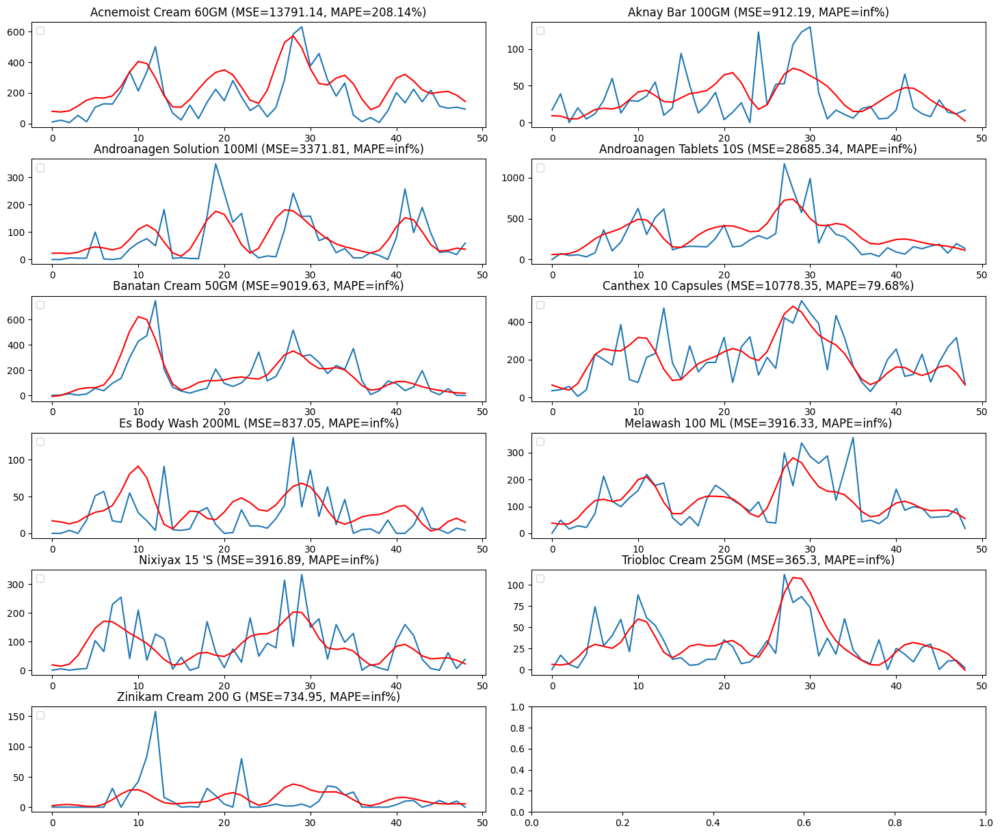

In [ ]:
df = pd.read_csv('salesweekly.csv')

subplotindex=0
numrows=6
numcols=2
fig, ax = plt.subplots(numrows, numcols, figsize=(18,15))
plt.subplots_adjust(wspace=0.1, hspace=0.3)

warnings.filterwarnings("ignore")

Acnemoist_Cream_60GM= {'series':'Acnemoist Cream 60GM','params_grid':{'changepoint_prior_scale': 50, 'interval_width': 0.0005}}
Aknay_Bar_100GM= {'series':'Aknay Bar 100GM','params_grid':{'changepoint_prior_scale': 0.01,  'interval_width': 0.0005}}
Androanagen_Solution_100Ml= {'series':'Androanagen Solution 100Ml','params_grid':{'changepoint_prior_scale': 0.01,  'interval_width': 0.0005}}
Androanagen_Tablets_10S= {'series':'Androanagen Tablets 10S','params_grid':{'changepoint_prior_scale': 5,  'interval_width': 0.0005, 'seasonality_prior_scale': 200}}
Banatan_Cream_50GM= {'series':'Banatan Cream 50GM','params_grid':{'changepoint_prior_scale': 5,  'interval_width': 0.0005}}
Canthex_10_Capsules= {'series':'Canthex 10 Capsules','params_grid':{'changepoint_prior_scale': 0.05,  'interval_width': 0.0005}}
Es_Body_Wash_200ML= {'series':'Es Body Wash 200ML','params_grid':{'changepoint_prior_scale': 0.1,  'interval_width': 0.0005, 'seasonality_prior_scale': 120}}
Melawash_100_ML= {'series':'Melawash 100 ML','params_grid':{'changepoint_prior_scale': 0.05,  'interval_width': 0.0005, 'seasonality_prior_scale': 200}}
Nixiyax_15_S= {'series':"Nixiyax 15 'S",'params_grid':{'changepoint_prior_scale': 0.05, 'interval_width': 0.0005, 'seasonality_prior_scale': 120}}
Triobloc_Cream_25GM= {'series':'Triobloc Cream 25GM','params_grid':{'changepoint_prior_scale': 0.01,  'interval_width': 0.0005, 'seasonality_prior_scale': 100}}
Zinikam_Cream_200_G= {'series':'Zinikam Cream 200 G','params_grid':{'changepoint_prior_scale': 0.1,  'interval_width': 0.0005, 'seasonality_prior_scale': 120}}


r=[Acnemoist_Cream_60GM,Aknay_Bar_100GM,Androanagen_Solution_100Ml,Androanagen_Tablets_10S,Banatan_Cream_50GM,Canthex_10_Capsules,Es_Body_Wash_200ML,Melawash_100_ML,Nixiyax_15_S,Triobloc_Cream_25GM,Zinikam_Cream_200_G]

for x in r:
    rowindex=math.floor(subplotindex/numcols)
    colindex=subplotindex-(rowindex*numcols)
    dfg=df[['datum',x['series']]]
    dfg = dfg.rename(columns={'datum': 'ds', x['series']: 'y'})
    size = int(len(dfg) - 50)
    dfgtrain=dfg.loc[0:size,:]
    dfgtest=dfg.loc[size+1:len(dfg),:]
    predictions = list()
    model = Prophet(changepoint_prior_scale=x['params_grid']['changepoint_prior_scale'],
                              growth='linear', interval_width=x['params_grid']['interval_width'],
                              daily_seasonality=False,
                              weekly_seasonality=False
                           )
    if(x=='Acnemoist Cream 60GM' or x=='Aknay Bar 100GM' or x=='Androanagen Solution 100Ml' or x=='Androanagen Tablets 10S'or x=='Banatan Cream 50GM'or x=='Canthex 10 Capsules' or x=='Es Body Wash 200ML' or x=='Melawash 100 ML' or x=="Nixiyax 15 'S" or x=='Triobloc Cream 25GM' or x == 'Zinikam Cream 200 G' ):
        model=model.add_seasonality(
                                name='yearly',
                                period=365.25,
                                prior_scale=x['params_grid']['seasonality_prior_scale'],
                                fourier_order=13)
    model_fit = model.fit(dfgtrain)
    future = model.make_future_dataframe(periods=50, freq='W')
    output = model.predict(future)
    predictions=output.loc[size+2:len(dfg),:]['yhat'].values

    error = mean_squared_error(dfgtest['y'].values, predictions)
    perror = mean_absolute_percentage_error(dfgtest['y'].values, predictions)
    resultsLongtermdf.loc['Prophet MSE',x['series']]=error
    resultsLongtermdf.loc['Prophet MAPE',x['series']]=perror
    ax[rowindex,colindex].set_title(x['series']+' (MSE=' + str(round(error,2))+', MAPE='+ str(round(perror,2)) +'%)')
    ax[rowindex,colindex].legend(['Real', 'Predicted'], loc='upper left')
    ax[rowindex,colindex].plot(dfgtest['y'].values)
    ax[rowindex,colindex].plot(predictions, color='red')
    subplotindex=subplotindex+1
plt.show()

####  Long-term forecasting with Prophet

04:58:44 - cmdstanpy - INFO - Chain [1] start processing
04:58:44 - cmdstanpy - INFO - Chain [1] done processing
04:58:45 - cmdstanpy - INFO - Chain [1] start processing
04:58:45 - cmdstanpy - INFO - Chain [1] done processing
04:58:45 - cmdstanpy - INFO - Chain [1] start processing
04:58:45 - cmdstanpy - INFO - Chain [1] done processing
04:58:45 - cmdstanpy - INFO - Chain [1] start processing
04:58:45 - cmdstanpy - INFO - Chain [1] done processing
04:58:45 - cmdstanpy - INFO - Chain [1] start processing
04:58:46 - cmdstanpy - INFO - Chain [1] done processing
04:58:46 - cmdstanpy - INFO - Chain [1] start processing
04:58:46 - cmdstanpy - INFO - Chain [1] done processing
04:58:46 - cmdstanpy - INFO - Chain [1] start processing
04:58:46 - cmdstanpy - INFO - Chain [1] done processing
04:58:46 - cmdstanpy - INFO - Chain [1] start processing
04:58:47 - cmdstanpy - INFO - Chain [1] done processing
04:58:47 - cmdstanpy - INFO - Chain [1] start processing
04:58:47 - cmdstanpy - INFO - Chain [1]

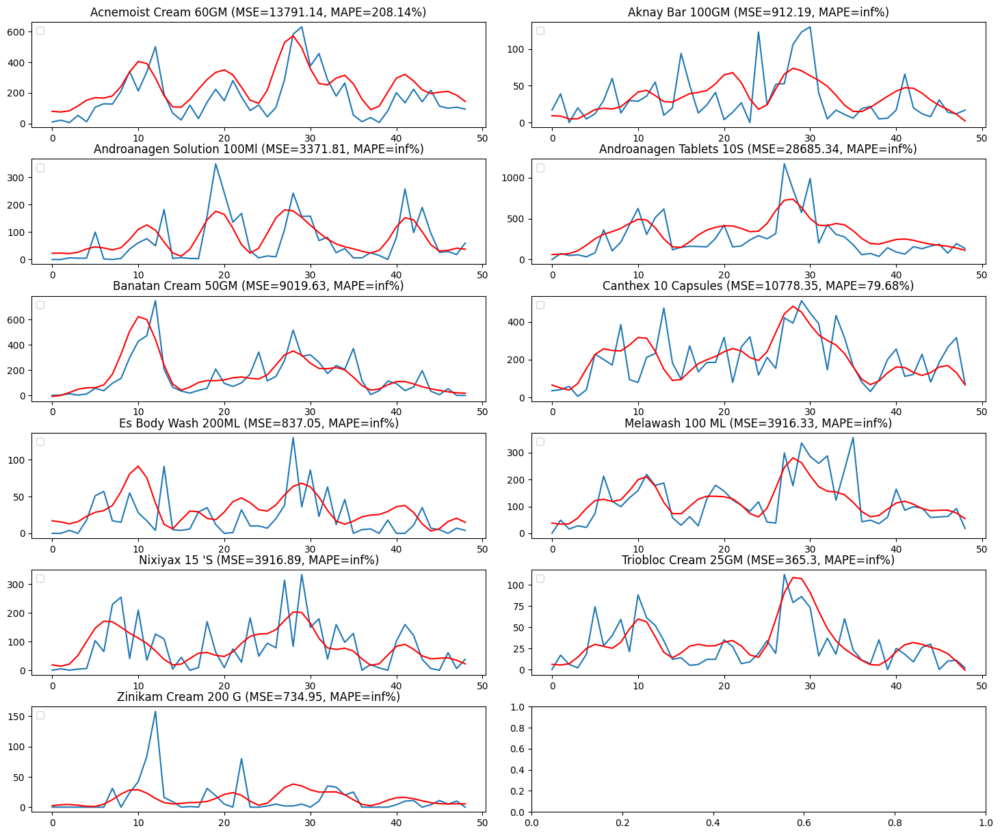

In [ ]:
df = pd.read_csv('salesweekly.csv')

subplotindex=0
numrows=6
numcols=2
fig, ax = plt.subplots(numrows, numcols, figsize=(18,15))
plt.subplots_adjust(wspace=0.1, hspace=0.3)

warnings.filterwarnings("ignore")

Acnemoist_Cream_60GM= {'series':'Acnemoist Cream 60GM','params_grid':{'changepoint_prior_scale': 50, 'interval_width': 0.0005}}
Aknay_Bar_100GM= {'series':'Aknay Bar 100GM','params_grid':{'changepoint_prior_scale': 0.01,  'interval_width': 0.0005}}
Androanagen_Solution_100Ml= {'series':'Androanagen Solution 100Ml','params_grid':{'changepoint_prior_scale': 0.01,  'interval_width': 0.0005}}
Androanagen_Tablets_10S= {'series':'Androanagen Tablets 10S','params_grid':{'changepoint_prior_scale': 5,  'interval_width': 0.0005, 'seasonality_prior_scale': 200}}
Banatan_Cream_50GM= {'series':'Banatan Cream 50GM','params_grid':{'changepoint_prior_scale': 5,  'interval_width': 0.0005}}
Canthex_10_Capsules= {'series':'Canthex 10 Capsules','params_grid':{'changepoint_prior_scale': 0.05,  'interval_width': 0.0005}}
Es_Body_Wash_200ML= {'series':'Es Body Wash 200ML','params_grid':{'changepoint_prior_scale': 0.1,  'interval_width': 0.0005, 'seasonality_prior_scale': 120}}
Melawash_100_ML= {'series':'Melawash 100 ML','params_grid':{'changepoint_prior_scale': 0.05,  'interval_width': 0.0005, 'seasonality_prior_scale': 200}}
Nixiyax_15_S= {'series':"Nixiyax 15 'S",'params_grid':{'changepoint_prior_scale': 0.05, 'interval_width': 0.0005, 'seasonality_prior_scale': 120}}
Triobloc_Cream_25GM= {'series':'Triobloc Cream 25GM','params_grid':{'changepoint_prior_scale': 0.01,  'interval_width': 0.0005, 'seasonality_prior_scale': 100}}
Zinikam_Cream_200_G= {'series':'Zinikam Cream 200 G','params_grid':{'changepoint_prior_scale': 0.1,  'interval_width': 0.0005, 'seasonality_prior_scale': 120}}

r=[Acnemoist_Cream_60GM,Aknay_Bar_100GM,Androanagen_Solution_100Ml,Androanagen_Tablets_10S,Banatan_Cream_50GM,Canthex_10_Capsules,Es_Body_Wash_200ML,Melawash_100_ML,Nixiyax_15_S,Triobloc_Cream_25GM,Zinikam_Cream_200_G]

for x in r:
    rowindex=math.floor(subplotindex/numcols)
    colindex=subplotindex-(rowindex*numcols)
    dfg=df[['datum',x['series']]]
    dfg = dfg.rename(columns={'datum': 'ds', x['series']: 'y'})
    size = int(len(dfg) - 50)
    dfgtrain=dfg.loc[0:size,:]
    dfgtest=dfg.loc[size+1:len(dfg),:]
    predictions = list()
    model = Prophet(changepoint_prior_scale=x['params_grid']['changepoint_prior_scale'],
                              growth='linear', interval_width=x['params_grid']['interval_width'],
                              daily_seasonality=False,
                              weekly_seasonality=False
                           )
    if(x=='Acnemoist Cream 60GM' or x=='Aknay Bar 100GM' or x=='Androanagen Solution 100Ml' or x=='Androanagen Tablets 10S'or x=='Banatan Cream 50GM'or x=='Canthex 10 Capsules' or x=='Es Body Wash 200ML' or x=='Melawash 100 ML' or x=="Nixiyax 15 'S" or x=='Triobloc Cream 25GM' or x == 'Zinikam Cream 200 G' ):
        model=model.add_seasonality(
                                name='yearly',
                                period=365.25,
                                prior_scale=x['params_grid']['seasonality_prior_scale'],
                                fourier_order=13)
    model_fit = model.fit(dfgtrain)
    future = model.make_future_dataframe(periods=50, freq='W')
    output = model.predict(future)
    predictions=output.loc[size+2:len(dfg),:]['yhat'].values

    error = mean_squared_error(dfgtest['y'].values, predictions)
    perror = mean_absolute_percentage_error(dfgtest['y'].values, predictions)
    resultsLongtermdf.loc['Prophet MSE',x['series']]=error
    resultsLongtermdf.loc['Prophet MAPE',x['series']]=perror
    ax[rowindex,colindex].set_title(x['series']+' (MSE=' + str(round(error,2))+', MAPE='+ str(round(perror,2)) +'%)')
    ax[rowindex,colindex].legend(['Real', 'Predicted'], loc='upper left')
    ax[rowindex,colindex].plot(dfgtest['y'].values)
    ax[rowindex,colindex].plot(predictions, color='red')
    subplotindex=subplotindex+1
plt.show()

###  Forecasting with LSTM

Long-term forecasting validation has been done with three LSTM configurations: Vanilla LSTM, Stacked LSTM and Bi-directional LSTM. Relu activation function was used, optimizer was Adam and loss function was Mean Squared Error. The best results were achieved with training the model in 400 epochs. Before fitting, all data was standardized (rescaled in interval -1,1) and transformed to data for supervised problem.

Number of past observations tested in input sequences was either 10 or 5. For series with larger variances and randomness (N05B and N05C) and simpler, Vanilla LSTM model, 10 past observations produced better forecasting accuracy. In all other cases, 5 past observations were used. This is the parameter that has been adopted.

In order to get reproducible results in forecasting with LSTM, following values are fixed: seed value, 'PYTHONHASHSEED' environment variable, Python's, numpy's and Tensorflow's built-in pseudo-random generators. A new global Tensorflow session is configured.

In [ ]:
seed_value= 0
import os
os.environ['PYTHONHASHSEED']=str(seed_value)
import random
random.seed(seed_value)
import numpy as np
np.random.seed(seed_value)
import tensorflow as tf
tf.random.set_seed(seed_value)

session_conf = tf.compat.v1.ConfigProto(intra_op_parallelism_threads=1, inter_op_parallelism_threads=1)
sess = tf.compat.v1.Session(graph=tf.compat.v1.get_default_graph(), config=session_conf)
tf.compat.v1.keras.backend.set_session(sess)

Components required for forecasting with LSTM are then imported. Function split_sequence for transforming time-series data to data for supervised machine learning problem is provided, including constants, such as number of previous steps to take into account.

In [ ]:
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import Bidirectional
from sklearn.preprocessing import MinMaxScaler

def split_sequence(sequence, n_steps):
    X, y = list(), list()
    for i in range(len(sequence)):
        end_ix = i + n_steps
        if end_ix > len(sequence)-1:
            break
        seq_x, seq_y = sequence[i:end_ix], sequence[end_ix]
        X.append(seq_x)
        y.append(seq_y)
    return array(X), array(y)

size = int(len(df) - 50)
n_steps=5
n_features = 1

####  Long-term forecasting with Vanilla LSTM configuration

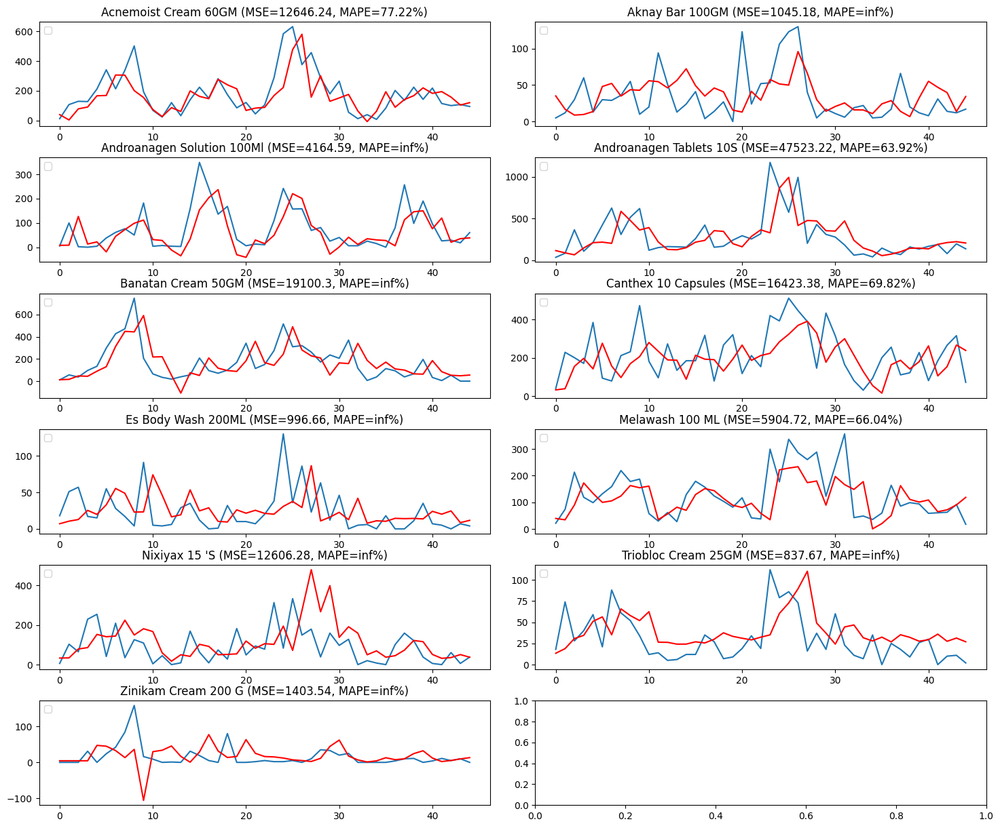

In [ ]:
df = pd.read_csv('salesweekly.csv')

subplotindex=0
numrows=6
numcols=2
fig, ax = plt.subplots(numrows, numcols, figsize=(18,15))
plt.subplots_adjust(wspace=0.1, hspace=0.3)

warnings.filterwarnings("ignore")

r=['Acnemoist Cream 60GM','Aknay Bar 100GM','Androanagen Solution 100Ml','Androanagen Tablets 10S','Banatan Cream 50GM','Canthex 10 Capsules','Es Body Wash 200ML','Melawash 100 ML',"Nixiyax 15 'S",'Triobloc Cream 25GM','Zinikam Cream 200 G']
for x in r:
    rowindex=math.floor(subplotindex/numcols)
    colindex=subplotindex-(rowindex*numcols)
    X=df[x].values
    scaler = MinMaxScaler(feature_range = (0, 1))
    X=scaler.fit_transform(X.reshape(-1, 1))
    X_train,y_train=split_sequence(X[0:size], n_steps)
    X_test,y_test=split_sequence(X[size:len(df)], n_steps)
    X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], n_features))
    model = Sequential()
    model.add(LSTM(100, activation='relu', input_shape=(n_steps, n_features)))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    model.fit(X_train, y_train, epochs=400, verbose=0)
    X_test = X_test.reshape((len(X_test), n_steps, n_features))
    predictions = model.predict(X_test, verbose=0)
    y_test=scaler.inverse_transform(y_test)
    predictions = scaler.inverse_transform(predictions)
    error = mean_squared_error(y_test, predictions)
    perror = mean_absolute_percentage_error(y_test, predictions)
    resultsLongtermdf.loc['Vanilla LSTM MSE',x]=error
    resultsLongtermdf.loc['Vanilla LSTM MAPE',x]=perror
    ax[rowindex,colindex].set_title(x+' (MSE=' + str(round(error,2))+', MAPE='+ str(round(perror,2)) +'%)')
    ax[rowindex,colindex].legend(['Real', 'Predicted'], loc='upper left')
    ax[rowindex,colindex].plot(y_test)
    ax[rowindex,colindex].plot(predictions, color='red')
    subplotindex=subplotindex+1
plt.show()

####  Long-term forecasting with Stacked LSTM model

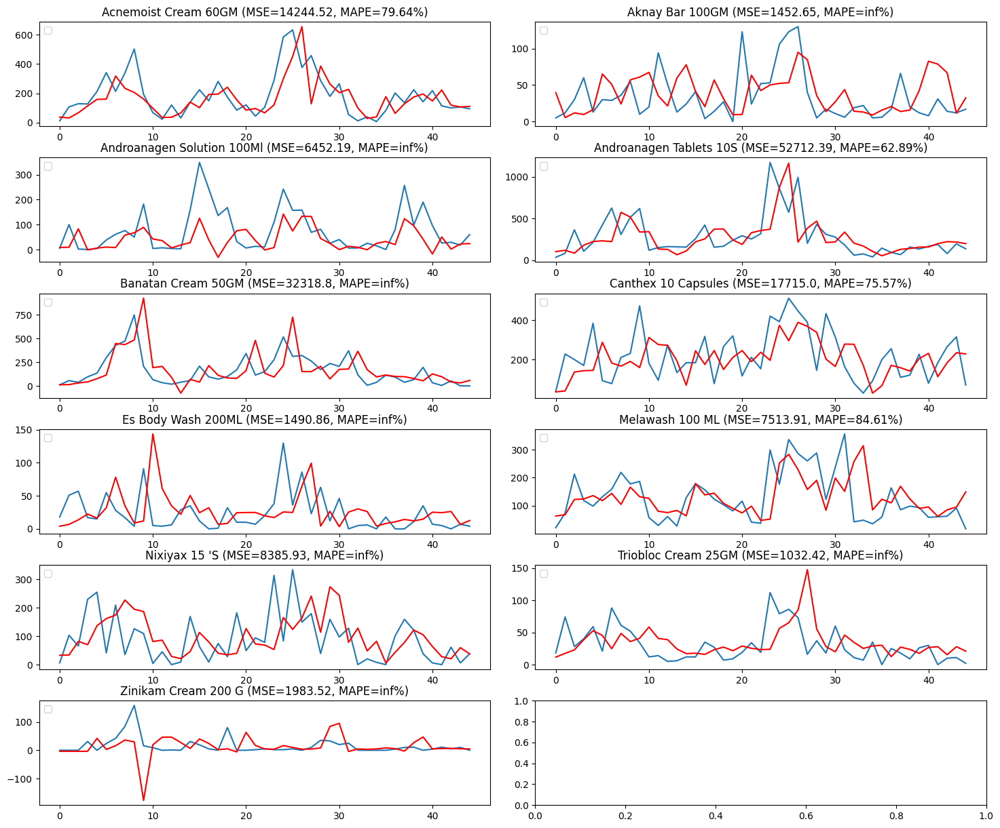

In [ ]:
df = pd.read_csv('salesweekly.csv')

subplotindex=0
numrows=6
numcols=2
fig, ax = plt.subplots(numrows, numcols, figsize=(18,15))
plt.subplots_adjust(wspace=0.1, hspace=0.3)

warnings.filterwarnings("ignore")

r=['Acnemoist Cream 60GM','Aknay Bar 100GM','Androanagen Solution 100Ml','Androanagen Tablets 10S','Banatan Cream 50GM','Canthex 10 Capsules','Es Body Wash 200ML','Melawash 100 ML',"Nixiyax 15 'S",'Triobloc Cream 25GM','Zinikam Cream 200 G']
for x in r:
    rowindex=math.floor(subplotindex/numcols)
    colindex=subplotindex-(rowindex*numcols)
    X=df[x].values
    scaler = MinMaxScaler(feature_range = (0, 1))
    X=scaler.fit_transform(X.reshape(-1, 1))
    X_train,y_train=split_sequence(X[0:size], n_steps)
    X_test,y_test=split_sequence(X[size:len(df)], n_steps)
    X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], n_features))

    model = Sequential()
    model.add(LSTM(100, activation='relu', return_sequences=True, input_shape=(n_steps, n_features)))
    model.add(LSTM(100, activation='relu'))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    model.fit(X_train, y_train, epochs=400, verbose=0)

    X_test = X_test.reshape((len(X_test), n_steps, n_features))
    predictions = model.predict(X_test, verbose=0)
    y_test=scaler.inverse_transform(y_test)
    predictions = scaler.inverse_transform(predictions)
    error = mean_squared_error(y_test, predictions)
    perror = mean_absolute_percentage_error(y_test, predictions)
    resultsLongtermdf.loc['Stacked LSTM MSE',x]=error
    resultsLongtermdf.loc['Stacked LSTM MAPE',x]=perror
    ax[rowindex,colindex].set_title(x+' (MSE=' + str(round(error,2))+', MAPE='+ str(round(perror,2)) +'%)')
    ax[rowindex,colindex].legend(['Real', 'Predicted'], loc='upper left')
    ax[rowindex,colindex].plot(y_test)
    ax[rowindex,colindex].plot(predictions, color='red')
    subplotindex=subplotindex+1
plt.show()

####  Long-term forecasting with Bidirectional LSTM

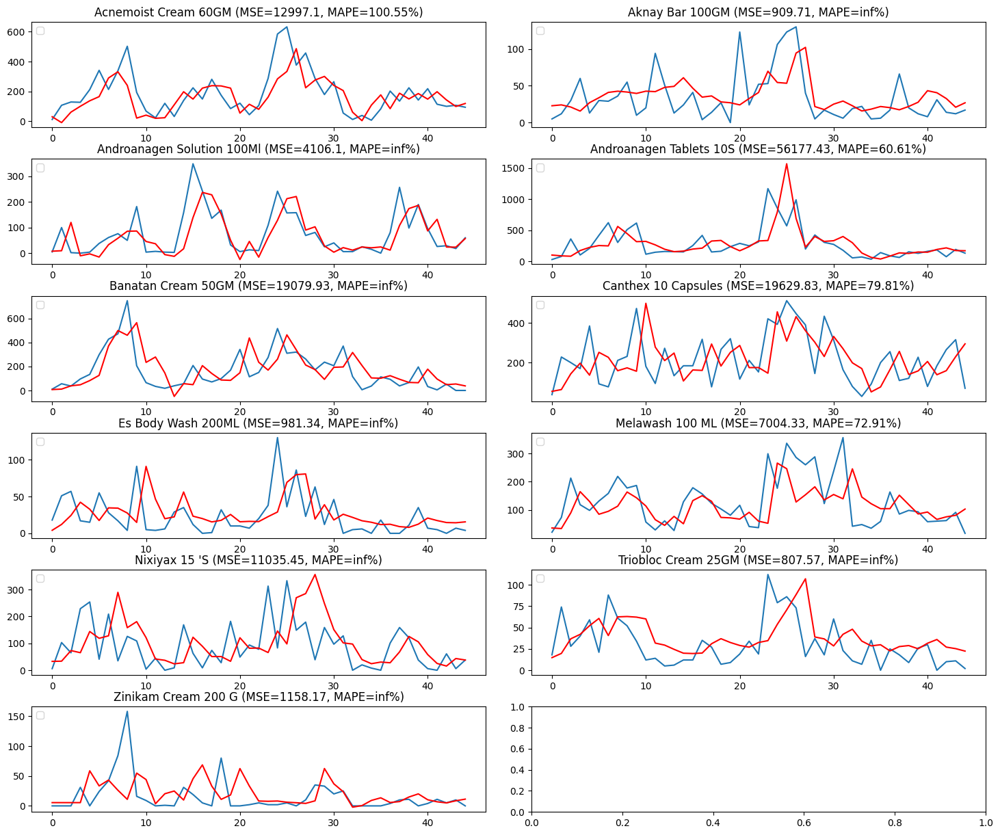

In [ ]:
df = pd.read_csv('salesweekly.csv')

subplotindex=0
numrows=6
numcols=2
fig, ax = plt.subplots(numrows, numcols, figsize=(18,15))
plt.subplots_adjust(wspace=0.1, hspace=0.3)

warnings.filterwarnings("ignore")
# Create a dictionary to store your models
models = {}
r=['Acnemoist Cream 60GM','Aknay Bar 100GM','Androanagen Solution 100Ml','Androanagen Tablets 10S','Banatan Cream 50GM','Canthex 10 Capsules','Es Body Wash 200ML','Melawash 100 ML',"Nixiyax 15 'S",'Triobloc Cream 25GM','Zinikam Cream 200 G']
for x in r:
    rowindex=math.floor(subplotindex/numcols)
    colindex=subplotindex-(rowindex*numcols)
    X=df[x].values
    scaler = MinMaxScaler(feature_range = (0, 1))
    X=scaler.fit_transform(X.reshape(-1, 1))
    X_train,y_train=split_sequence(X[0:size], n_steps)
    X_test,y_test=split_sequence(X[size:len(df)], n_steps)
    X_train = X_train.reshape((X_train.shape[0], X_train.shape[1], n_features))

    model = Sequential()
    model.add(Bidirectional(LSTM(50, activation='relu'), input_shape=(n_steps, n_features)))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mse')
    model.fit(X_train, y_train, epochs=400, verbose=0)

    # Save the Bidirectional LSTM model
    model.save(f'{x}_bidirectional_lstm_model.h5')

    # Store the model in the dictionary
    models[x] = model

    X_test = X_test.reshape((len(X_test), n_steps, n_features))
    predictions = model.predict(X_test, verbose=0)
    y_test=scaler.inverse_transform(y_test)
    predictions = scaler.inverse_transform(predictions)
    error = mean_squared_error(y_test, predictions)
    perror = mean_absolute_percentage_error(y_test, predictions)
    resultsLongtermdf.loc['Bidirectional LSTM MSE',x]=error
    resultsLongtermdf.loc['Bidirectional LSTM MAPE',x]=perror
    ax[rowindex,colindex].set_title(x+' (MSE=' + str(round(error,2))+', MAPE='+ str(round(perror,2)) +'%)')
    ax[rowindex,colindex].legend(['Real', 'Predicted'], loc='upper left')
    ax[rowindex,colindex].plot(y_test)
    ax[rowindex,colindex].plot(predictions, color='red')
    subplotindex=subplotindex+1
plt.show()

In [ ]:
import pandas as pd

# 5. Conclusion

For rolling forecast, ARIMA method (Auto-ARIMA for series with seasonal character) outperforms Prophet and is considered as a best candidate for short-term sales forecasting. All methods in all cases (with exception of Prophet) outperform reference benchmarks - Naive and Seasonal Naive forecasts.

For long-term forecasting, Prophet and LSTM models have shown significantly better performance then benchmarks in the time series with seasonality. In all cases, even without optimization, LSTM models have achieved competitive performance.

In [ ]:
from IPython.display import display, HTML
display(HTML(resultsLongtermdf.to_html()))

,Acnemoist Cream 60GM,Aknay Bar 100GM,Androanagen Solution 100Ml,Androanagen Tablets 10S,Banatan Cream 50GM,Canthex 10 Capsules,Es Body Wash 200ML,Melawash 100 ML,Nixiyax 15 'S,Triobloc Cream 25GM,Zinikam Cream 200 G
Average MSE,21481.100989,1066.657636,7053.933621,6.009258e+04,2.591321e+04,18095.092666,727.575906,9100.715283,7.436350e+03,741.031147,762.810723
Average MAPE,277.790256,inf,inf,inf,inf,176.927743,inf,inf,inf,inf,inf
ARIMA MSE,22423.219073,1626.030112,7351.043869,5.024263e+04,2.871814e+04,18484.317748,733.380723,9620.866265,7.350102e+03,1152.158480,773.210990
ARIMA MAPE,256.824339,inf,inf,inf,inf,95.777623,inf,inf,inf,inf,inf
AutoARIMA MSE,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000
AutoARIMA MAPE,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000
Prophet MSE,13791.144925,912.194679,3371.805017,2.868534e+04,9.019632e+03,10778.347969,837.047812,3916.332447,3.916891e+03,365.296483,734.952583
Prophet MAPE,208.135772,inf,inf,inf,inf,79.680175,inf,inf,inf,inf,inf
Vanilla LSTM MSE,12820.688930,1196.403890,4574.533361,4.863030e+04,1.860956e+04,16684.421092,830.755524,6127.568621,1.043221e+04,796.548995,1359.461875
Vanilla LSTM MAPE,83.787949,inf,inf,6.098805e+01,inf,72.867925,inf,65.862334,inf,inf,inf


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data into a DataFrame
data = {
    "Product": ["Acnemoist Cream 60GM", "Aknay Bar 100GM", "Androanagen Solution 100Ml", "Androanagen Tablets 10S", "Banatan Cream 50GM", "Canthex 10 Capsules", "Es Body Wash 200ML", "Melawash 100 ML", "Nixiyax 15 'S", "Triobloc Cream 25GM", "Zinikam Cream 200 G"],
    "Naïve MSE": [21481.10, 1066.66, 7053.93, 60092.58, 25913.21, 18095.09, 727.58, 9100.72, 7436.35, 741.03, 762.81],
    "ARIMA MSE": [22423.22, 1626.03, 7351.04, 50242.63, 28718.14, 18484.32, 733.38, 9620.87, 7350.10, 1152.16, 773.21],

    "Prophet MSE": [13791.14, 912.19, 3371.81, 28685.34, 9019.63, 10778.35, 837.05, 3916.33, 3916.89, 365.30, 734.95],
    "Vanilla LSTM MSE": [12820.69, 1196.40, 4574.53, 48630.30, 18609.56, 16684.42, 830.76, 6127.57, 10432.21, 796.55, 1359.46],
    "Stacked LSTM MSE": [14968.09, 1259.94, 4998.89, 51205.39, 32364.53, 17082.75, 2098.92, 5994.11, 8732.19, 822.31, 1473.47],
    "Bidirectional LSTM MSE": [12488.86, 1030.92, 3826.93, 57488.06, 19046.85, 19647.98, 903.58, 7430.21, 11690.38, 825.35, 1216.09]
}

df = pd.DataFrame(data)

# Calculate additional metrics
df["MAE"] = df[["Naïve MSE", "ARIMA MSE", "Prophet MSE", "Vanilla LSTM MSE", "Stacked LSTM MSE", "Bidirectional LSTM MSE"]].mean(axis=1)
df["RMSE"] = df[["Naïve MSE", "ARIMA MSE", "Prophet MSE", "Vanilla LSTM MSE", "Stacked LSTM MSE", "Bidirectional LSTM MSE"]].std(axis=1)


# Print the DataFrame
print("Full results table:")

Full results table:


In [ ]:
df

,Product,Naïve MSE,ARIMA MSE,Prophet MSE,Vanilla LSTM MSE,Stacked LSTM MSE,Bidirectional LSTM MSE,MAE,RMSE
0,Acnemoist Cream 60GM,21481.10,22423.22,13791.14,12820.69,14968.09,12488.86,16328.850000,4450.424145
1,Aknay Bar 100GM,1066.66,1626.03,912.19,1196.40,1259.94,1030.92,1182.023333,249.948218
2,Androanagen Solution 100Ml,7053.93,7351.04,3371.81,4574.53,4998.89,3826.93,5196.188333,1656.695519
3,Androanagen Tablets 10S,60092.58,50242.63,28685.34,48630.30,51205.39,57488.06,49390.716667,11076.159081
4,Banatan Cream 50GM,25913.21,28718.14,9019.63,18609.56,32364.53,19046.85,22278.653333,8439.317475
5,Canthex 10 Capsules,18095.09,18484.32,10778.35,16684.42,17082.75,19647.98,16795.485000,3129.812607
6,Es Body Wash 200ML,727.58,733.38,837.05,830.76,2098.92,903.58,1021.878333,531.891676
7,Melawash 100 ML,9100.72,9620.87,3916.33,6127.57,5994.11,7430.21,7031.635000,2132.746096
8,Nixiyax 15 'S,7436.35,7350.10,3916.89,10432.21,8732.19,11690.38,8259.686667,2723.155810
9,Triobloc Cream 25GM,741.03,1152.16,365.30,796.55,822.31,825.35,783.783333,251.409067
